# NORMALIZATION METHOD TESTS

In this notebook we will test some methods of data window noralization, and the effect they have on the predictive behaviour of our model.

In [9]:
import os
import time
import math
from pathlib import Path
from glob import glob
from random import shuffle
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pywt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from data_processor_Stdnorm import DataLoader as DataLoader_Std
from default_model import Model

Define functions for plots

In [3]:
def plot_results_multiple(predicted_data, true_data, prediction_len):
    fig = plt.figure(facecolor='white')
    ax = fig.add_subplot(111)
    ax.plot(true_data, label='True Data')
    #Pad the list of predictions to shift it in the graph to it's correct start
    for i, data in enumerate(predicted_data):
        padding = [None for p in range(i * prediction_len)]
        plt.plot(padding + data, label='Prediction')
        #plt.legend(loc='lower right')
    plt.show()
    
# increase size of plots:
default_dpi = mpl.rcParamsDefault['figure.dpi']
mpl.rcParams['figure.dpi'] = default_dpi*2

### The following function chooses a normalization method and runs an initial training session, then displays a plot of 50 step predictions for analysis.

Different methods for normalization are coded here as DataLoader class overrides, with new definitions normalization methods for trials.

In [16]:
def TrainTestPlot(settings, features, normMethod='STD'):
    if not os.path.exists(settings['saveDir']): os.makedirs(settings['saveDir'])
        
    model = Model()
    model.build_model(settings['input_timesteps'], settings['input_dim'])
    
    pathlist = glob('..\data\IndicatorsAdded\**\*.csv')
    shuffle(pathlist)
    
    i = 1
    t = len(pathlist)
    for path in pathlist:
        pathStr = str(path)
        pairStr = pathStr.split('\\')[1][:-4]
        print('USING DATA({}/{}): [{}]'.format(i, t, pathStr))        
        i += 1
        
        if normMethod.upper() == 'STD':
            data = DataLoader_Std(pathStr, settings['train_test_split'], features)
        elif normMethod.upper() == 'MINMAX1':
            data = Data_Loader_MinMax1(pathStr, settings['train_test_split'], features)
        elif normMethod.upper() == 'MINMAX3':
            data = Data_Loader_MinMax3(pathStr, settings['train_test_split'], features)
        elif normMethod.upper() == 'MINMAX1_5':
            data = Data_Loader_MinMax1_5(pathStr, settings['train_test_split'], features)
        elif normMethod.upper() == 'STD_WT':
            data = Data_Loader_StdWT(pathStr, settings['train_test_split'], features)
        elif normMethod.upper() == 'MINMAX1_WT':
            data = Data_Loader_MinMaxWT(pathStr, settings['train_test_split'], features)
        elif normMethod.upper() == 'MINMAX3_WT':
            data = Data_Loader_MinMax3WT(pathStr, settings['train_test_split'], features) 
        elif normMethod.upper() == 'MINMAX1_5_WT':
            data = Data_Loader_MinMax1_5_WT(pathStr, settings['train_test_split'], features)            
            
        x, y = data.get_train_data(seq_len=settings['sequence_length'], normalise=settings['normalize'])
        
        # out-of memory generative training
        steps_per_epoch = math.ceil((data.len_train - settings['sequence_length']) / settings['batch_size'])
        model.train_generator(
            data_gen = data.generate_train_batch(
                seq_len = settings['sequence_length'],
                batch_size = settings['batch_size'],
                normalise = settings['normalize']
            ),
            epochs = settings['epochs'],
            batch_size = settings['batch_size'],
            steps_per_epoch = steps_per_epoch,
            save_dir = settings['saveDir'],
            save_name = settings['model_name']
        )
        
        x_test, y_test = data.get_test_data(seq_len=settings['sequence_length'], normalise=settings['normalize'])
        predictions = model.predict_sequences_multiple(x_test, settings['predict_sequence'], settings['predict_sequence'])
        
        plot_results_multiple(predictions, y_test, settings['predict_sequence'])        
        
        
class Data_Loader_MinMax1(DataLoader_Std):
    def normalise_windows(self, window_data, single_window=False):
        normalised_data = []
        window_data = [window_data] if single_window else window_data
        scaler = MinMaxScaler()            
        for window in window_data:
            normalised_window = []
            for col_i in range(window.shape[1]):
                
                preNorm = window[:, col_i].reshape(-1, 1)
                normalised_col = scaler.fit_transform(preNorm).reshape(-1)                              
                normalised_window.append(normalised_col)
               
            normalised_window = np.array(normalised_window).T
            normalised_data.append(normalised_window)
        return np.array(normalised_data)        
        
class Data_Loader_MinMax3(DataLoader_Std):
    def normalise_windows(self, window_data, single_window=False):
        normalised_data = []
        window_data = [window_data] if single_window else window_data
        scaler = MinMaxScaler((0,3))            
        for window in window_data:
            normalised_window = []
            for col_i in range(window.shape[1]):
                
                preNorm = window[:, col_i].reshape(-1, 1)
                normalised_col = scaler.fit_transform(preNorm).reshape(-1)                              
                normalised_window.append(normalised_col)
               
            normalised_window = np.array(normalised_window).T
            normalised_data.append(normalised_window)
        return np.array(normalised_data)   
    
class Data_Loader_MinMax1_5(DataLoader_Std):
    def normalise_windows(self, window_data, single_window=False):
        normalised_data = []
        window_data = [window_data] if single_window else window_data
        scaler = MinMaxScaler((1,5))            
        for window in window_data:
            normalised_window = []
            for col_i in range(window.shape[1]):
                
                preNorm = window[:, col_i].reshape(-1, 1)
                normalised_col = scaler.fit_transform(preNorm).reshape(-1)                              
                normalised_window.append(normalised_col)
               
            normalised_window = np.array(normalised_window).T
            normalised_data.append(normalised_window)
        return np.array(normalised_data)
    
class Data_Loader_StdWT(DataLoader_Std):
    def normalise_windows(self, window_data, single_window=False):
        normalised_data = []
        window_data = [window_data] if single_window else window_data
        scaler = StandardScaler()            
        for window in window_data:
            normalised_window = []
            for col_i in range(window.shape[1]):
                
                preNorm = window[:, col_i].reshape(-1, 1)
                normalised_col = scaler.fit_transform(preNorm).reshape(-1)
                cA, cD = pywt.dwt(normalised_col, 'haar')
                normalised_window.append(cA)
                normalised_window.append(cD)
               
            normalised_window = np.array(normalised_window).T 
            normalised_data.append(normalised_window)
        return np.array(normalised_data)
    
class Data_Loader_MinMaxWT(DataLoader_Std):
    def normalise_windows(self, window_data, single_window=False):
        normalised_data = []
        window_data = [window_data] if single_window else window_data
        scaler = MinMaxScaler()            
        for window in window_data:
            normalised_window = []
            for col_i in range(window.shape[1]):
                
                preNorm = window[:, col_i].reshape(-1, 1)
                normalised_col = scaler.fit_transform(preNorm).reshape(-1)
                cA, cD = pywt.dwt(normalised_col, 'haar')
                normalised_window.append(cA)
                normalised_window.append(cD)
               
            normalised_window = np.array(normalised_window).T 
            normalised_data.append(normalised_window)
        return np.array(normalised_data)
    
class Data_Loader_MinMax3_WT(DataLoader_Std):
    def normalise_windows(self, window_data, single_window=False):
        normalised_data = []
        window_data = [window_data] if single_window else window_data
        scaler = MinMaxScaler((0,3))            
        for window in window_data:
            normalised_window = []
            for col_i in range(window.shape[1]):
                
                preNorm = window[:, col_i].reshape(-1, 1)
                normalised_col = scaler.fit_transform(preNorm).reshape(-1)
                cA, cD = pywt.dwt(normalised_col, 'haar')
                normalised_window.append(cA)
                normalised_window.append(cD)
               
            normalised_window = np.array(normalised_window).T 
            normalised_data.append(normalised_window)
        return np.array(normalised_data)
    
class Data_Loader_MinMax1_5_WT(DataLoader_Std):
    def normalise_windows(self, window_data, single_window=False):
        normalised_data = []
        window_data = [window_data] if single_window else window_data
        scaler = MinMaxScaler((1,5))            
        for window in window_data:
            normalised_window = []
            for col_i in range(window.shape[1]):
                
                preNorm = window[:, col_i].reshape(-1, 1)
                normalised_col = scaler.fit_transform(preNorm).reshape(-1)
                cA, cD = pywt.dwt(normalised_col, 'haar')
                normalised_window.append(cA)
                normalised_window.append(cD)
               
            normalised_window = np.array(normalised_window).T 
            normalised_data.append(normalised_window)
        return np.array(normalised_data)

Preliminary settings and parameter configuration:

In [5]:
config = {
    'data_path' : '../data/IndicatorsAdded',
    'model_name' : 'Model_NoNorm',
    'saveDir' : 'saved_models',
    
    'train_test_split' : 0.96,
    'sequence_length' : 50,
    'epochs' : 1,
    'batch_size' : 32,
    'normalize' : False,
    
    'input_timesteps' : 49,
    'input_dim' : 16,
    
    'predict_sequence' : 49
}    

# specify which features/columns to use for training
# 'Close' should be listed first if this is what we are predicting
columns = [            
    "Close",
    "High",
    "Low",
    "Volume",            
    "EMA_20", 
    "EMA_12_26_PDIFF",
    "CCI",
    "MACD",
    "MACD_SIG",
    "MACD_HIST",
    "ATR",
    "BOLBAND_UP",
    "BOLBAND_MID",
    "BOLBAND_LOW",
    "MOM20",
    "ROC10"
]

## NORMALIZATION TESTING BEGINS 

Here we run partial epochs, or full epochs, and analyze the returned prediction plots to decide what method/combination of scaling to use.

[Model] Model Compiled
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 320s 385ms/step - loss: 6.6938e-04
[Model] Training Completed. Model saved as saved_models\Model_NoNorm_20181014_202722.h5
Time taken: 0:05:24.956445


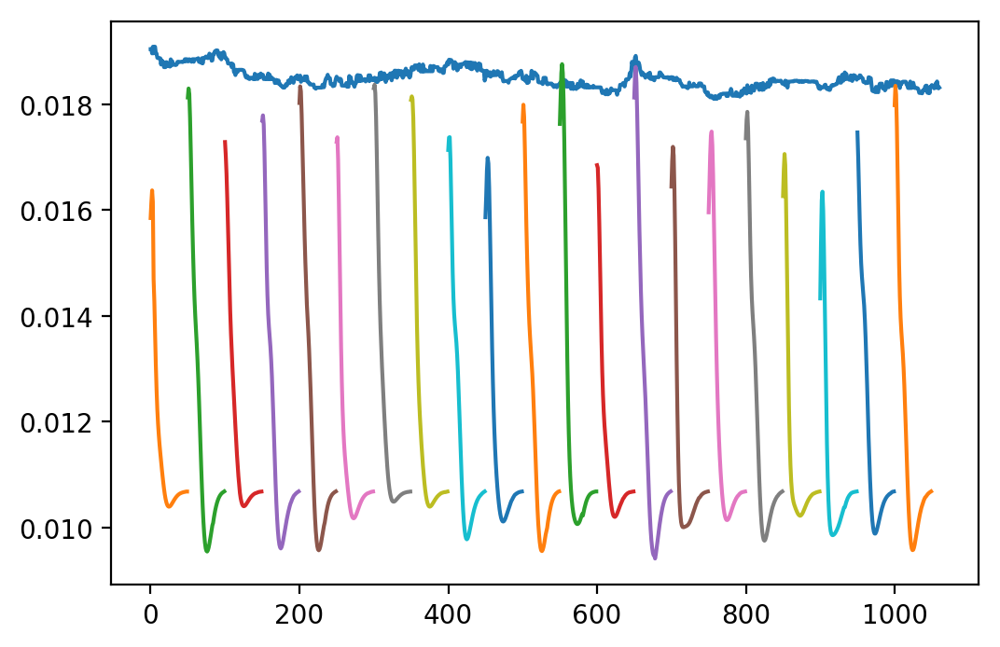

[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 317s 381ms/step - loss: 5.1961e-05
[Model] Training Completed. Model saved as saved_models\Model_NoNorm_20181014_203506.h5
Time taken: 0:05:17.219624


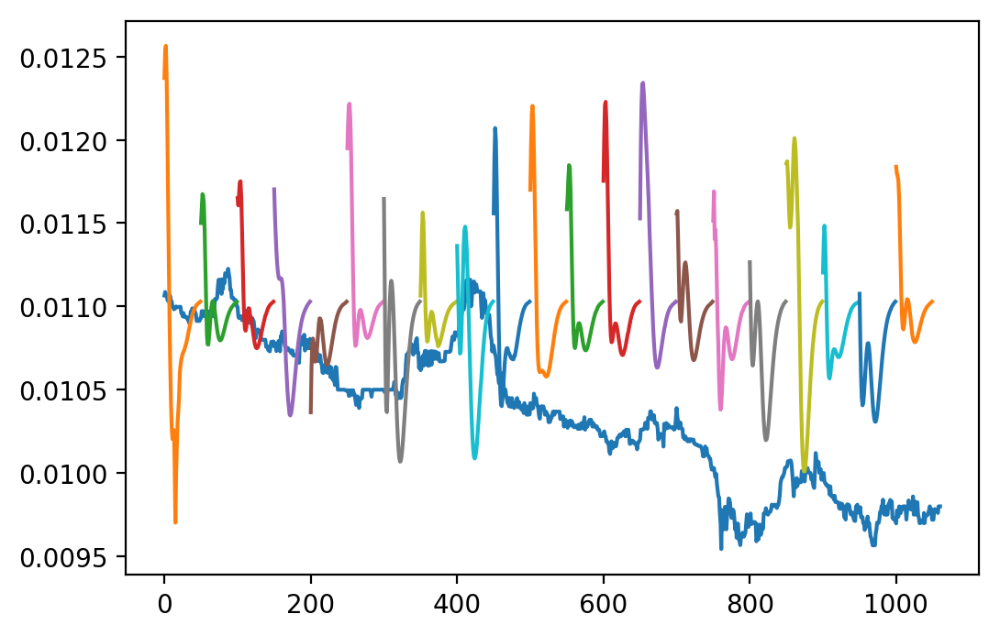

[Model] Training Started
[Model] 1 epochs, 32 batch size, 330 batches per epoch
Epoch 1/1
330/330 [==============================] - 125s 380ms/step - loss: 2.8360e-05
[Model] Training Completed. Model saved as saved_models\Model_NoNorm_20181014_204247.h5
Time taken: 0:02:05.384583


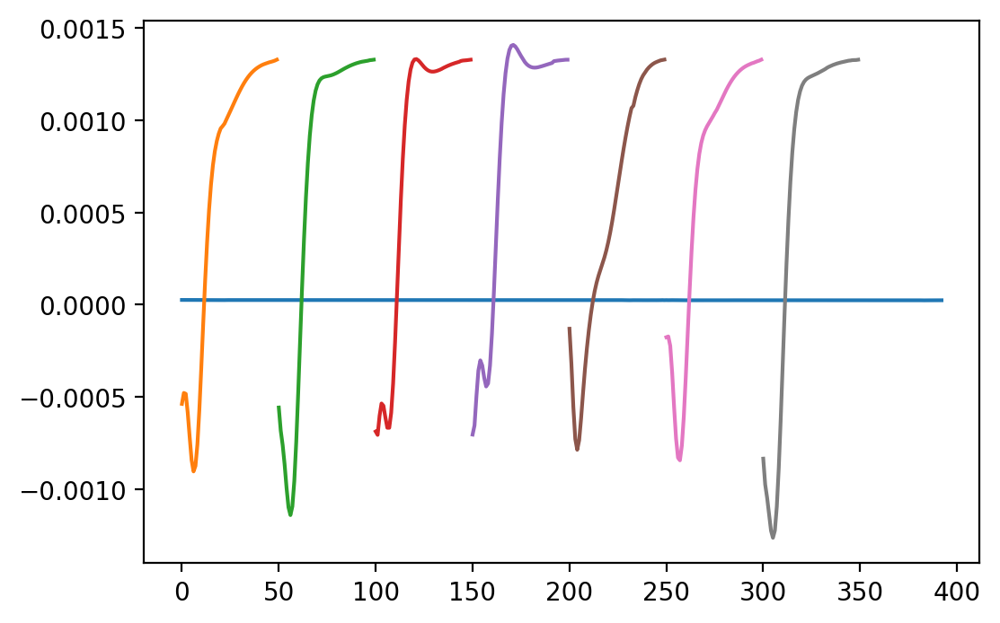

[Model] Training Started
[Model] 1 epochs, 32 batch size, 712 batches per epoch
Epoch 1/1
712/712 [==============================] - 260s 365ms/step - loss: 1.7796e-05
[Model] Training Completed. Model saved as saved_models\Model_NoNorm_20181014_204541.h5
Time taken: 0:04:19.951672


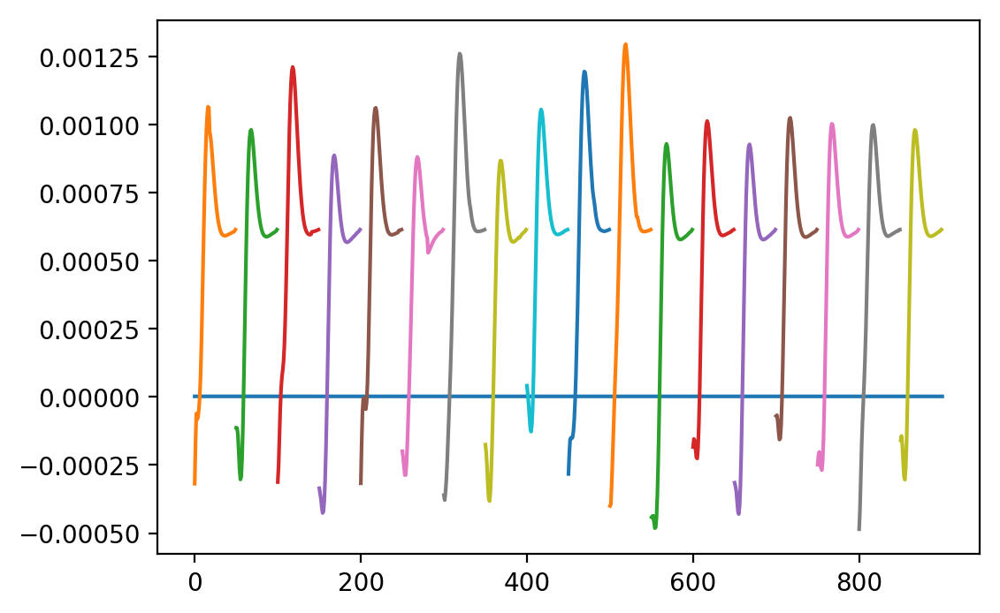

[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 305s 366ms/step - loss: 7.1153e-06
[Model] Training Completed. Model saved as saved_models\Model_NoNorm_20181014_205157.h5
Time taken: 0:05:04.946148


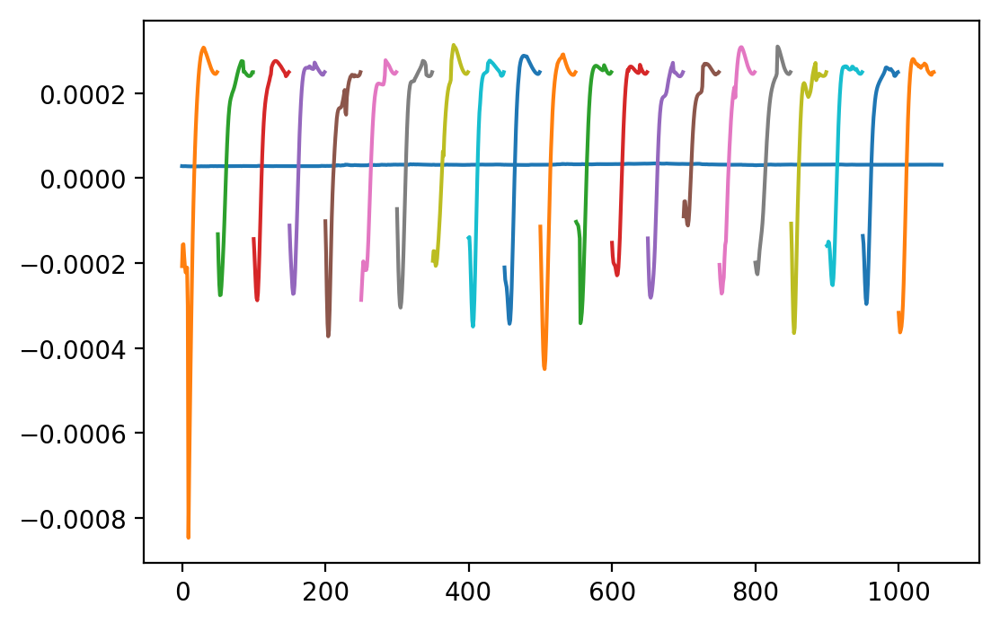

In [7]:
TrainTestPlot(config, columns)

[Model] Model Compiled
USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_HMQ.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 305 batches per epoch
Epoch 1/1
305/305 [==============================] - 121s 395ms/step - loss: 0.6814
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:04.894604


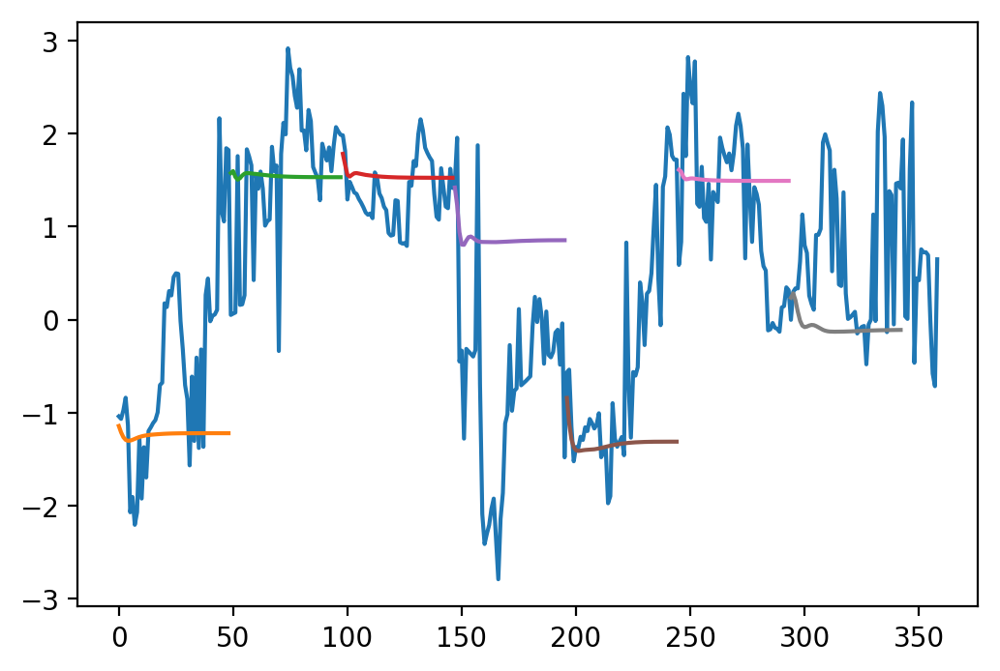

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_STEEM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 569 batches per epoch
Epoch 1/1
569/569 [==============================] - 214s 376ms/step - loss: 0.4558
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:03:33.946437


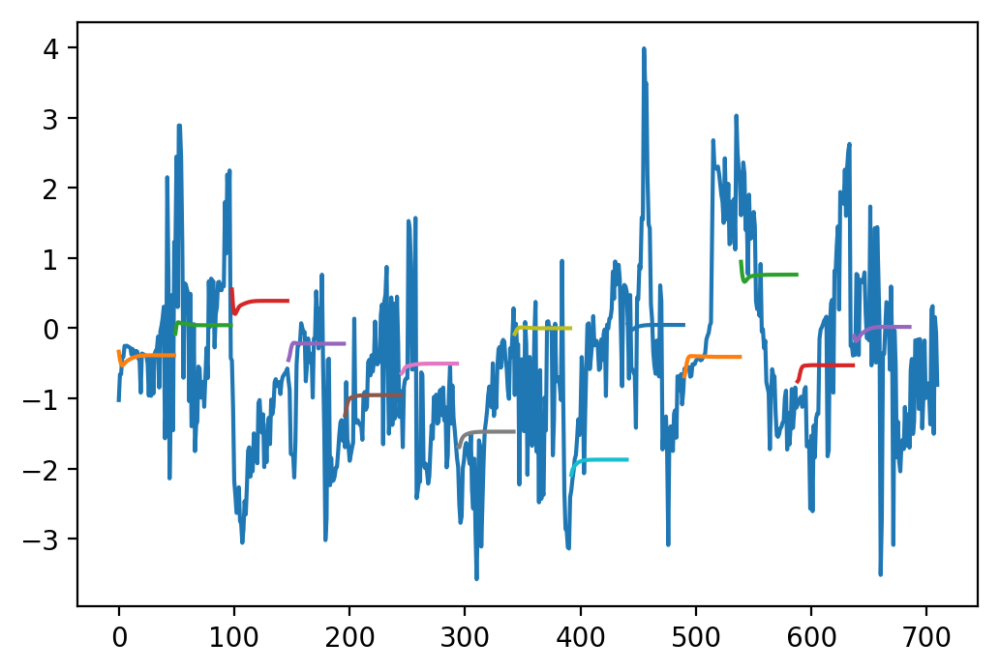

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_FUN.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 391 batches per epoch
Epoch 1/1
391/391 [==============================] - 147s 376ms/step - loss: 0.3982
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:27.186909


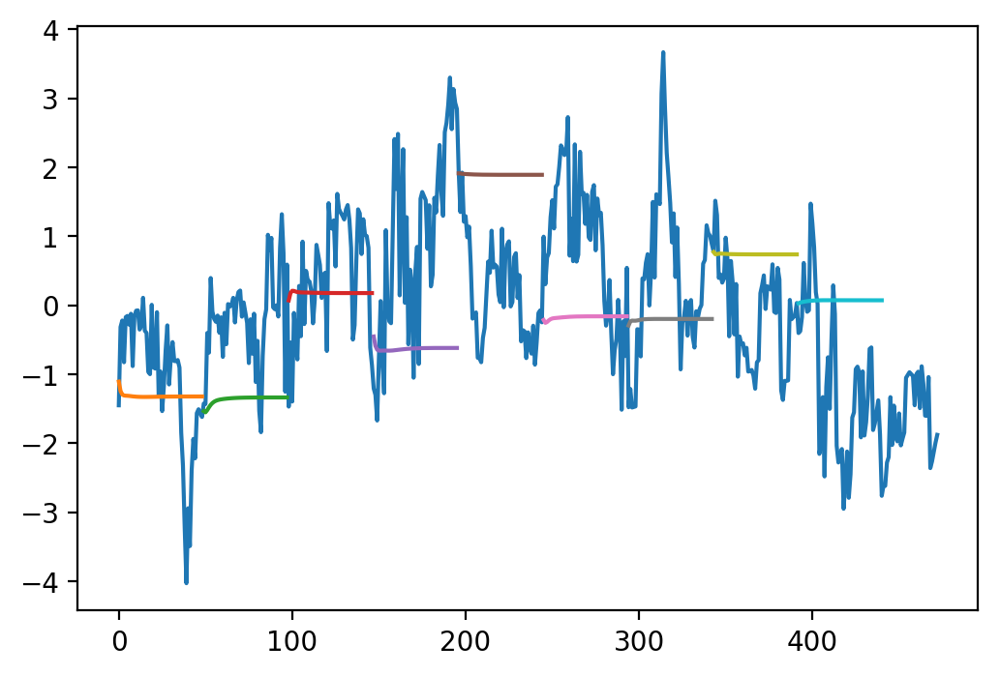

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_XLM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 316s 380ms/step - loss: 0.3393
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:05:16.383293


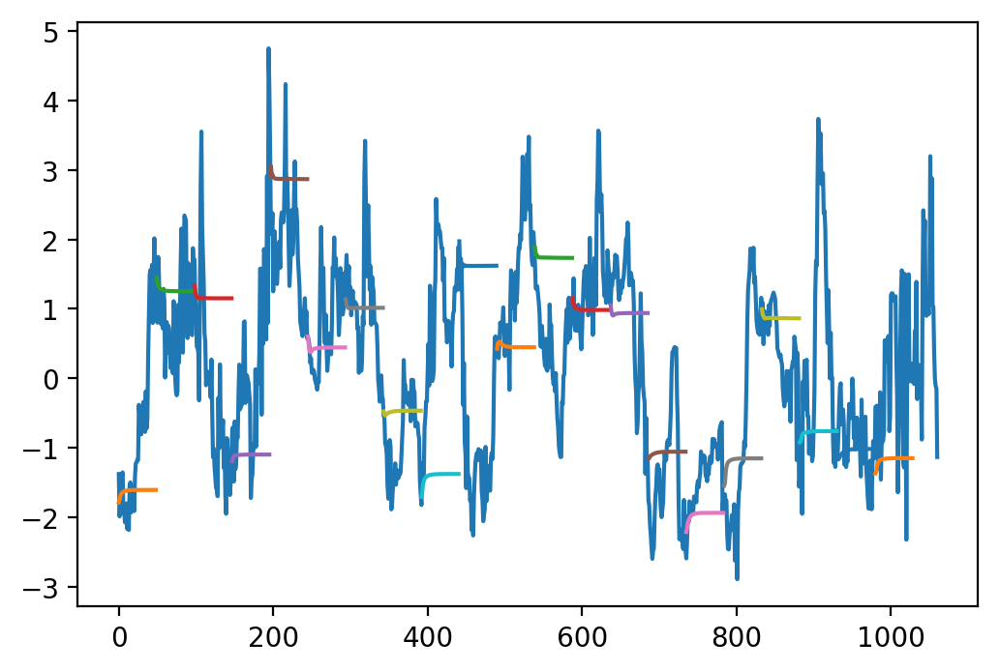

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_PAY.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 505 batches per epoch
Epoch 1/1
505/505 [==============================] - 190s 377ms/step - loss: 0.3583
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:03:10.316470


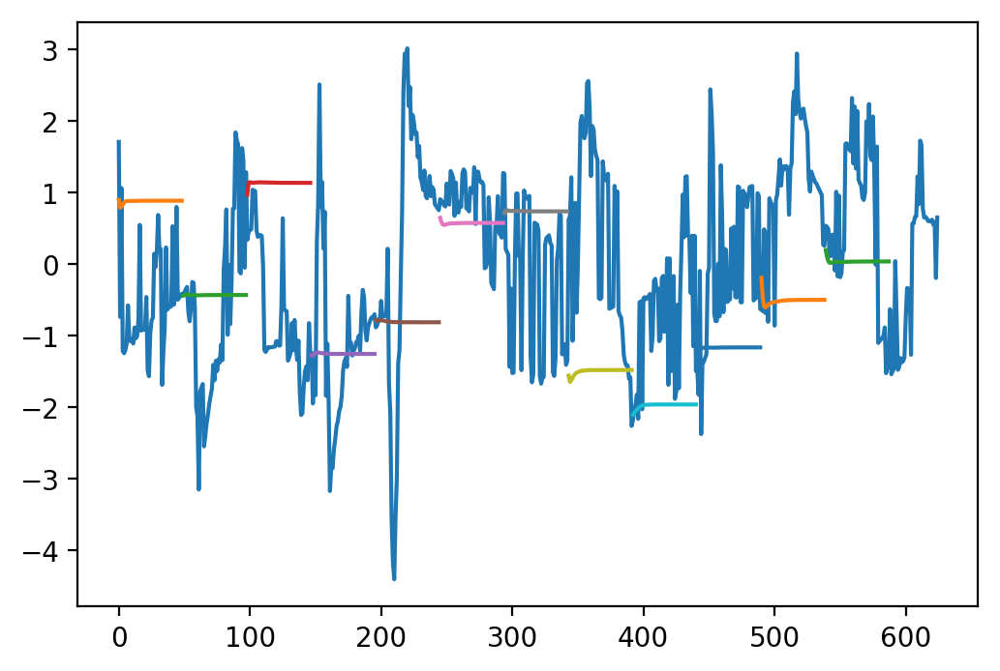

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_NEO.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 315s 378ms/step - loss: 0.3571
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:05:14.891796


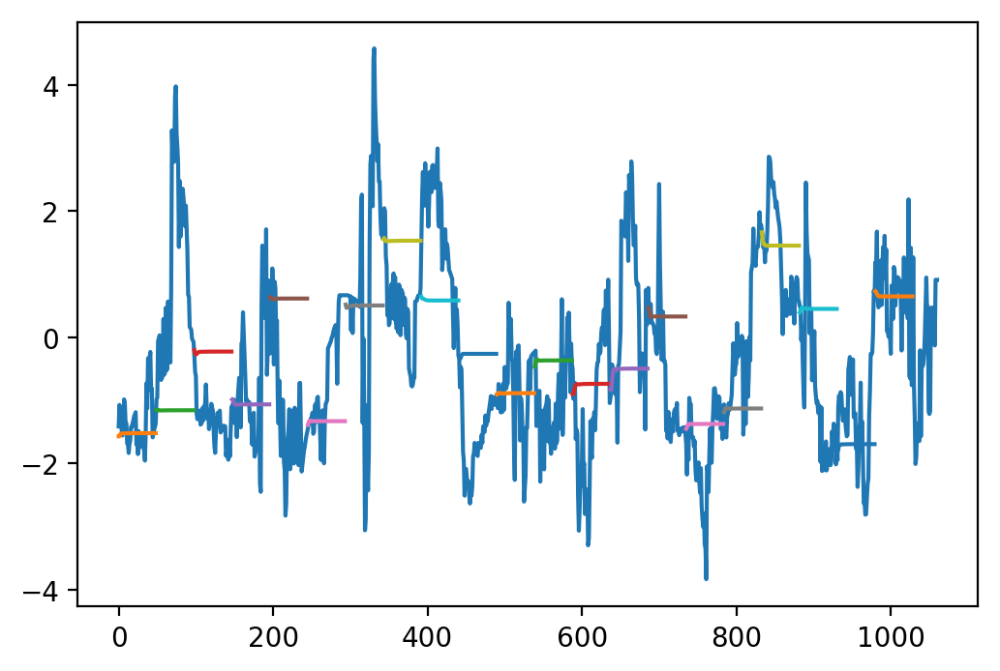

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_LSK.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 807 batches per epoch
Epoch 1/1
807/807 [==============================] - 307s 381ms/step - loss: 0.3767
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:05:07.198326


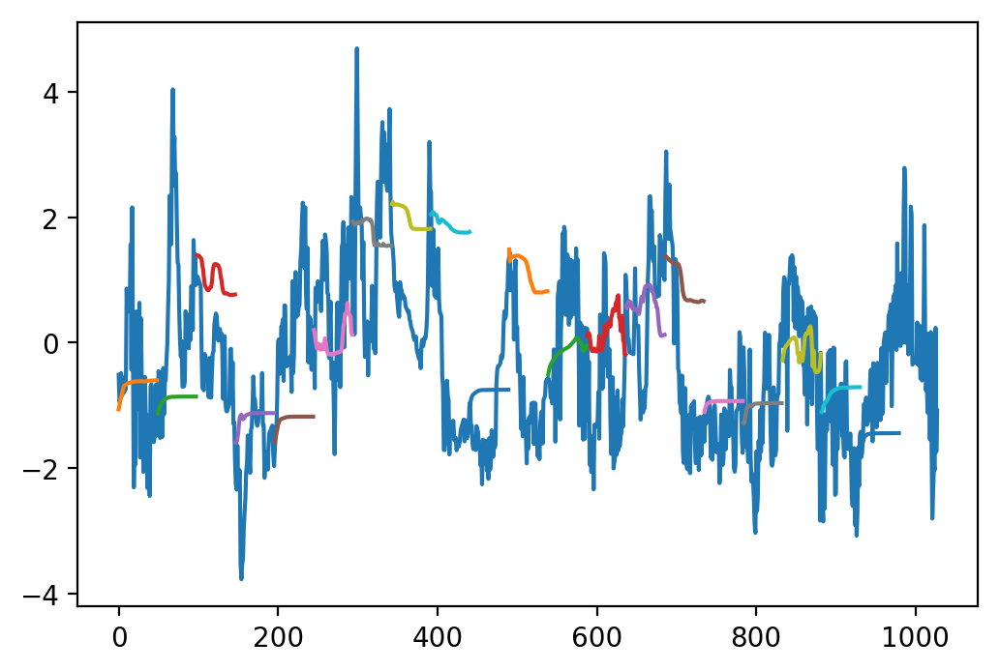

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_STRAT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 756 batches per epoch
Epoch 1/1
756/756 [==============================] - 284s 376ms/step - loss: 0.3299
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:04:43.977420


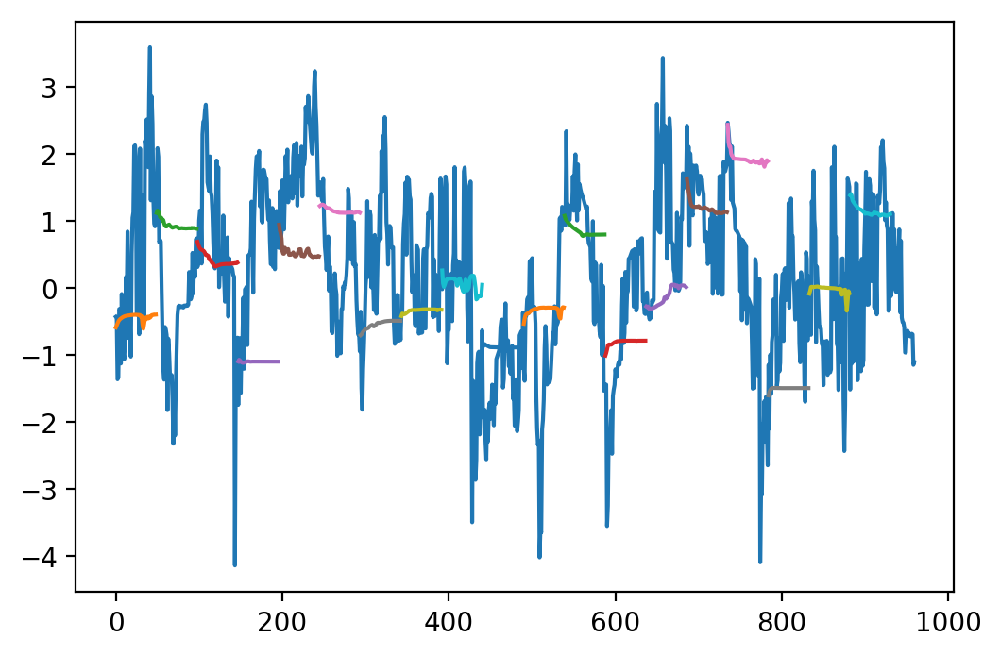

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_NXT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 330 batches per epoch
Epoch 1/1
330/330 [==============================] - 125s 378ms/step - loss: 0.3342
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:04.870381


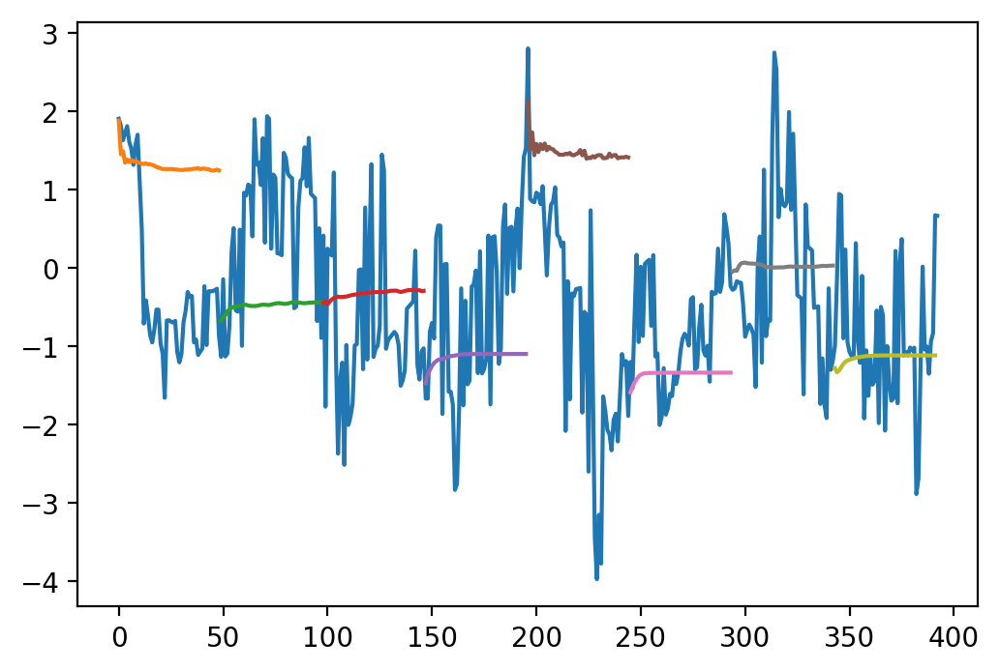

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_ZEC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 313s 377ms/step - loss: 0.3876
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:05:13.433944


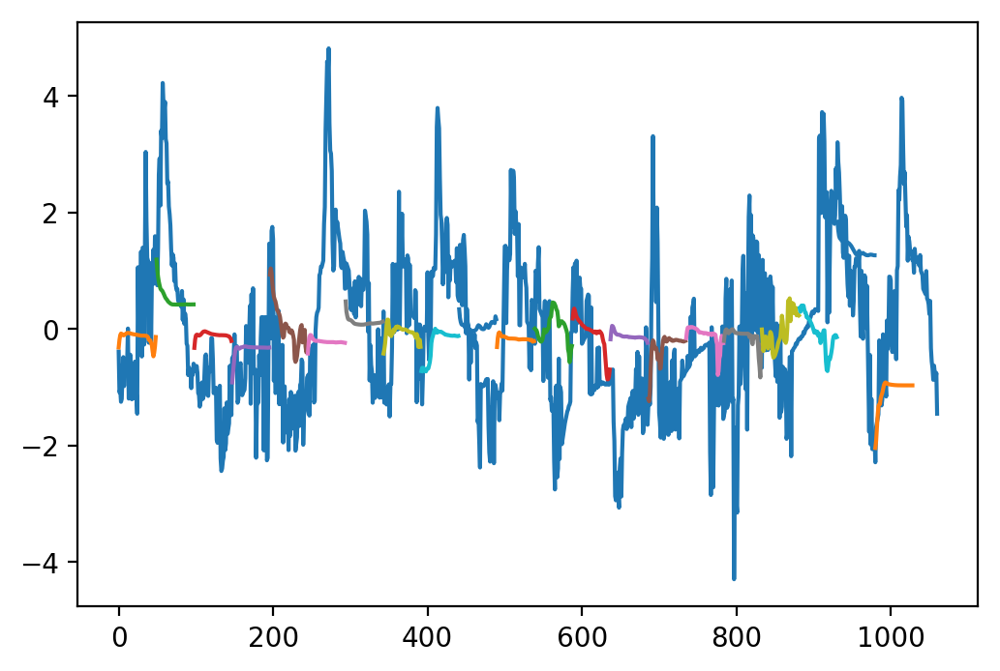

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_BAY.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 347 batches per epoch
Epoch 1/1
347/347 [==============================] - 131s 377ms/step - loss: 0.3457
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:10.845743


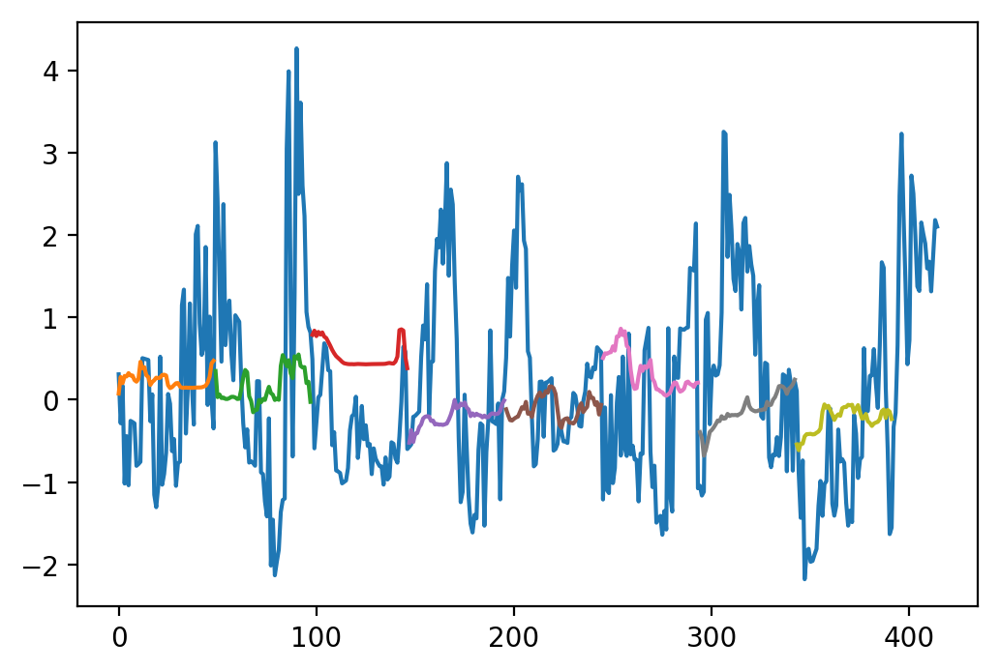

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_RCN.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 477 batches per epoch
Epoch 1/1
477/477 [==============================] - 180s 378ms/step - loss: 0.2765
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:03:00.153478


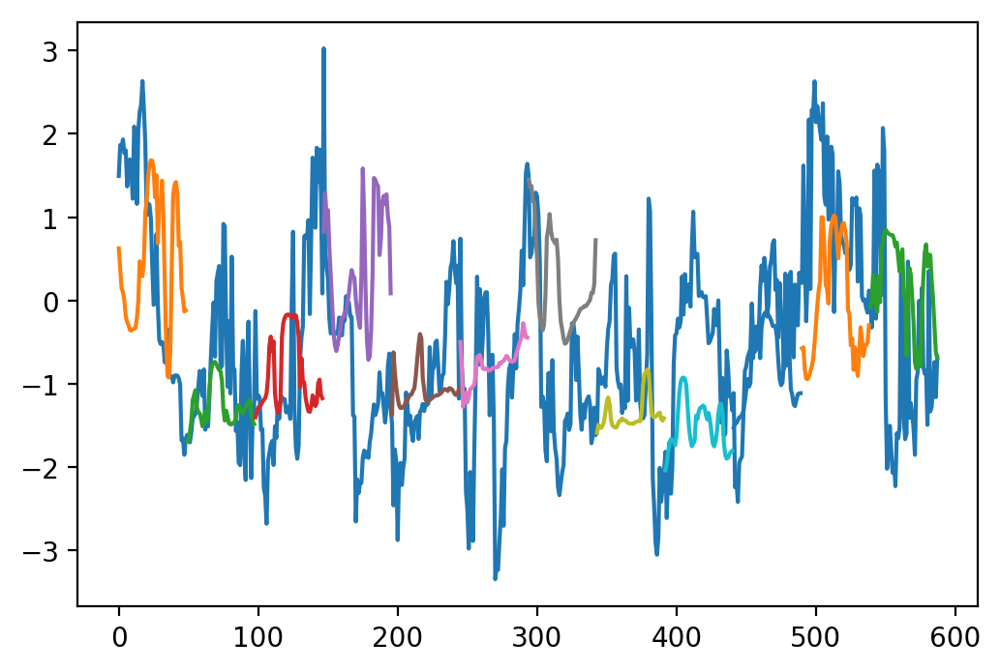

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_MCO.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 434 batches per epoch
Epoch 1/1
434/434 [==============================] - 164s 379ms/step - loss: 0.2762
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:44.347128


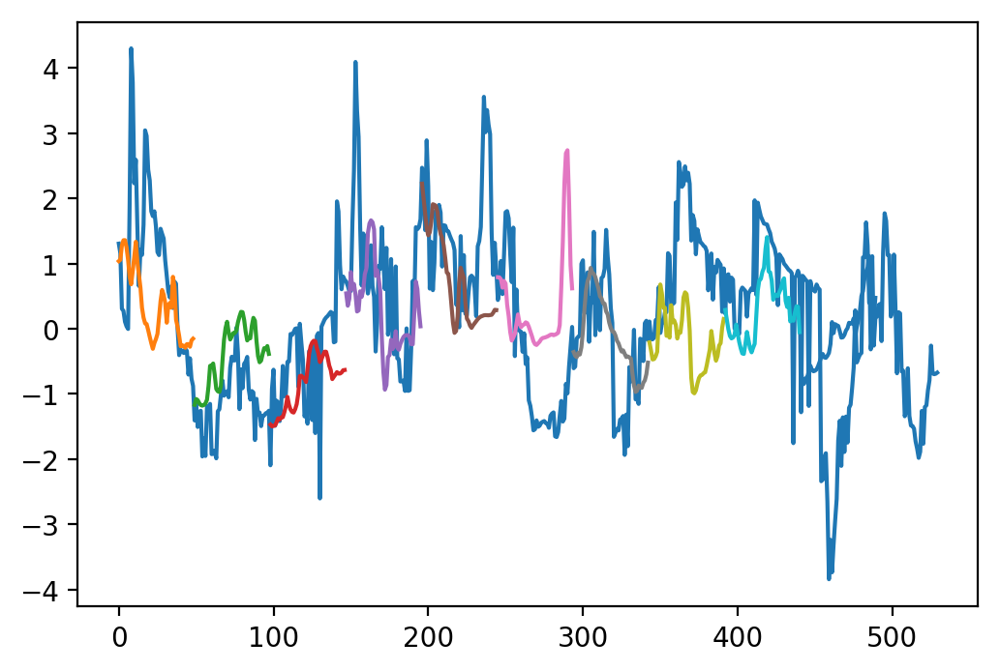

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_VTC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 322 batches per epoch
Epoch 1/1
322/322 [==============================] - 120s 374ms/step - loss: 0.2373
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:00.545639


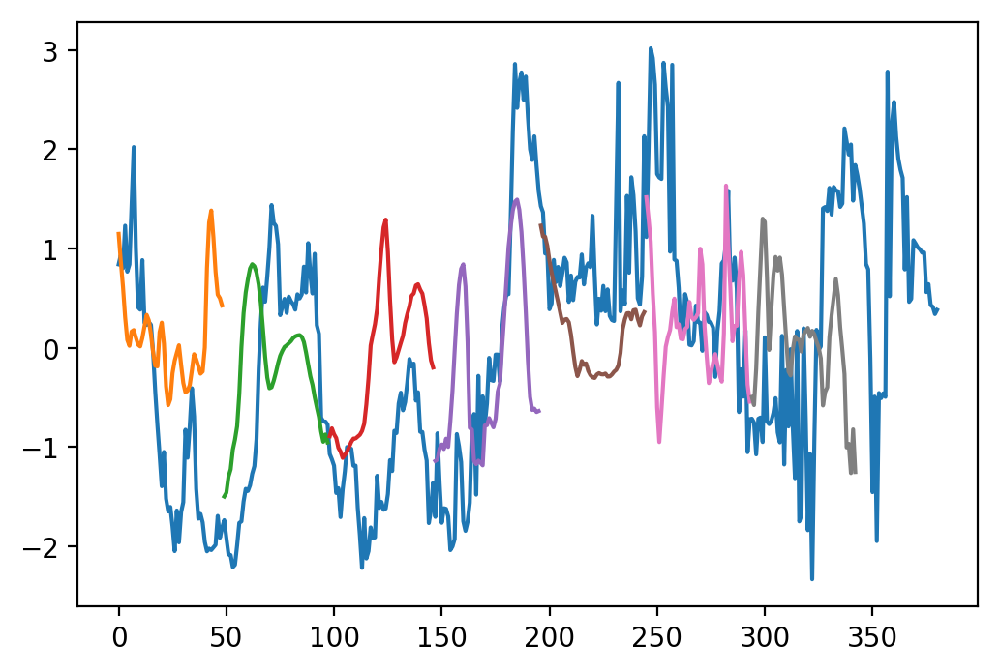

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_SYS.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 336 batches per epoch
Epoch 1/1
336/336 [==============================] - 125s 371ms/step - loss: 0.2360
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:04.639665


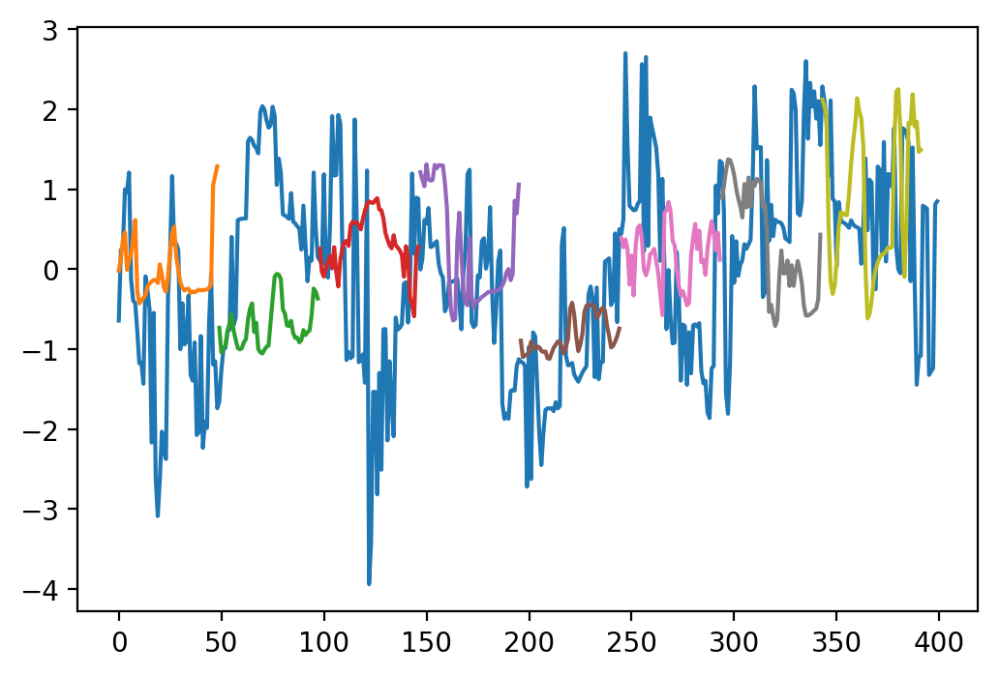

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_RISE.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 315 batches per epoch
Epoch 1/1
315/315 [==============================] - 120s 380ms/step - loss: 0.2482
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:01:59.791399


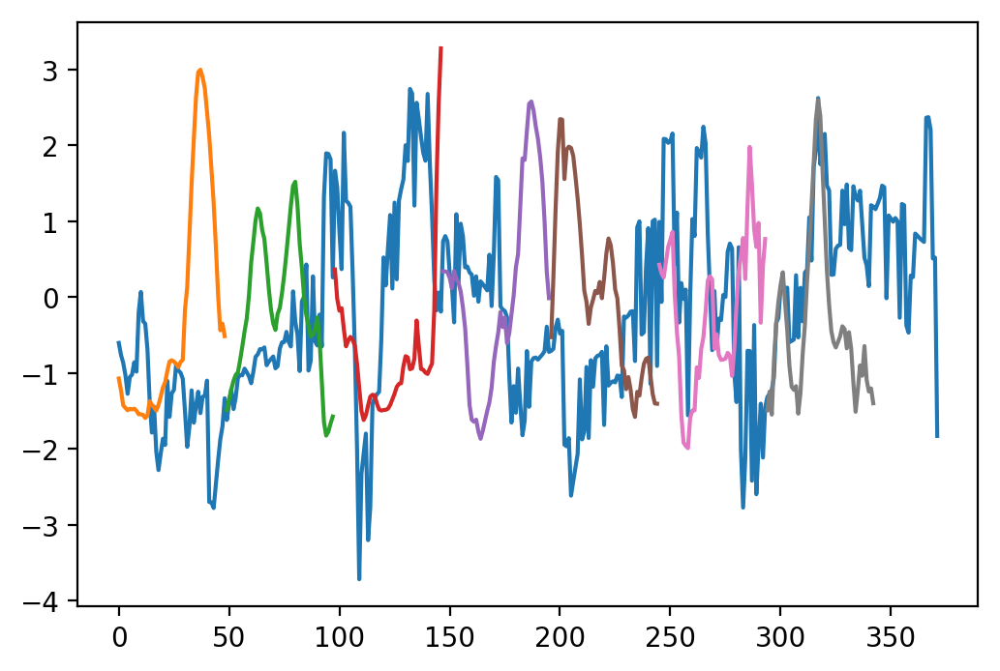

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_RDD.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 712 batches per epoch
Epoch 1/1
712/712 [==============================] - 270s 379ms/step - loss: 0.3611
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:04:29.618103


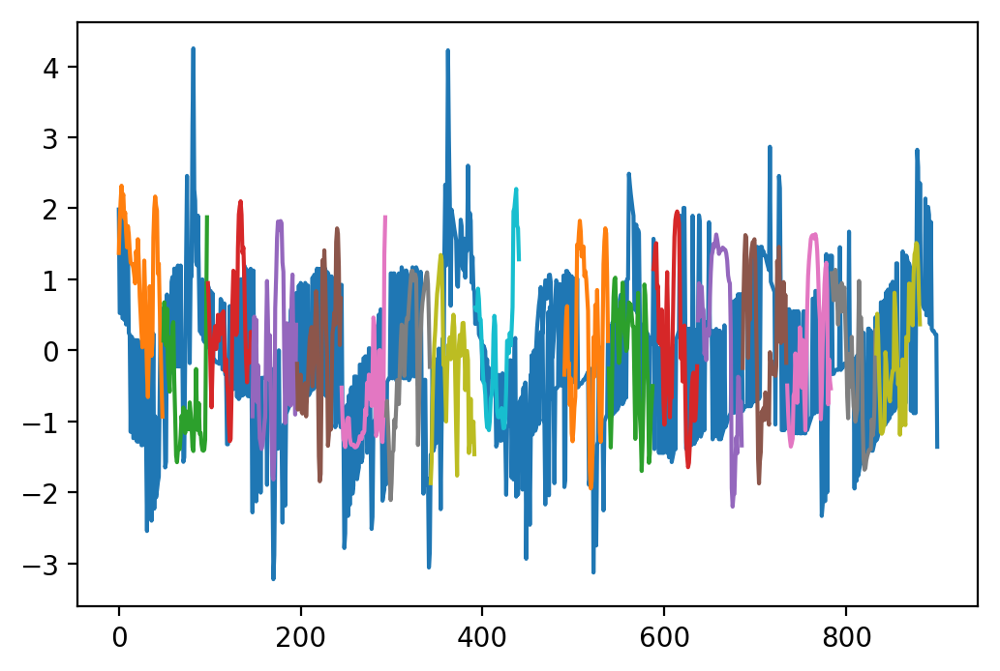

USING DATA: [..\data\IndicatorsAdded\VHighVolume\BTC_XRP.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 320s 385ms/step - loss: 0.1853
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:05:20.237695


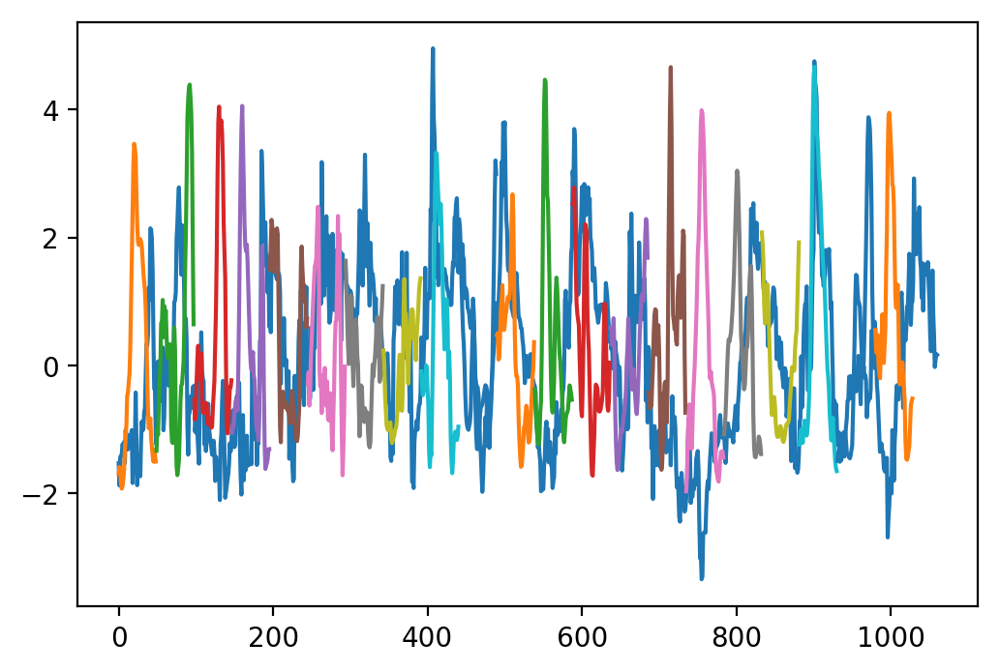

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_GNT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 319 batches per epoch
Epoch 1/1
319/319 [==============================] - 120s 376ms/step - loss: 0.1359
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:01:59.896405


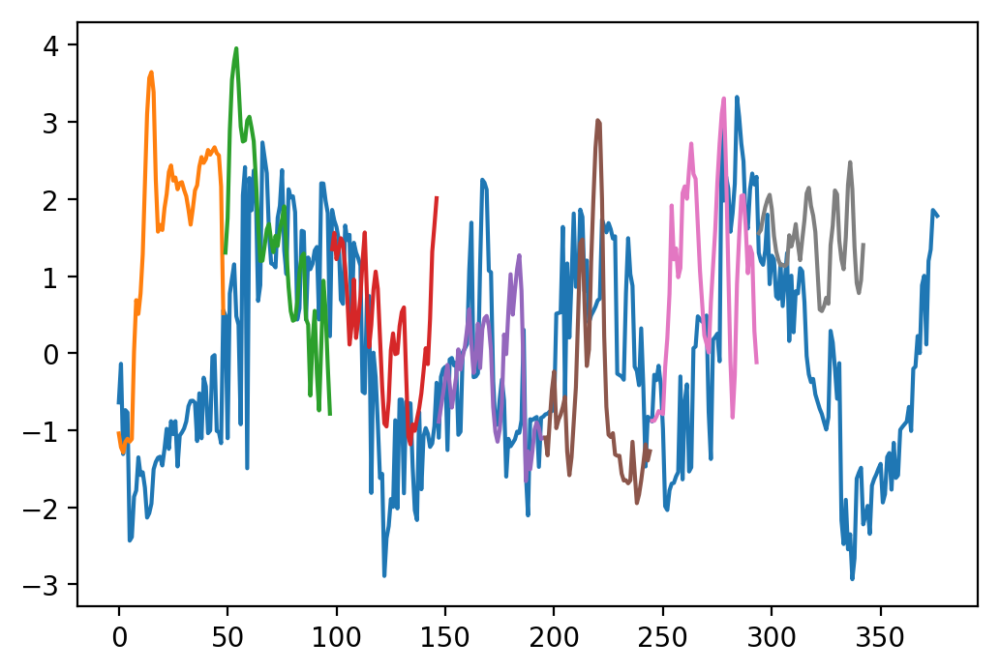

USING DATA: [..\data\IndicatorsAdded\VHighVolume\BTC_XVG.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 401 batches per epoch
Epoch 1/1
401/401 [==============================] - 151s 377ms/step - loss: 0.1952
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:31.155464


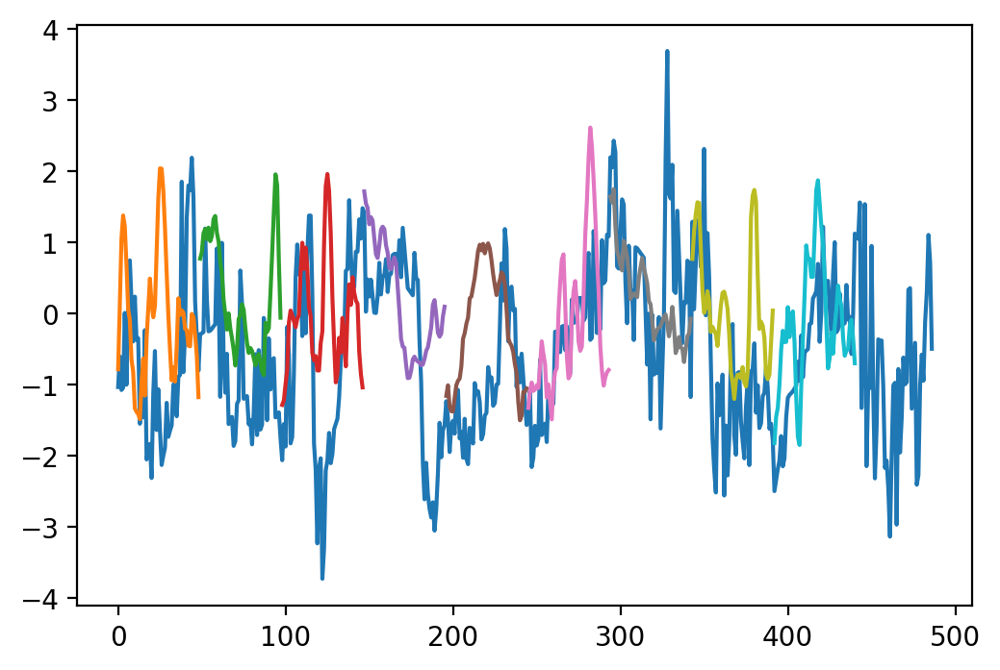

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_BTG.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 783 batches per epoch
Epoch 1/1
783/783 [==============================] - 282s 360ms/step - loss: 0.1917
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:04:42.130656


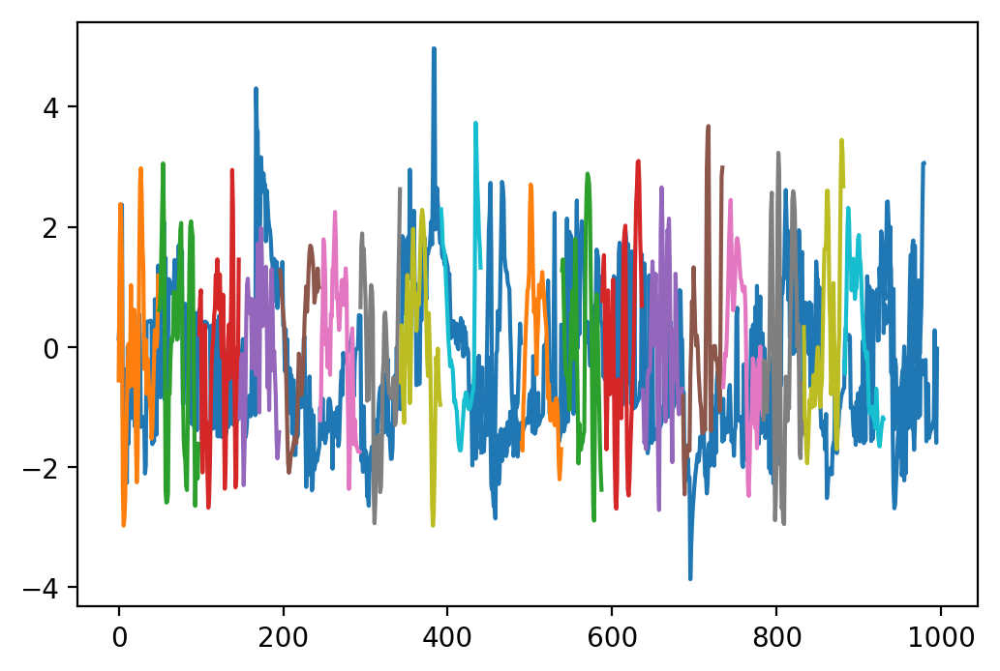

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_XMR.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 299s 359ms/step - loss: 0.1941
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:04:59.137620


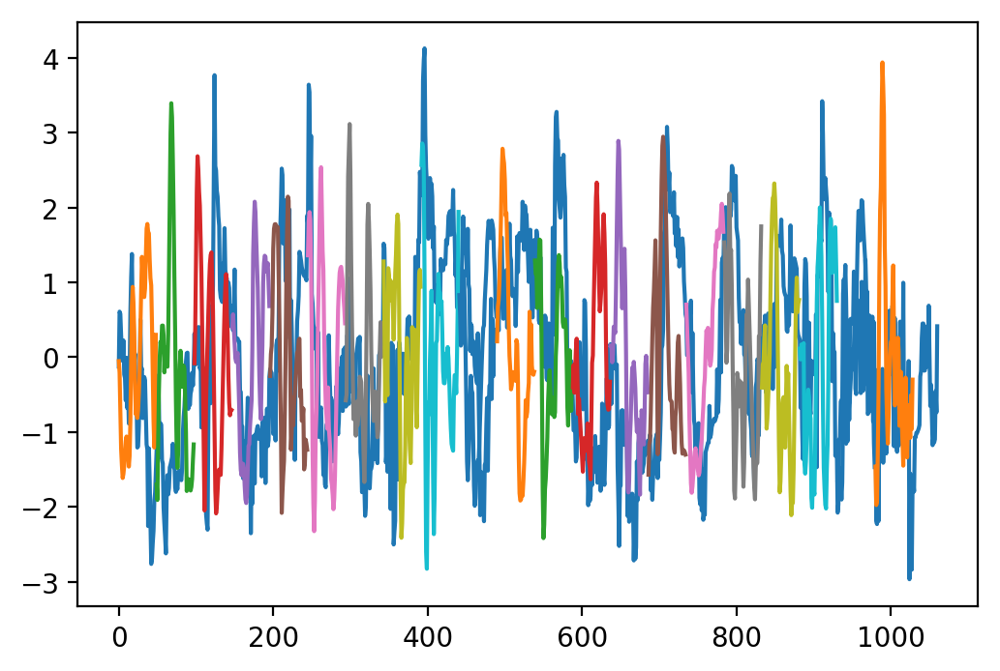

USING DATA: [..\data\IndicatorsAdded\VHighVolume\BTC_ADA.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 432 batches per epoch
Epoch 1/1
432/432 [==============================] - 155s 358ms/step - loss: 0.1673
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:34.673156


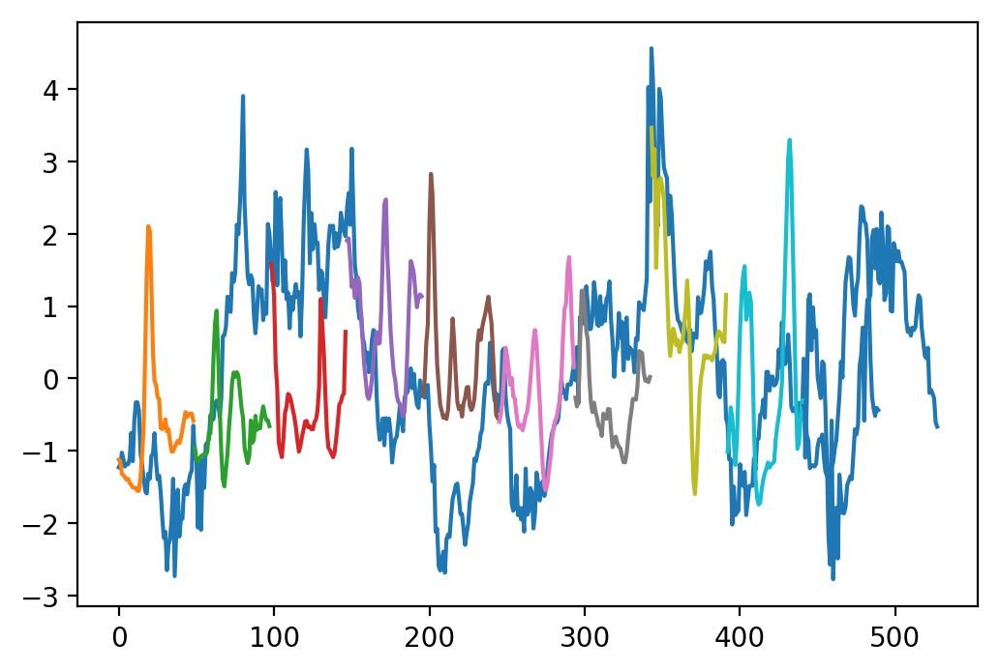

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_ETC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 299s 359ms/step - loss: 0.1379
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:04:58.599835


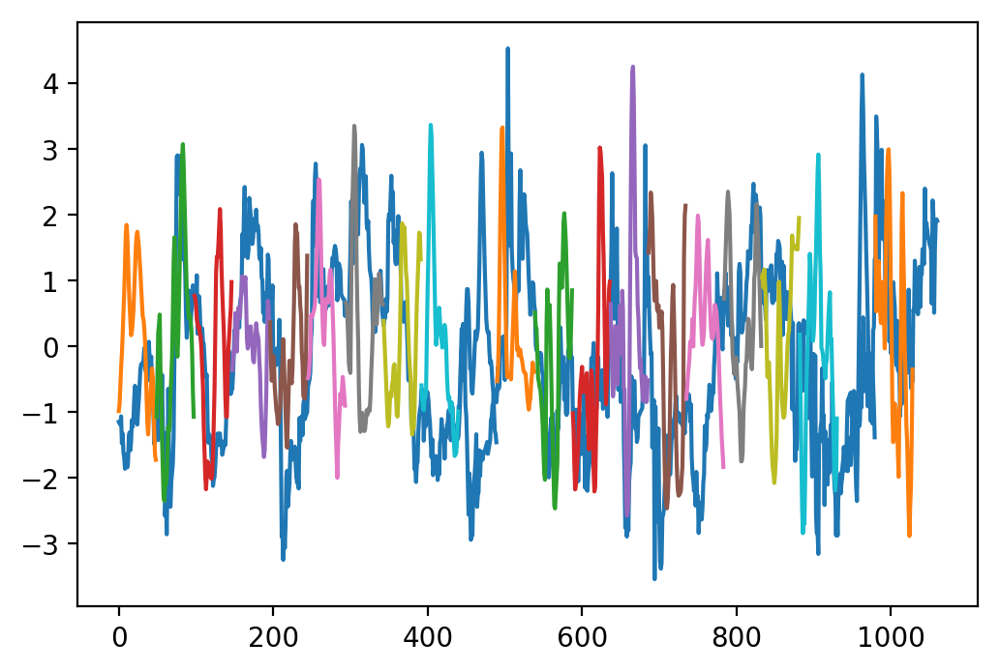

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_DASH.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 650 batches per epoch
Epoch 1/1
650/650 [==============================] - 234s 359ms/step - loss: 0.1770
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:03:53.685851


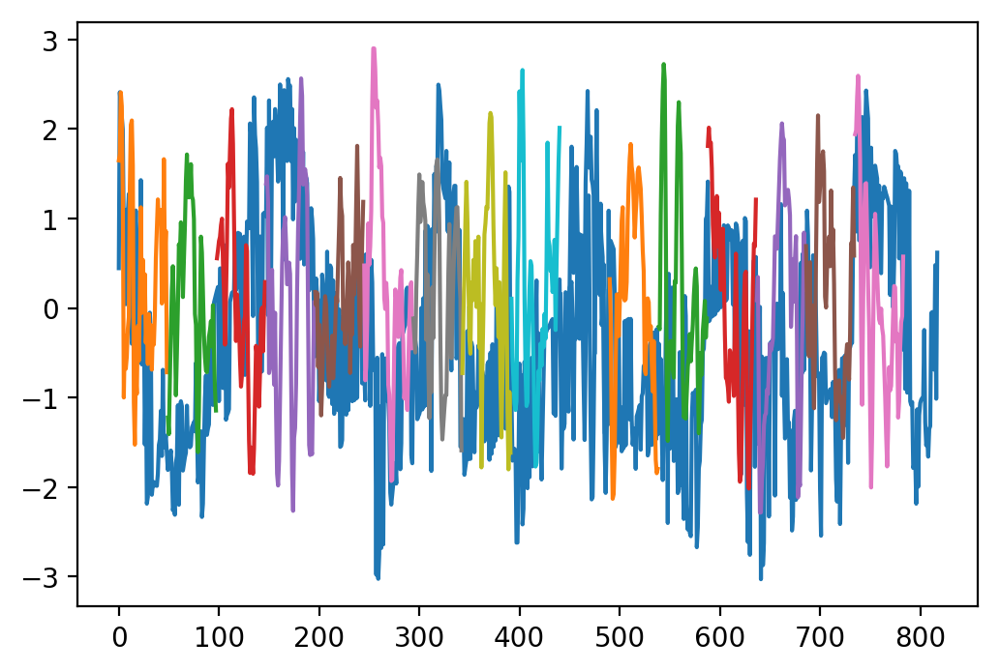

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_LTC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 299s 359ms/step - loss: 0.1494
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:04:58.952687


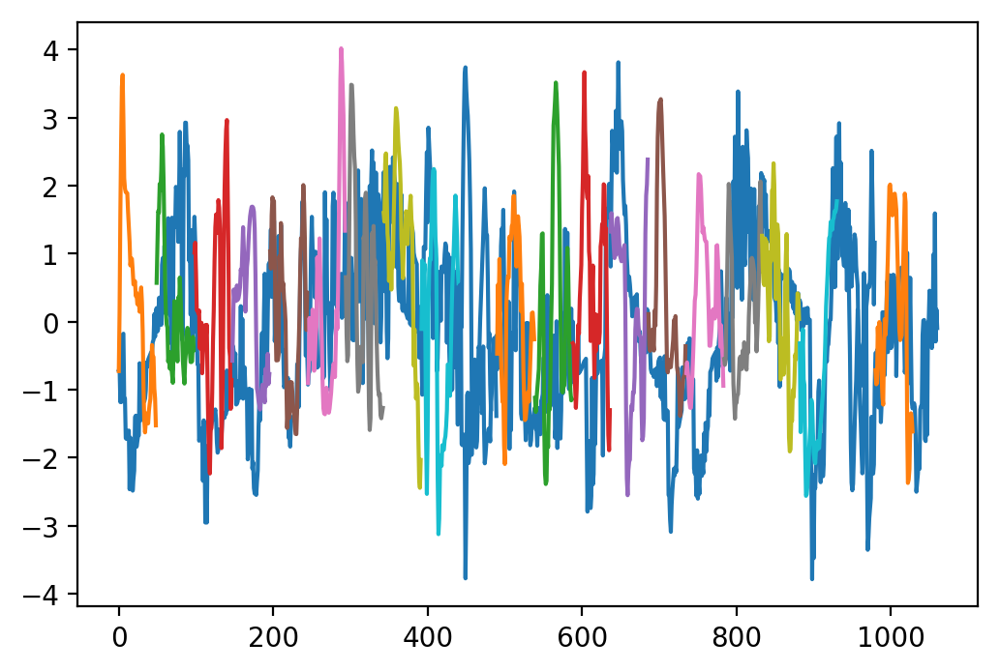

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_VOX.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 468 batches per epoch
Epoch 1/1
468/468 [==============================] - 169s 360ms/step - loss: 0.1656
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:48.571545


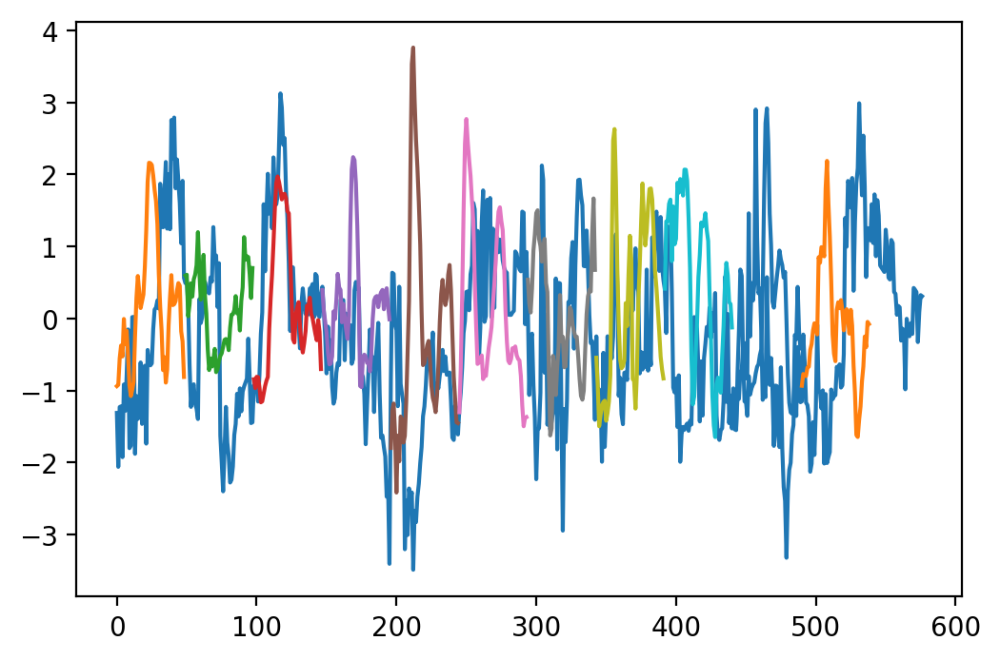

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_SC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 712 batches per epoch
Epoch 1/1
712/712 [==============================] - 256s 360ms/step - loss: 0.1653
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:04:16.124774


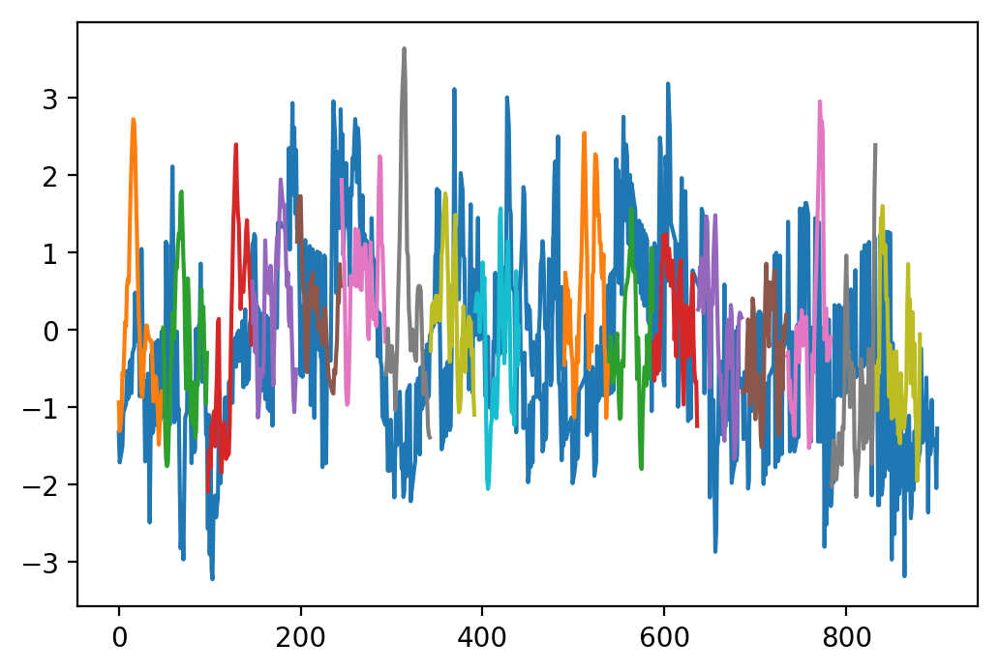

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_XEM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 636 batches per epoch
Epoch 1/1
636/636 [==============================] - 229s 359ms/step - loss: 0.1288
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:03:48.588824


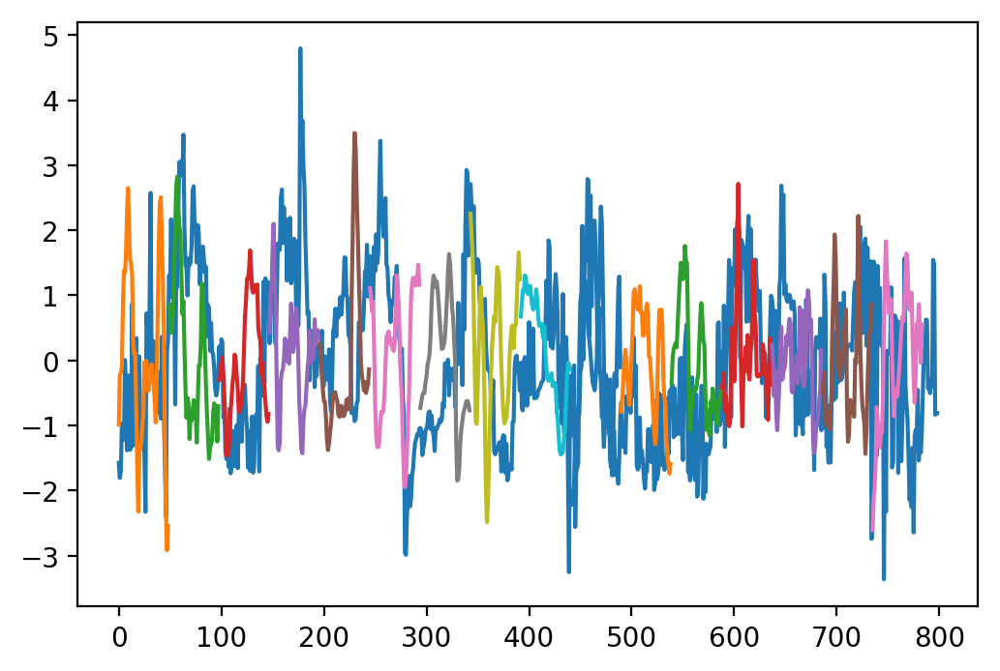

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_DOGE.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 772 batches per epoch
Epoch 1/1
772/772 [==============================] - 278s 360ms/step - loss: 0.3612
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:04:37.929124


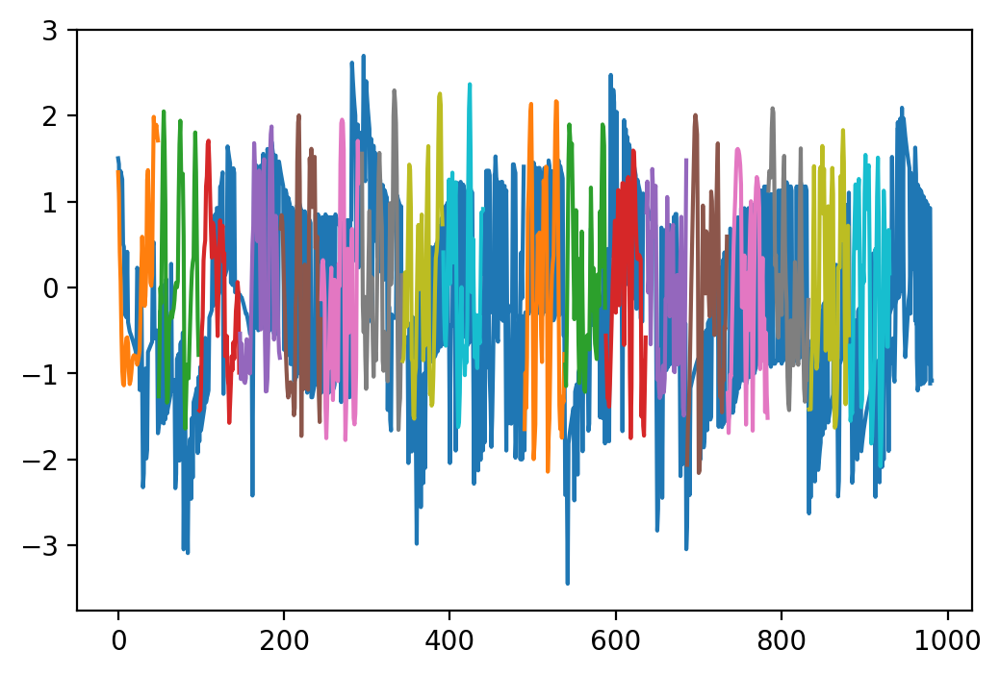

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_QTUM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 570 batches per epoch
Epoch 1/1
570/570 [==============================] - 205s 360ms/step - loss: 0.1773
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:03:24.987239


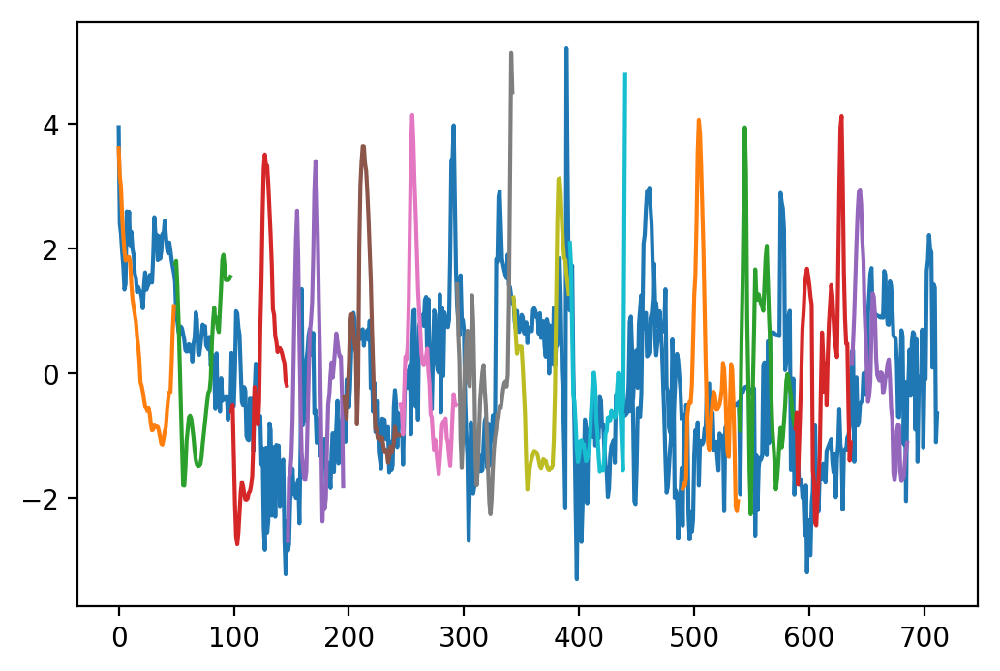

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_WAVES.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 470 batches per epoch
Epoch 1/1
470/470 [==============================] - 169s 360ms/step - loss: 0.1270
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:49.117061


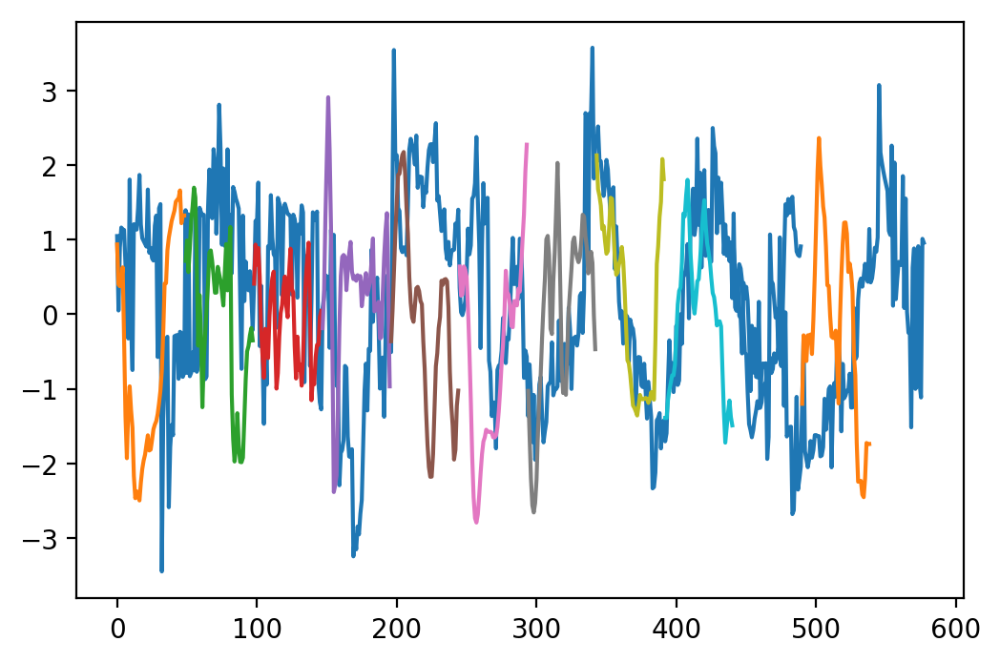

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_EMC2.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 494 batches per epoch
Epoch 1/1
494/494 [==============================] - 178s 360ms/step - loss: 0.1128
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:57.703855


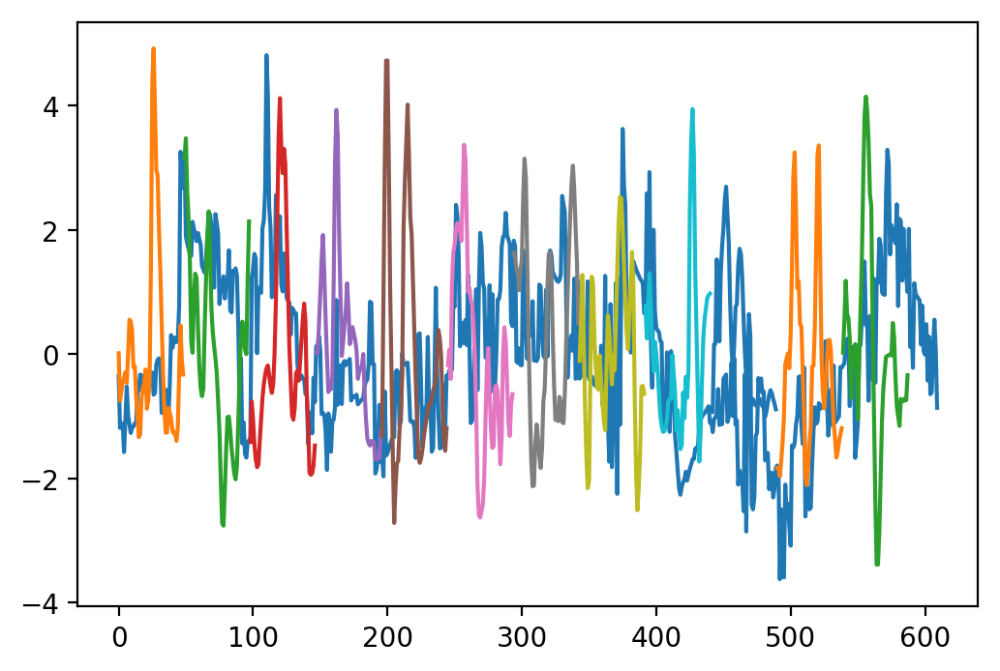

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_ZCL.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 581 batches per epoch
Epoch 1/1
581/581 [==============================] - 209s 360ms/step - loss: 0.1044
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:03:29.496659


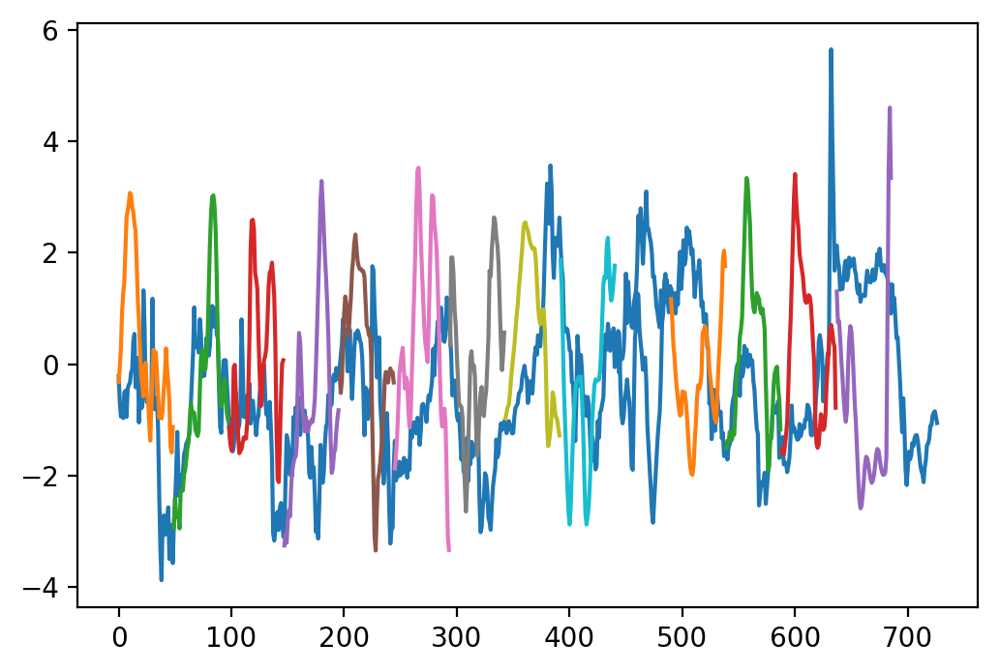

USING DATA: [..\data\IndicatorsAdded\VHighVolume\BTC_BCC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 300s 361ms/step - loss: 0.1532
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:05:00.097008


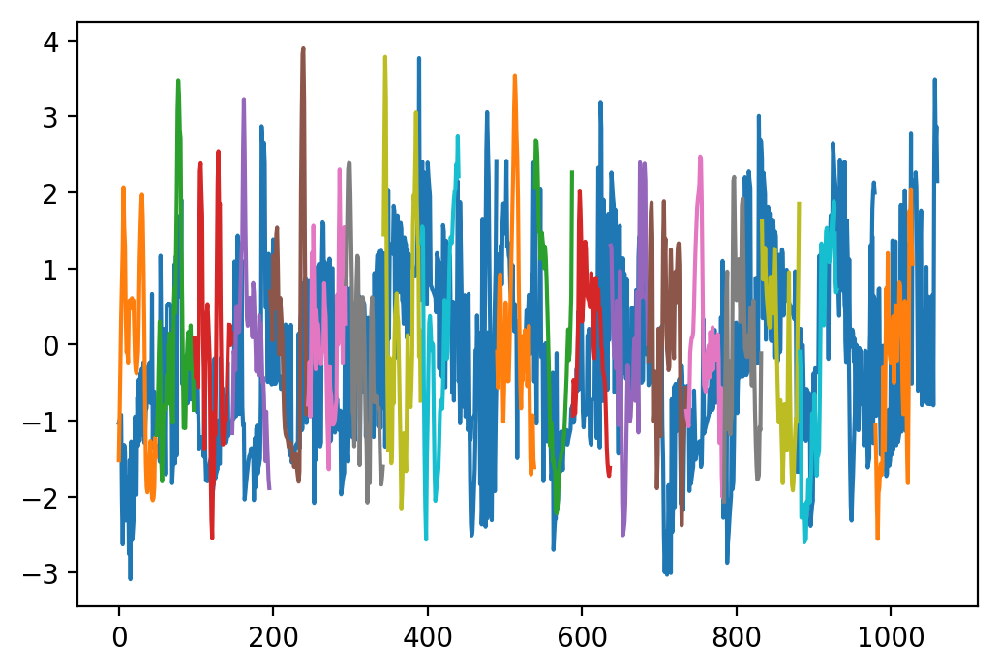

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_XDN.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 458 batches per epoch
Epoch 1/1
458/458 [==============================] - 165s 360ms/step - loss: 0.1070
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:02:45.159905


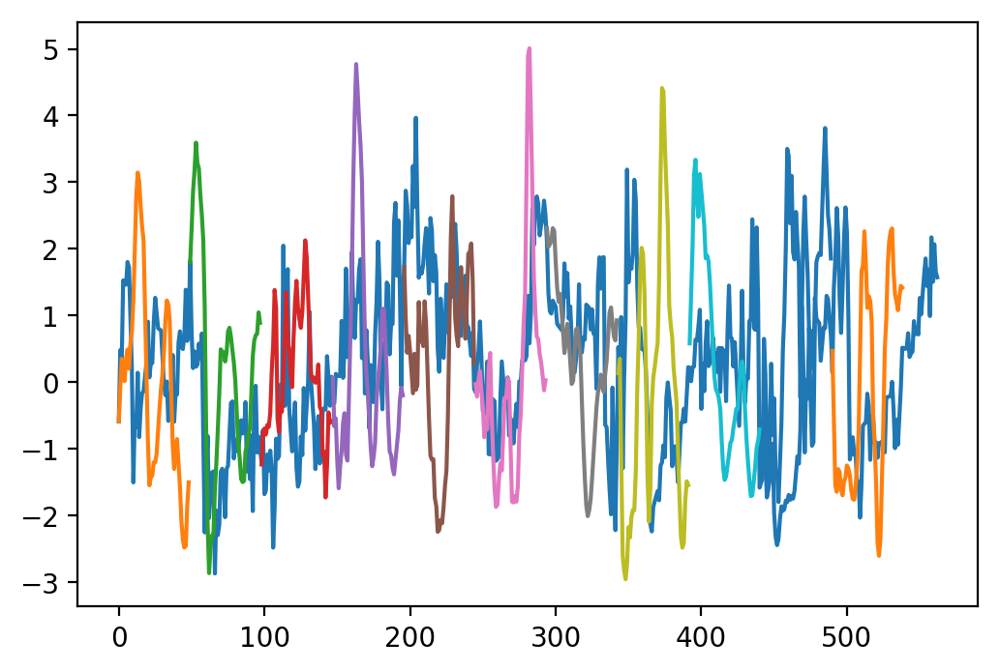

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_SNT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 537 batches per epoch
Epoch 1/1
537/537 [==============================] - 194s 361ms/step - loss: 0.1365
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:03:13.791465


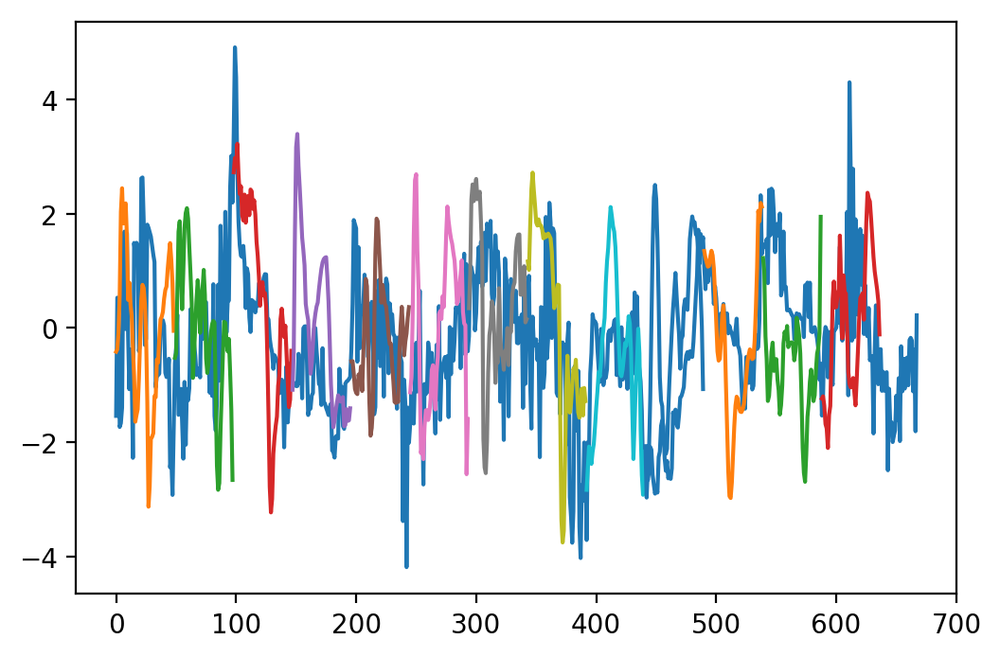

USING DATA: [..\data\IndicatorsAdded\VHighVolume\BTC_ETH.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 299s 359ms/step - loss: 0.1152
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:04:58.889454


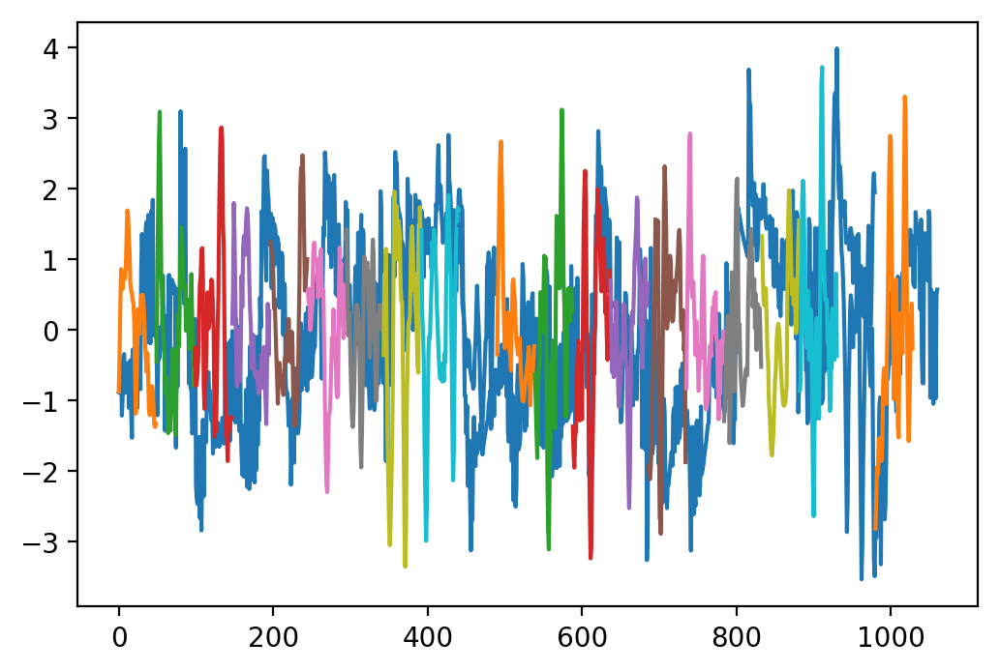

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_OMG.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 697 batches per epoch
Epoch 1/1
697/697 [==============================] - 251s 360ms/step - loss: 0.1054
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:04:11.125337


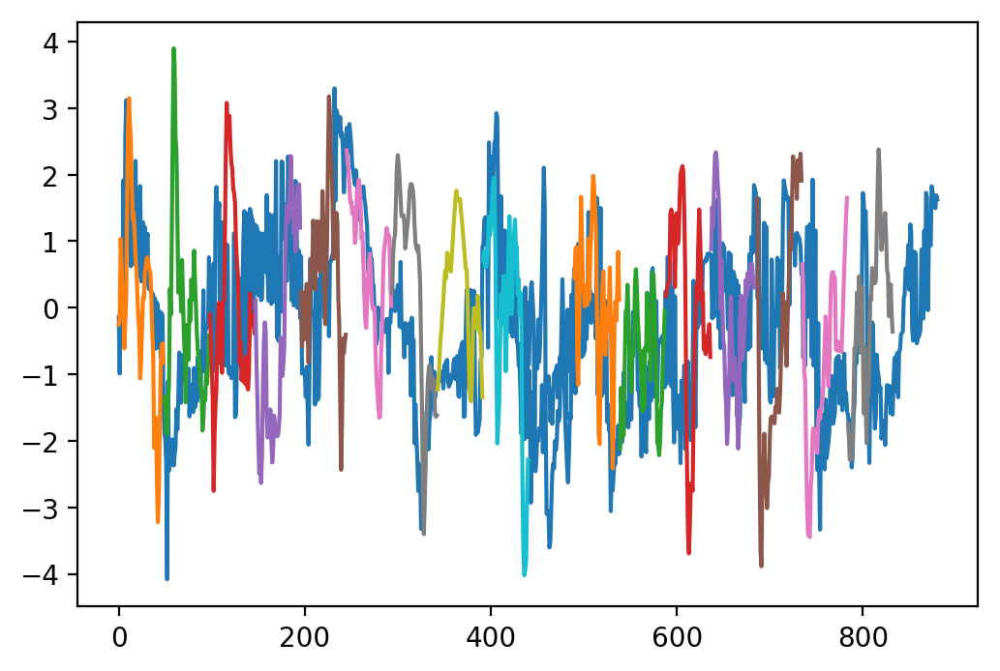

USING DATA: [..\data\IndicatorsAdded\MedVolume\BTC_MTL.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 318 batches per epoch
Epoch 1/1
318/318 [==============================] - 115s 362ms/step - loss: 0.1229
[Model] Training Completed. Model saved as saved_models\Model_StdNorm_2018_10_15.h5
Time taken: 0:01:55.173023


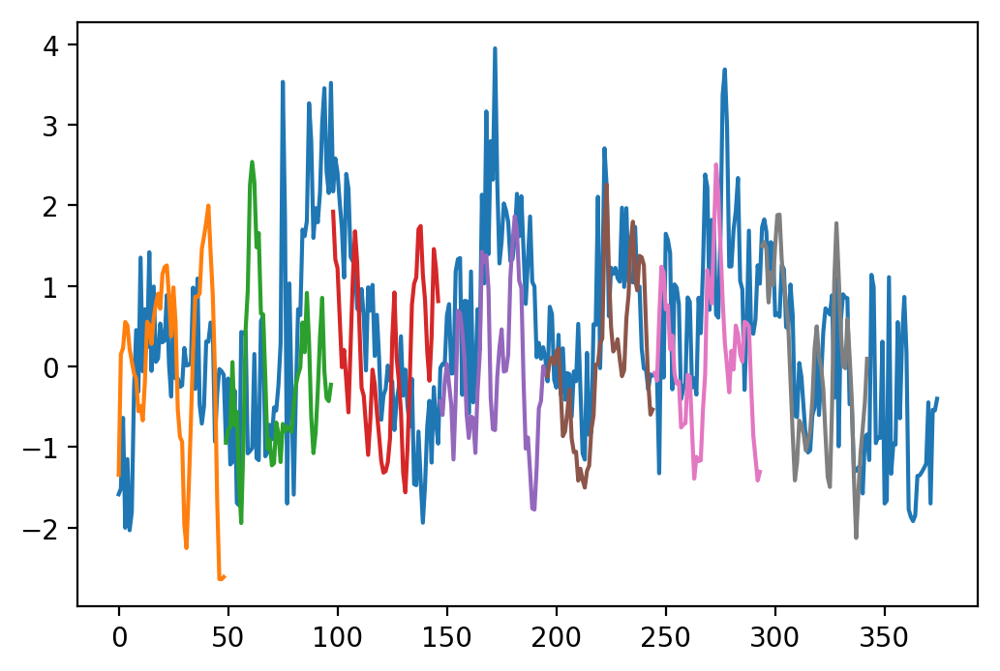

In [10]:
config['normalize'] = True
config['model_name'] = 'Model_StdNorm'
config['input_dim'] = 16
config['sequence_length'] = 50
TrainTestPlot(config, columns, 'STD')

[Model] Model Compiled
USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_LTC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 329s 396ms/step - loss: 0.3707
[Model] Training Completed. Model saved as saved_models\Model_MinMax_2018_10_15.h5
Time taken: 0:05:34.836342


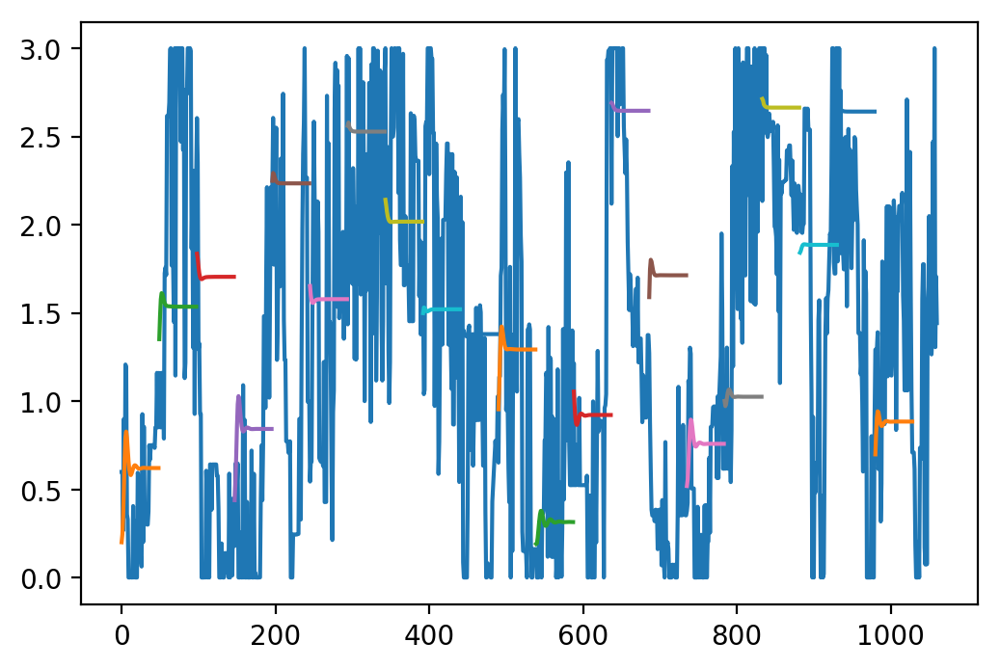

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_NEO.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 325s 391ms/step - loss: 0.2109
[Model] Training Completed. Model saved as saved_models\Model_MinMax_2018_10_15.h5
Time taken: 0:05:25.055637


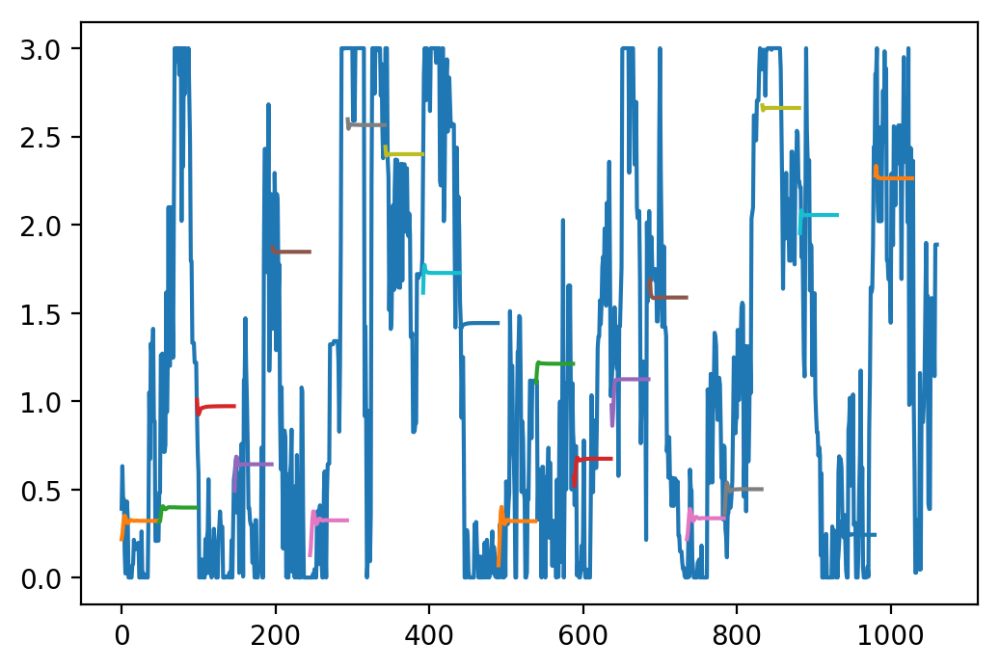

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_NXT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 330 batches per epoch
Epoch 1/1
330/330 [==============================] - 127s 385ms/step - loss: 0.1919
[Model] Training Completed. Model saved as saved_models\Model_MinMax_2018_10_15.h5
Time taken: 0:02:07.242024


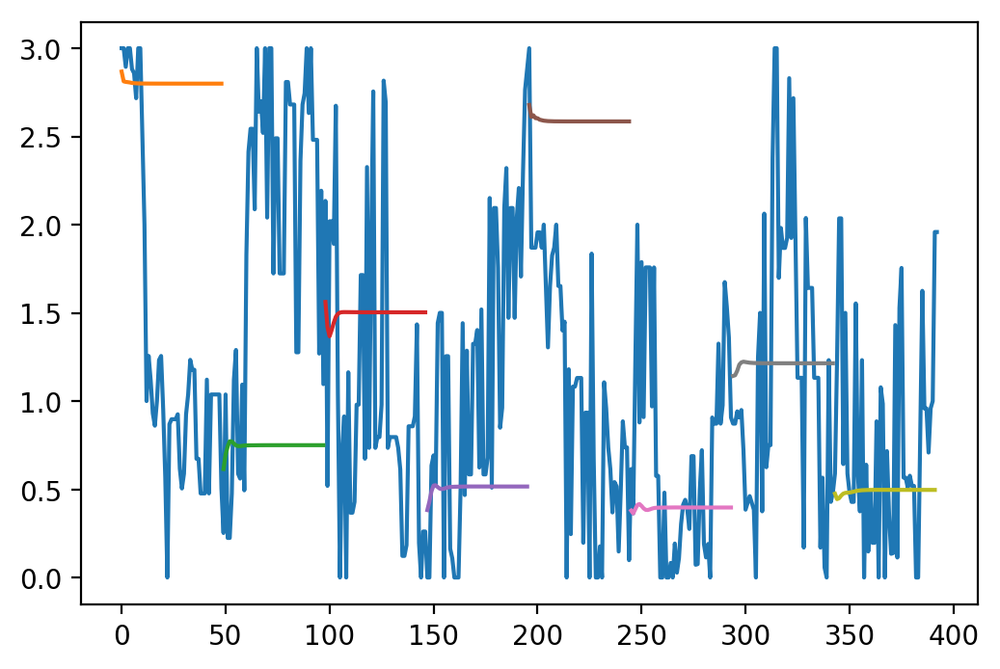

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_SC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 712 batches per epoch
Epoch 1/1
712/712 [==============================] - 275s 386ms/step - loss: 0.2193
[Model] Training Completed. Model saved as saved_models\Model_MinMax_2018_10_15.h5
Time taken: 0:04:34.788557


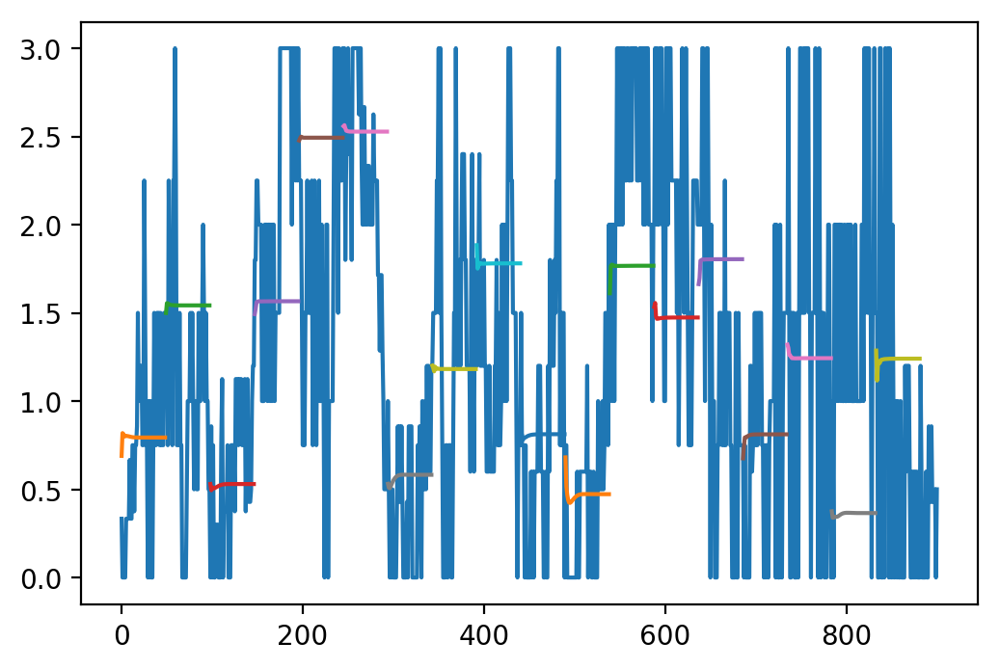

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_XLM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 320s 384ms/step - loss: 0.1736
[Model] Training Completed. Model saved as saved_models\Model_MinMax_2018_10_15.h5
Time taken: 0:05:19.945597


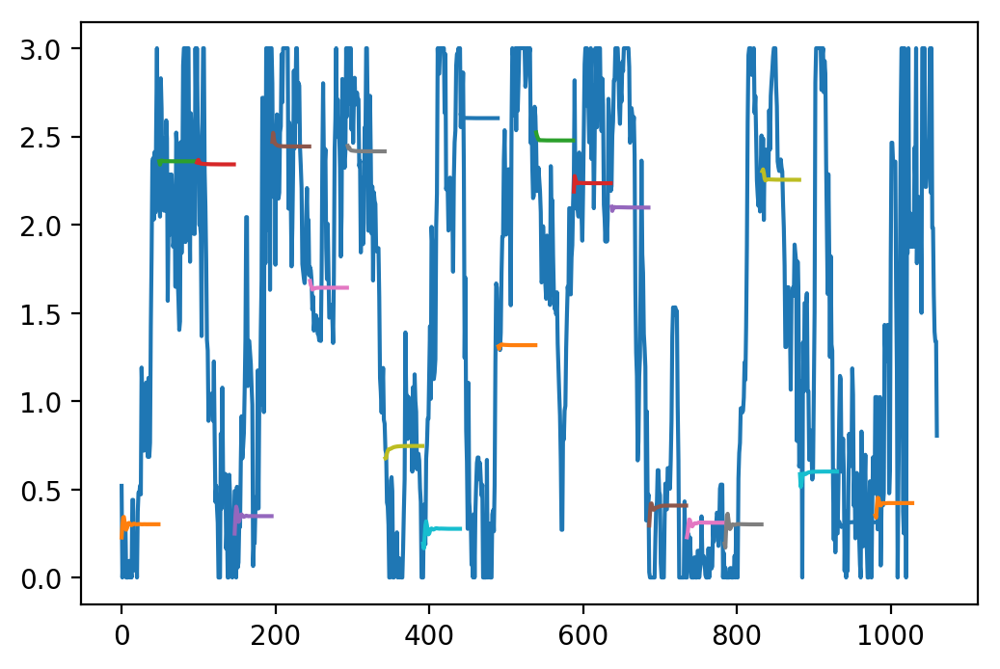

In [15]:
config['normalize'] = True
config['model_name'] = 'Model_MinMax1'
config['input_dim'] = 16
config['sequence_length'] = 50
TrainTestPlot(config, columns, 'MINMAX1')

In [ ]:
config['normalize'] = True
config['model_name'] = 'Model_MinMax3'
config['input_dim'] = 16
config['sequence_length'] = 50
TrainTestPlot(config, columns, 'MINMAX3')

[Model] Model Compiled
USING DATA(1/40): [..\data\IndicatorsAdded\MedVolume\BTC_ETC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 305s 366ms/step - loss: 0.7228
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_15.h5
Time taken: 0:05:09.298234


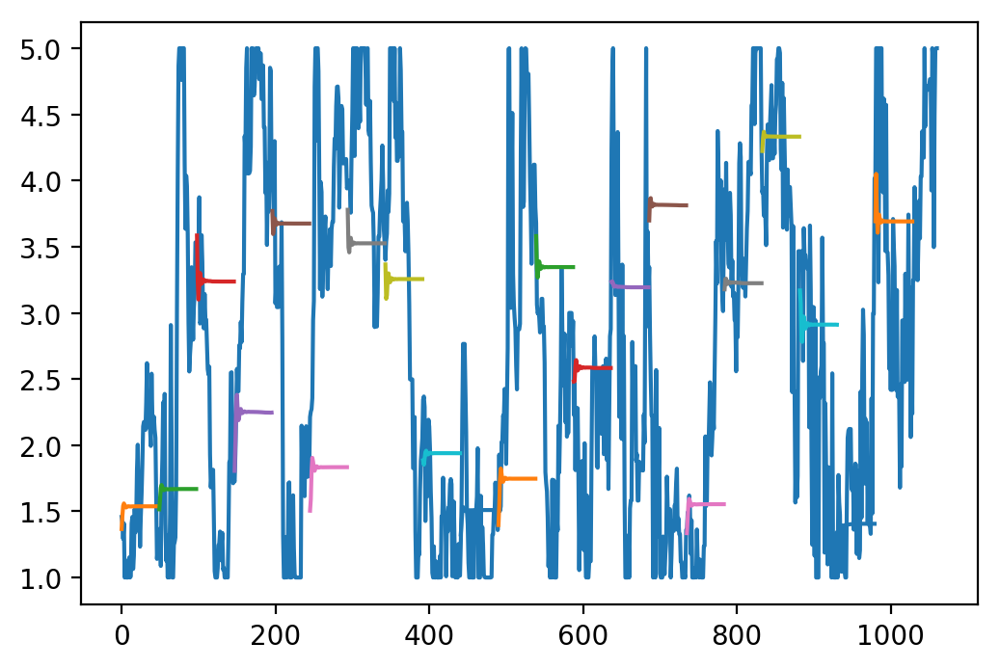

USING DATA(2/40): [..\data\IndicatorsAdded\MedVolume\BTC_XMR.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 298s 359ms/step - loss: 0.5393
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_15.h5
Time taken: 0:04:58.521143


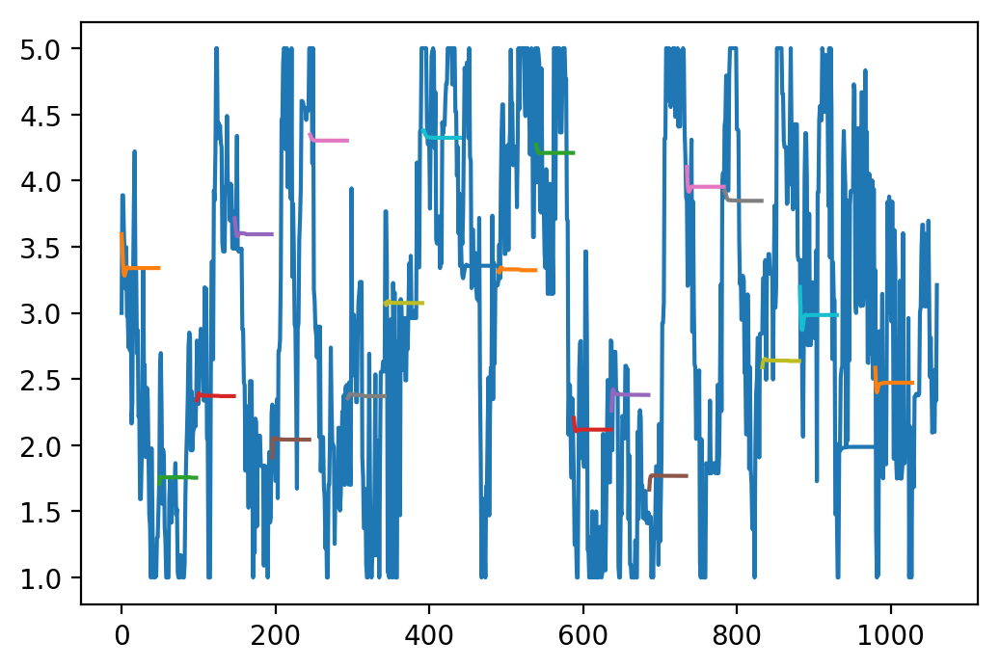

USING DATA(3/40): [..\data\IndicatorsAdded\MedVolume\BTC_XDN.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 458 batches per epoch
Epoch 1/1
458/458 [==============================] - 165s 360ms/step - loss: 0.4191
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_15.h5
Time taken: 0:02:44.739300


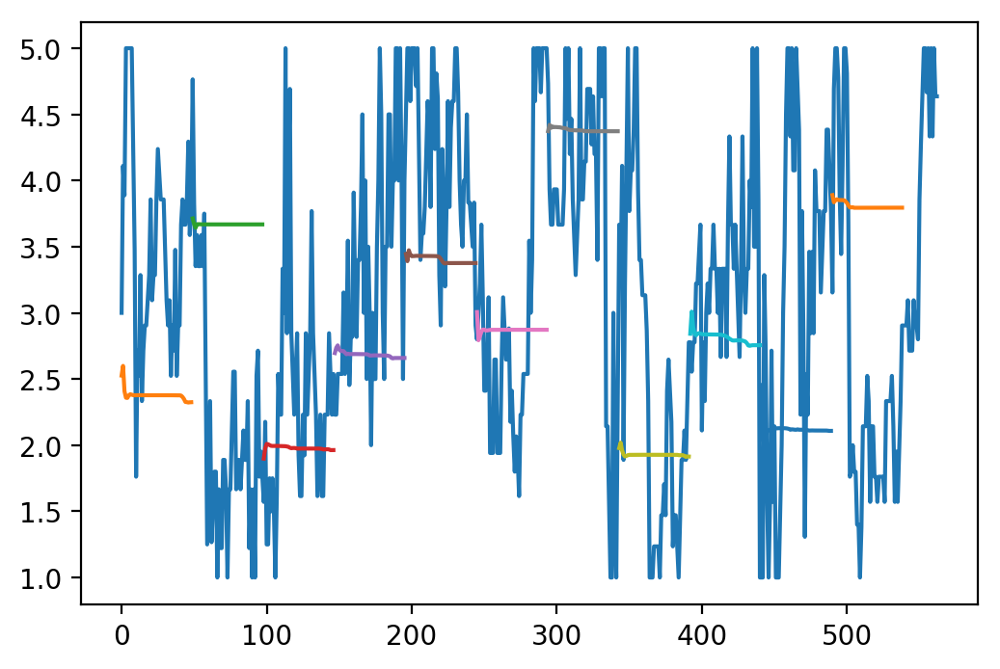

USING DATA(4/40): [..\data\IndicatorsAdded\HighVolume\BTC_LTC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 298s 359ms/step - loss: 0.4663
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_15.h5
Time taken: 0:04:58.473693


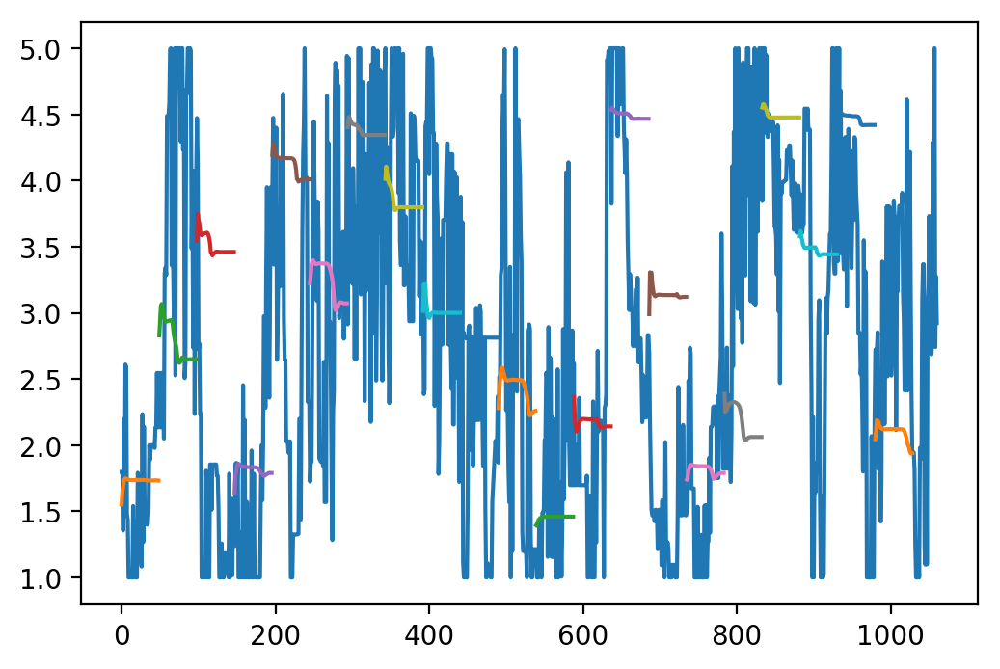

USING DATA(5/40): [..\data\IndicatorsAdded\MedVolume\BTC_DOGE.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 772 batches per epoch
Epoch 1/1
772/772 [==============================] - 279s 361ms/step - loss: 1.4956
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_15.h5
Time taken: 0:04:38.605225


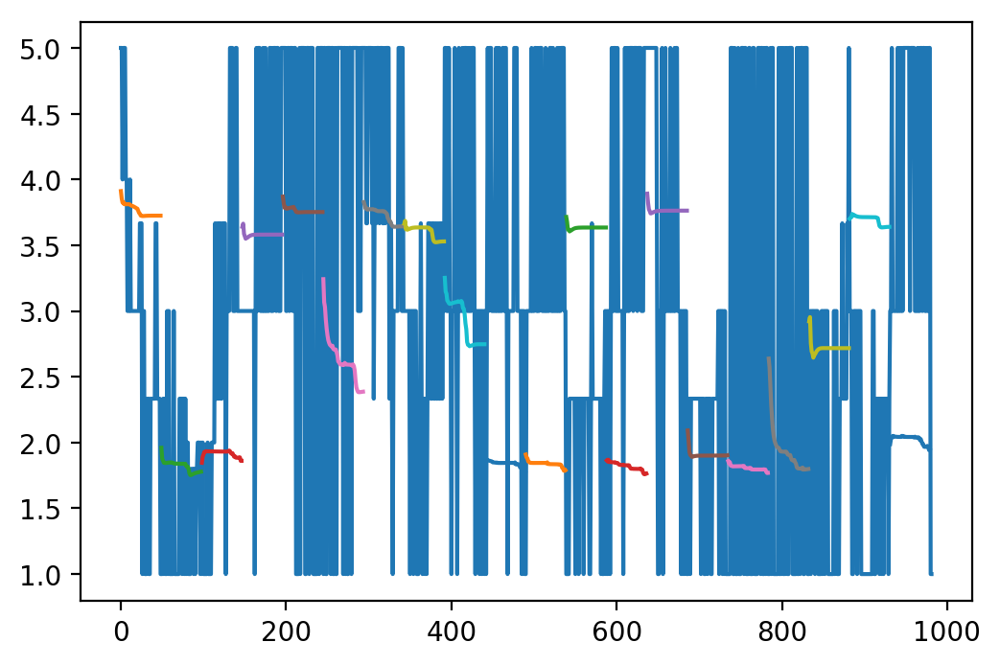

USING DATA(6/40): [..\data\IndicatorsAdded\MedVolume\BTC_GNT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 319 batches per epoch
Epoch 1/1
319/319 [==============================] - 114s 359ms/step - loss: 0.3189
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_15.h5
Time taken: 0:01:54.526023


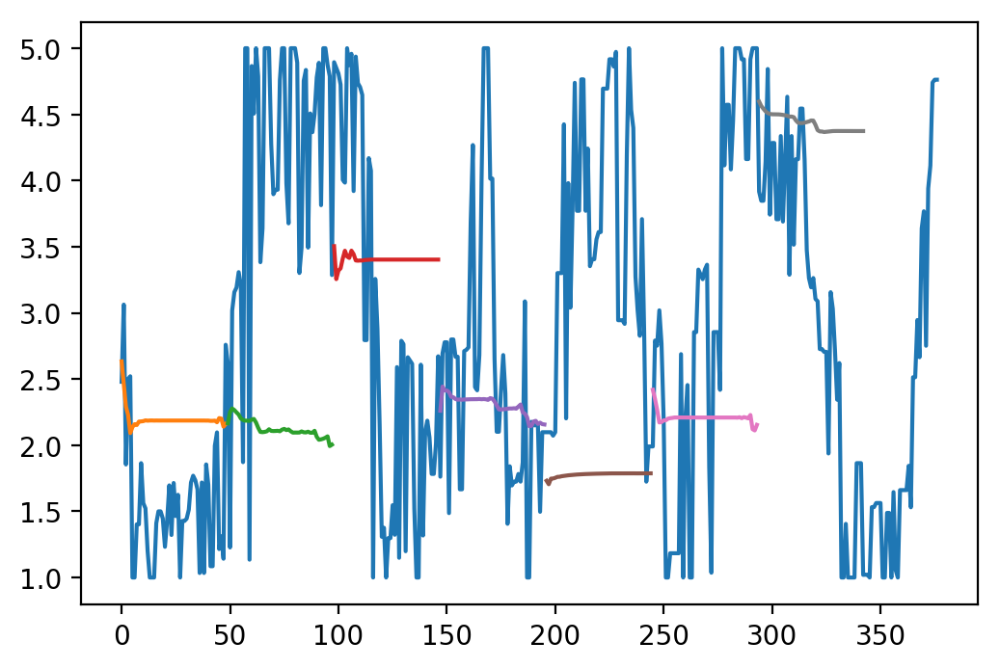

USING DATA(7/40): [..\data\IndicatorsAdded\MedVolume\BTC_VOX.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 468 batches per epoch
Epoch 1/1
468/468 [==============================] - 168s 359ms/step - loss: 0.3676
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:02:48.169540


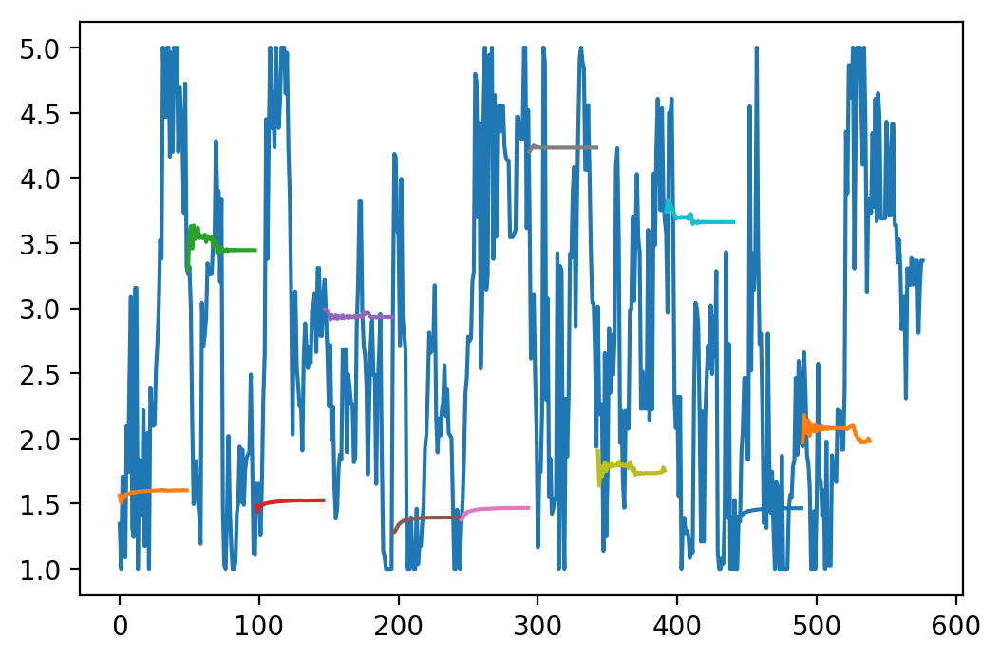

USING DATA(8/40): [..\data\IndicatorsAdded\MedVolume\BTC_RDD.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 712 batches per epoch
Epoch 1/1
712/712 [==============================] - 255s 359ms/step - loss: 0.7680
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:04:15.482292


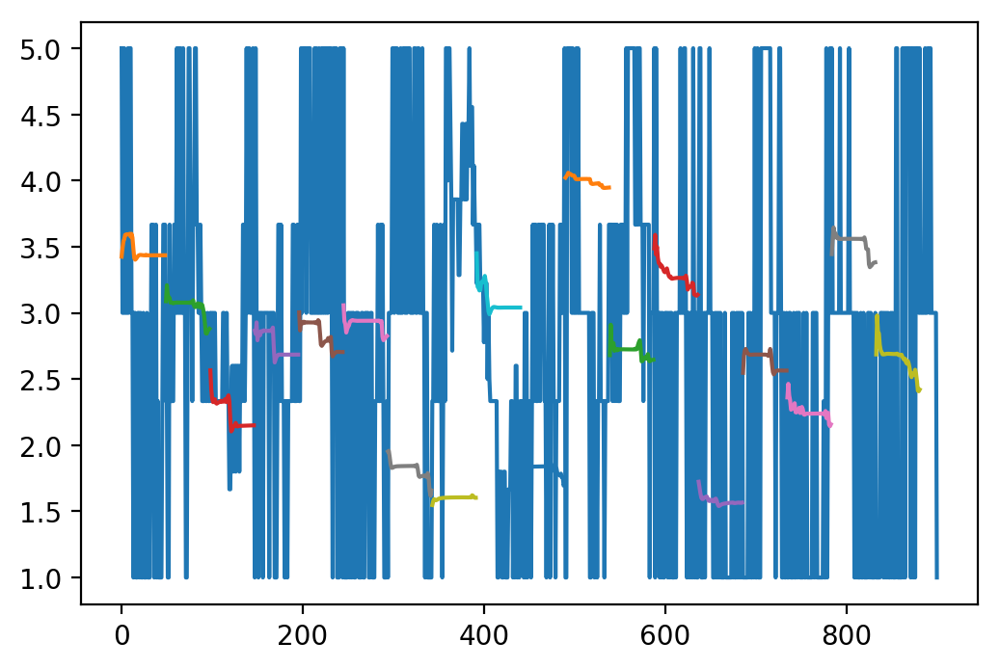

USING DATA(9/40): [..\data\IndicatorsAdded\HighVolume\BTC_NXT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 330 batches per epoch
Epoch 1/1
330/330 [==============================] - 118s 357ms/step - loss: 0.3468
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:01:58.018142


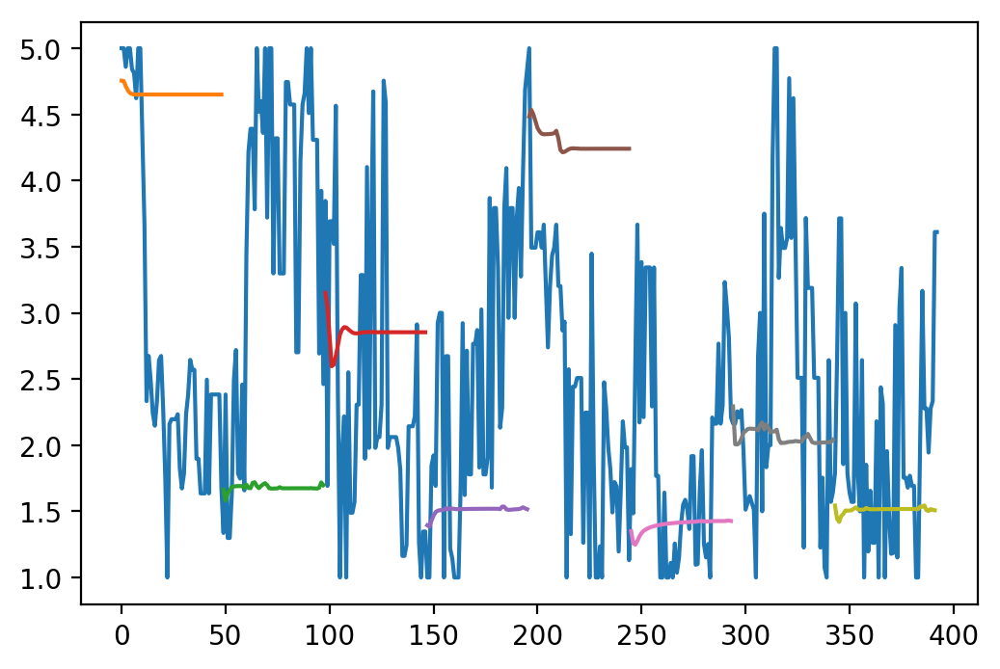

USING DATA(10/40): [..\data\IndicatorsAdded\MedVolume\BTC_RCN.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 477 batches per epoch
Epoch 1/1
477/477 [==============================] - 171s 358ms/step - loss: 0.3132
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:02:50.924762


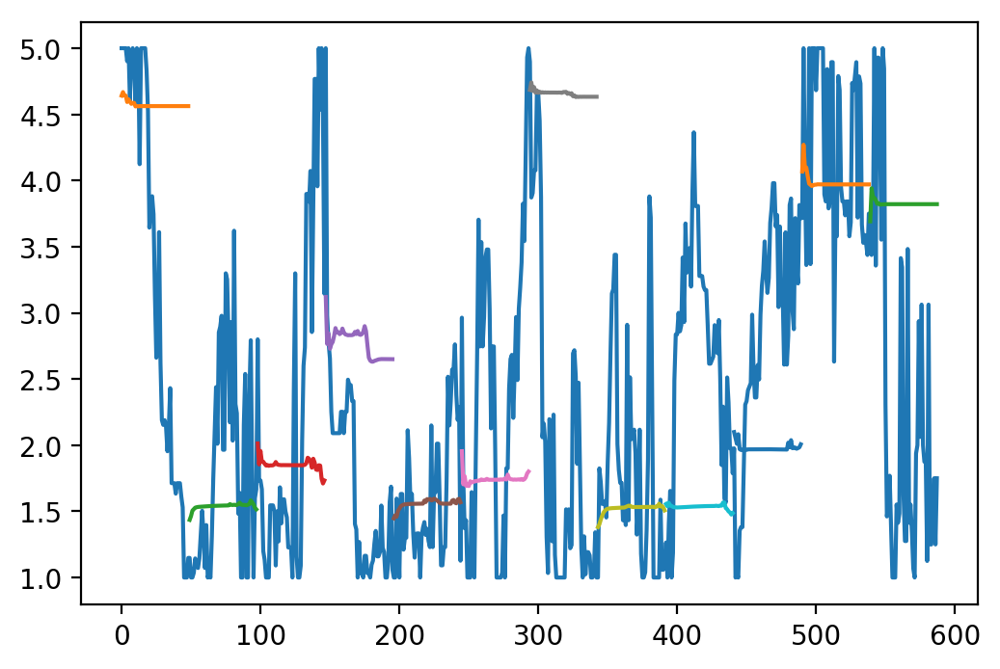

USING DATA(11/40): [..\data\IndicatorsAdded\MedVolume\BTC_RISE.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 315 batches per epoch
Epoch 1/1
315/315 [==============================] - 113s 359ms/step - loss: 0.3573
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:01:53.060826


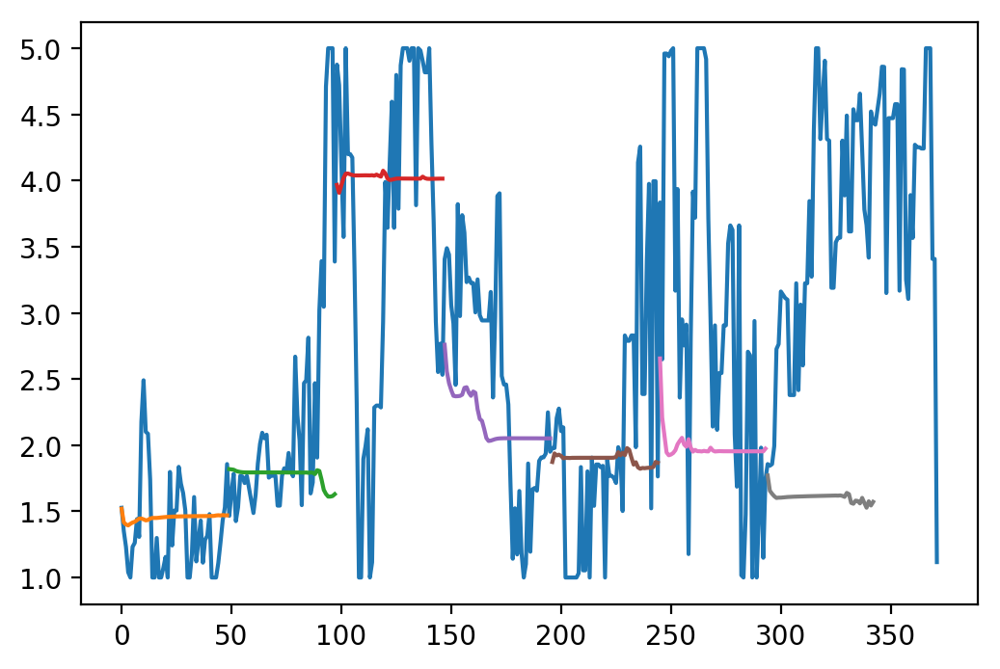

USING DATA(12/40): [..\data\IndicatorsAdded\MedVolume\BTC_LSK.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 807 batches per epoch
Epoch 1/1
807/807 [==============================] - 290s 359ms/step - loss: 0.3755
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:04:49.822847


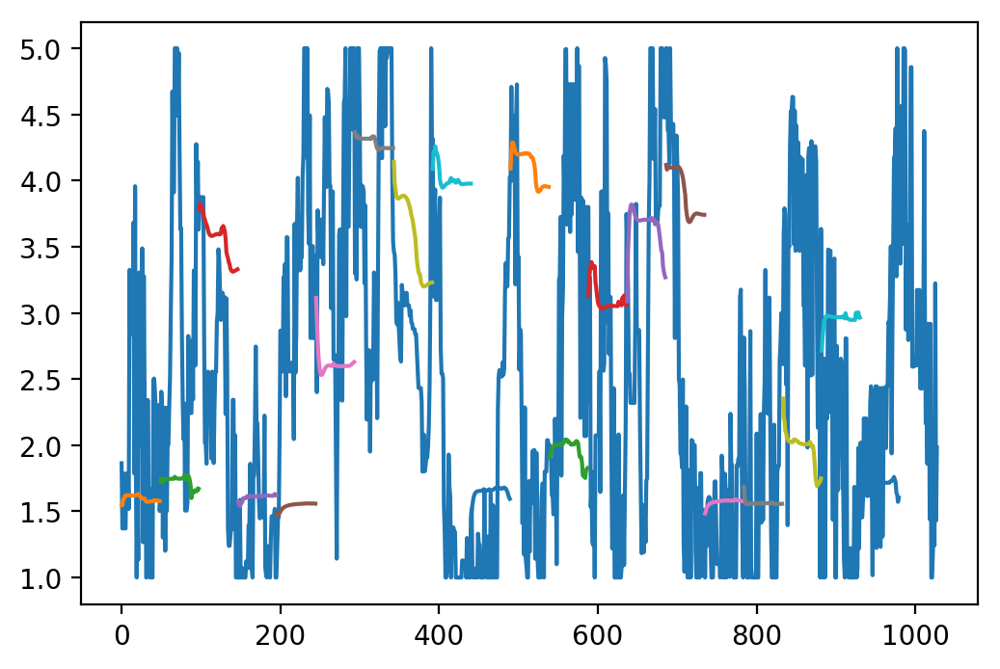

USING DATA(13/40): [..\data\IndicatorsAdded\HighVolume\BTC_NEO.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 300s 360ms/step - loss: 0.3477
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:04:59.676234


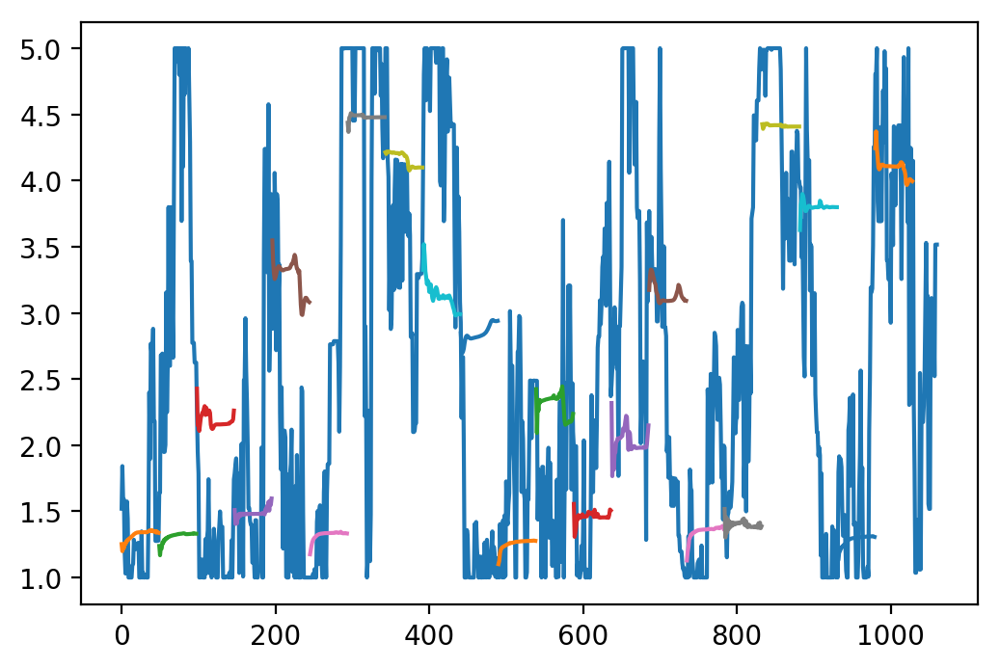

USING DATA(14/40): [..\data\IndicatorsAdded\MedVolume\BTC_MTL.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 318 batches per epoch
Epoch 1/1
318/318 [==============================] - 114s 359ms/step - loss: 0.3677
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:01:54.087341


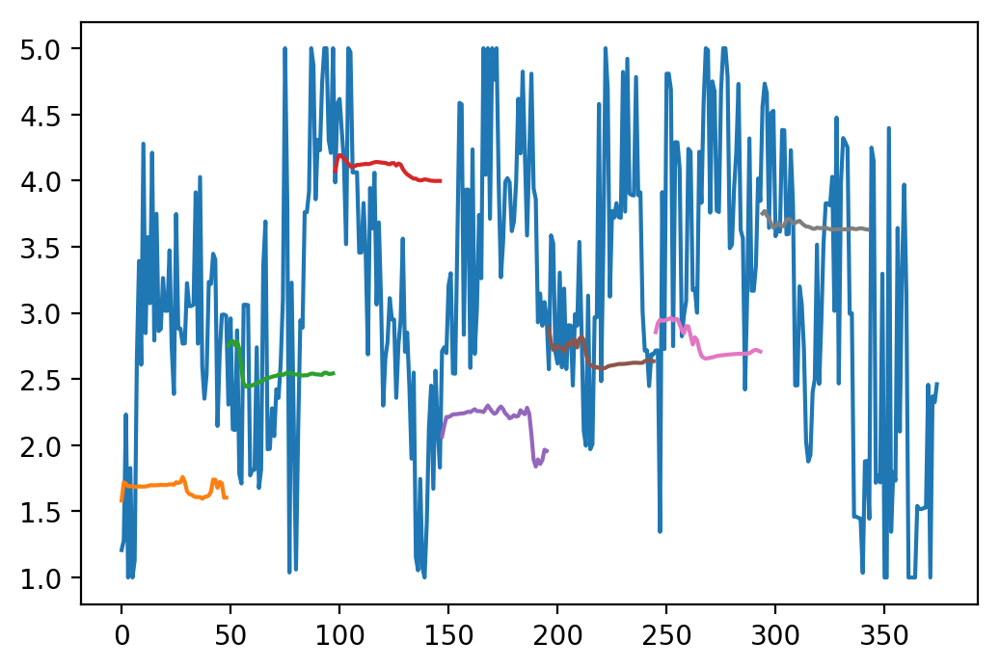

USING DATA(15/40): [..\data\IndicatorsAdded\VHighVolume\BTC_BCC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 298s 358ms/step - loss: 0.3887
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:04:58.283394


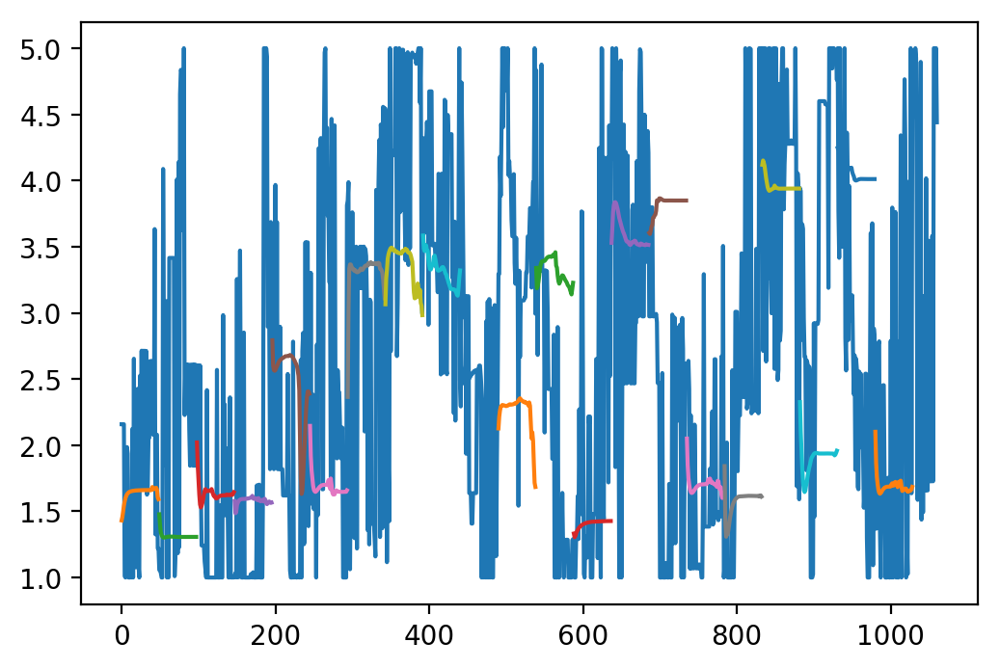

USING DATA(16/40): [..\data\IndicatorsAdded\MedVolume\BTC_VTC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 322 batches per epoch
Epoch 1/1
322/322 [==============================] - 115s 357ms/step - loss: 0.3015
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:01:55.130753


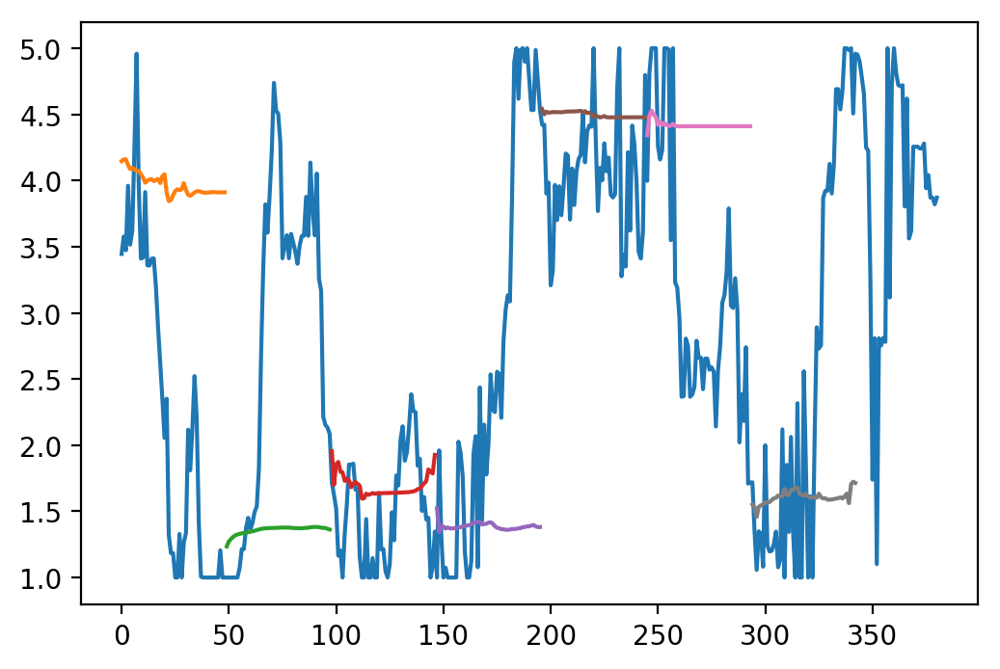

USING DATA(17/40): [..\data\IndicatorsAdded\HighVolume\BTC_XLM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 298s 358ms/step - loss: 0.2965
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:04:57.946794


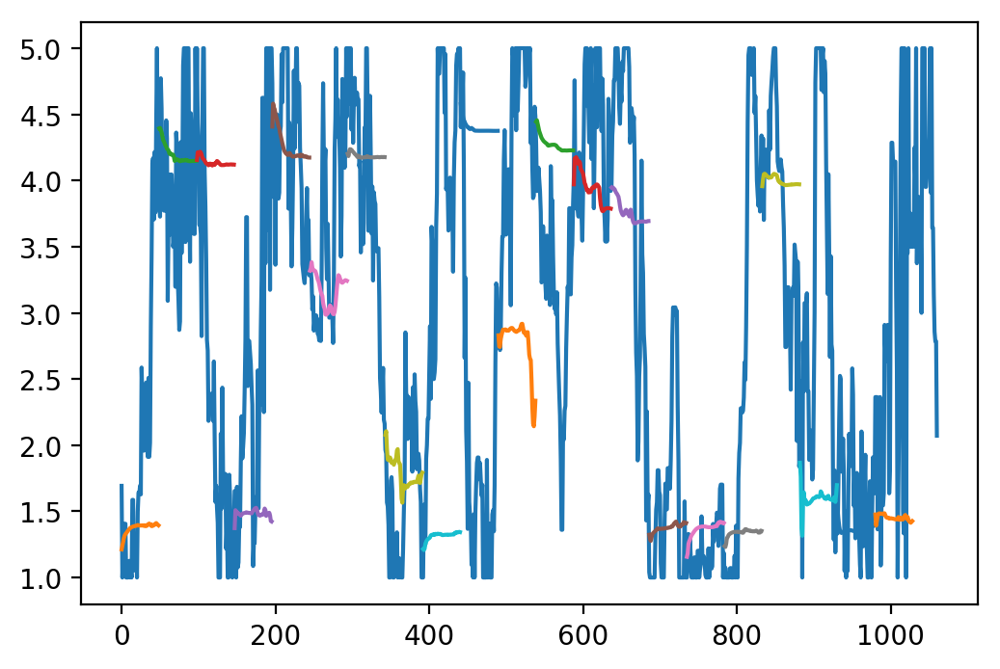

USING DATA(18/40): [..\data\IndicatorsAdded\HighVolume\BTC_SC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 712 batches per epoch
Epoch 1/1
712/712 [==============================] - 255s 358ms/step - loss: 0.3583
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:04:15.034395


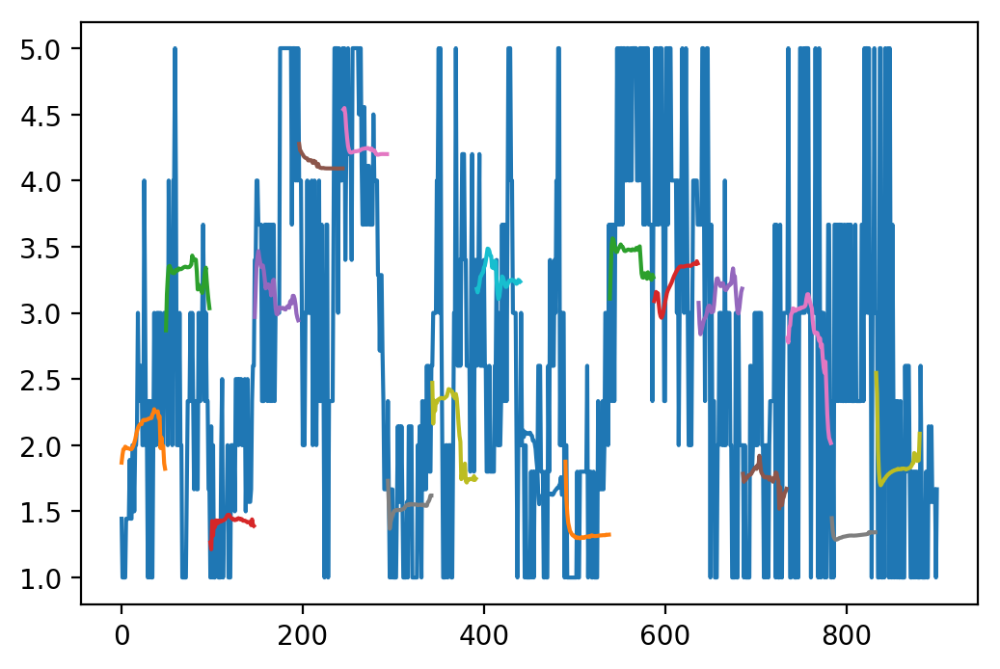

USING DATA(19/40): [..\data\IndicatorsAdded\MedVolume\BTC_WAVES.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 470 batches per epoch
Epoch 1/1
470/470 [==============================] - 168s 358ms/step - loss: 0.3481
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:02:48.506826


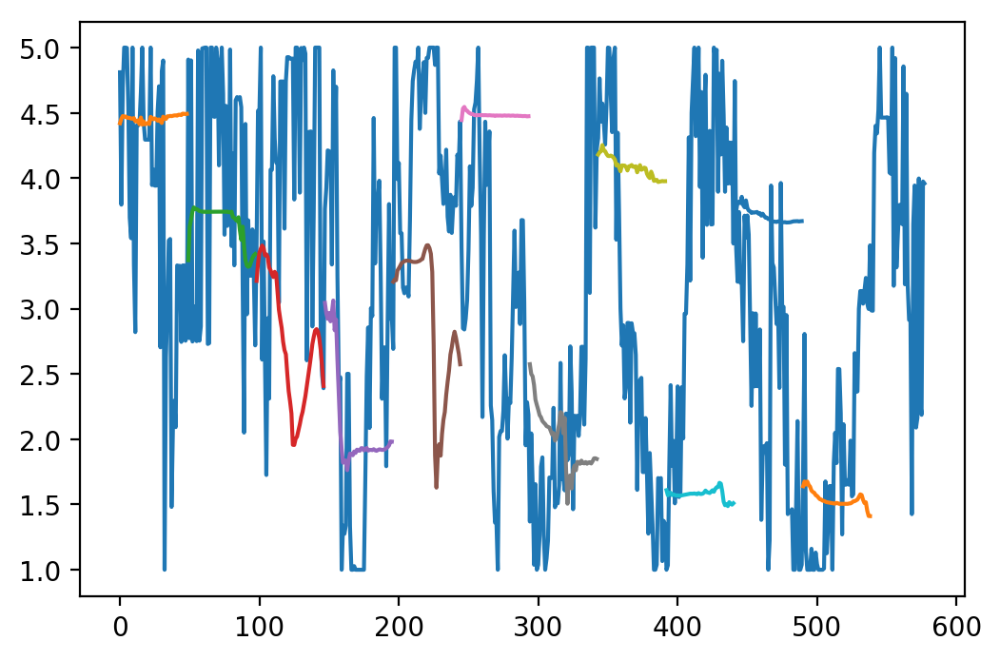

USING DATA(20/40): [..\data\IndicatorsAdded\VHighVolume\BTC_ETH.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 299s 359ms/step - loss: 0.3906
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:04:58.817168


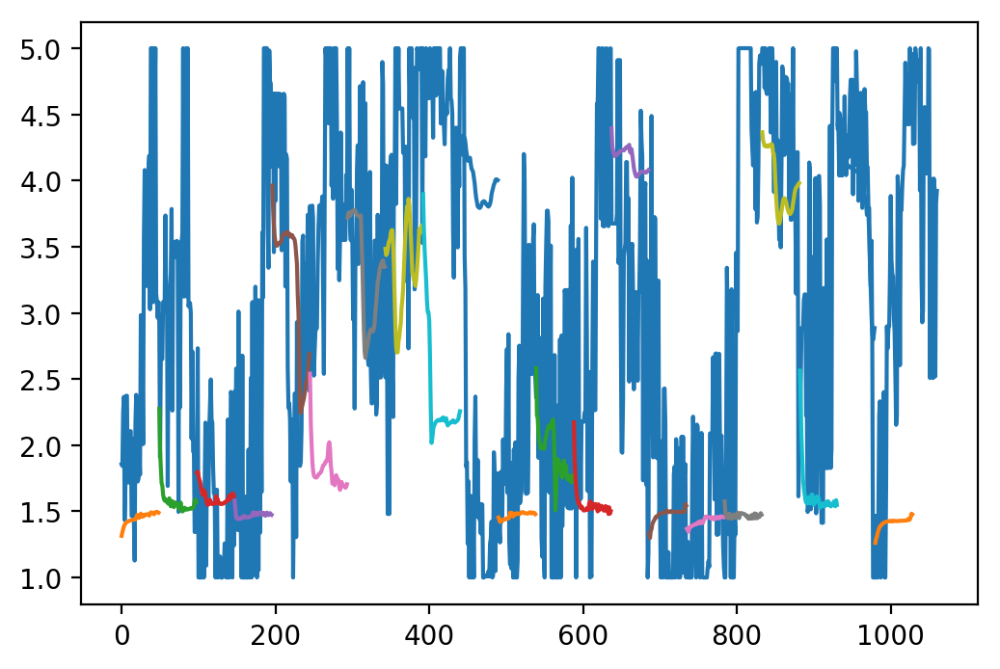

USING DATA(21/40): [..\data\IndicatorsAdded\MedVolume\BTC_HMQ.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 305 batches per epoch
Epoch 1/1
305/305 [==============================] - 110s 360ms/step - loss: 0.3230
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:01:49.714538


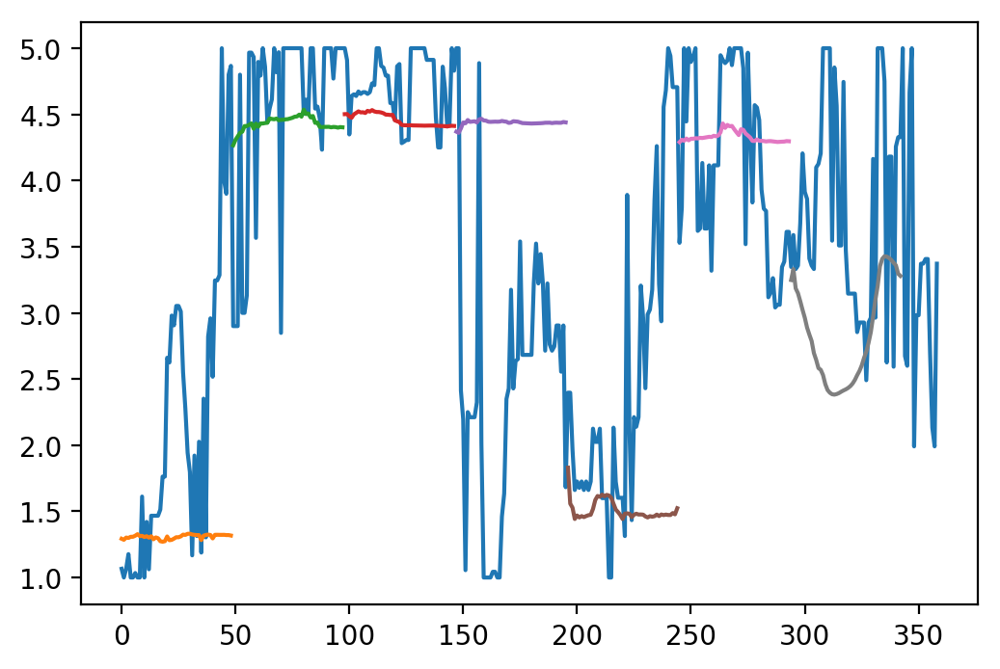

USING DATA(22/40): [..\data\IndicatorsAdded\VHighVolume\BTC_XVG.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 401 batches per epoch
Epoch 1/1
401/401 [==============================] - 144s 358ms/step - loss: 0.3431
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:02:23.585152


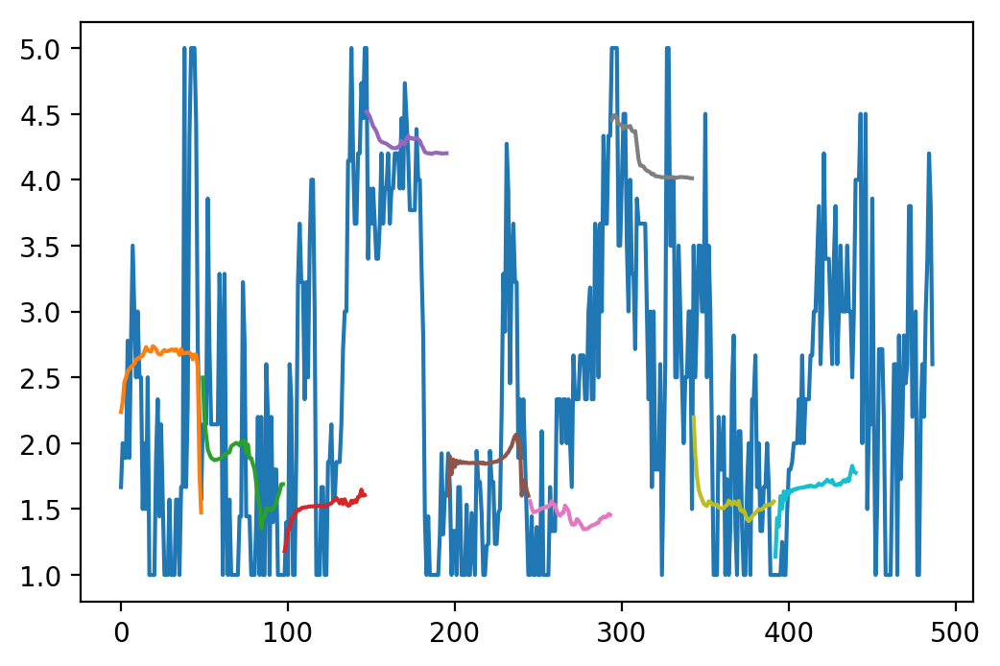

USING DATA(23/40): [..\data\IndicatorsAdded\MedVolume\BTC_EMC2.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 494 batches per epoch
Epoch 1/1
494/494 [==============================] - 177s 358ms/step - loss: 0.3010
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:02:57.118717


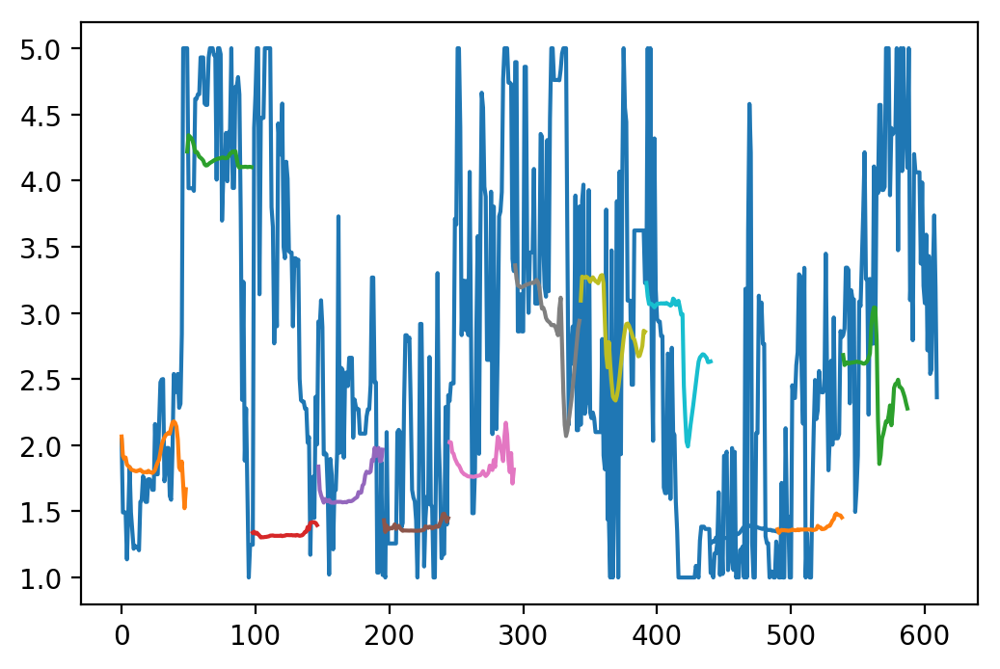

USING DATA(24/40): [..\data\IndicatorsAdded\VHighVolume\BTC_XRP.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 298s 358ms/step - loss: 0.2784
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:04:58.185355


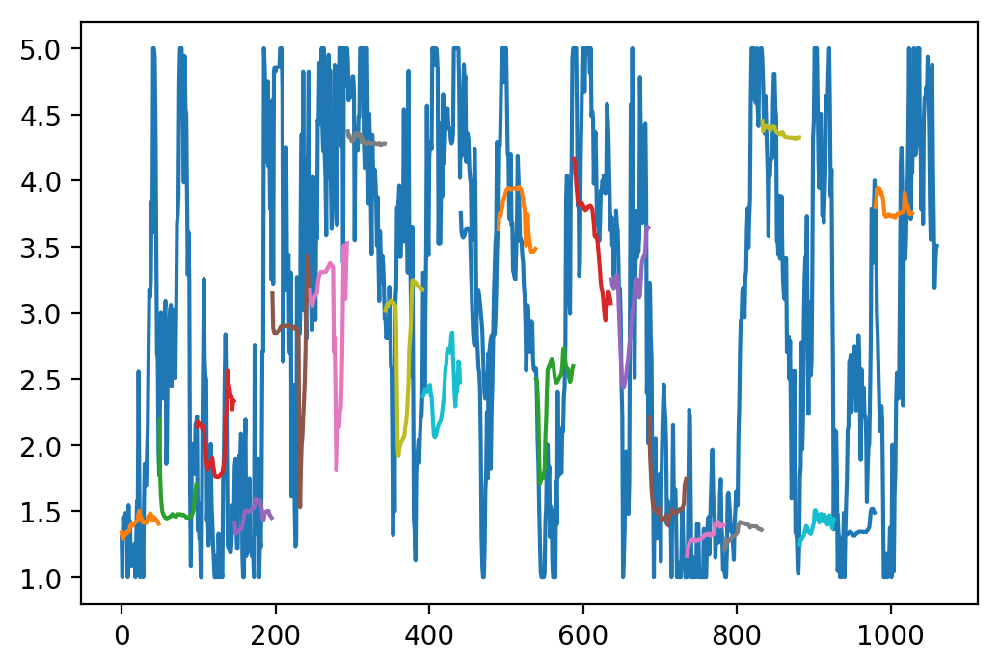

USING DATA(25/40): [..\data\IndicatorsAdded\MedVolume\BTC_BTG.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 783 batches per epoch
Epoch 1/1
783/783 [==============================] - 281s 359ms/step - loss: 0.4151
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:04:41.054173


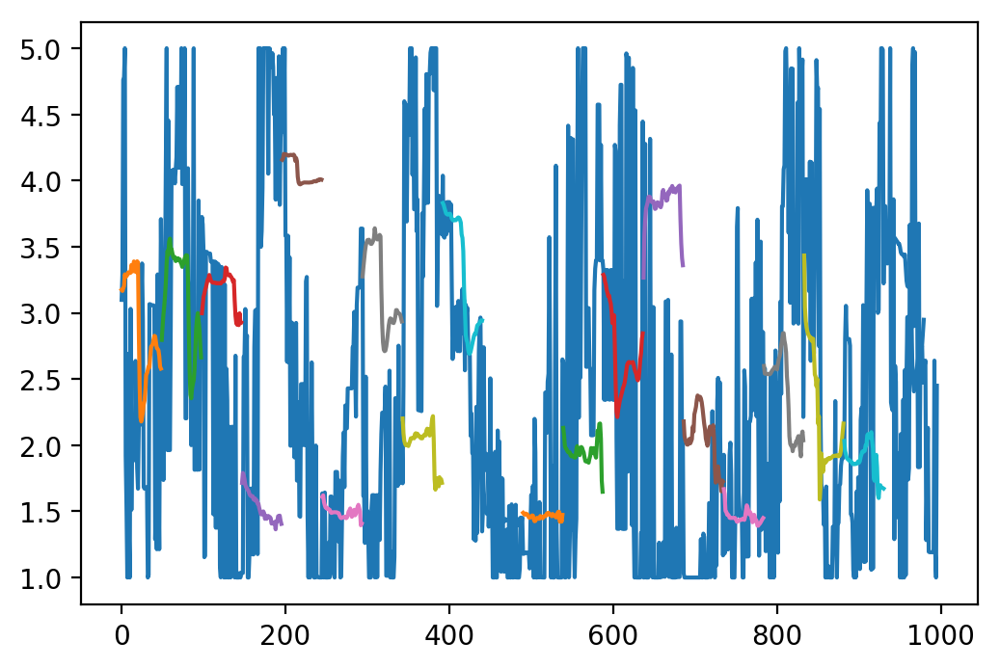

USING DATA(26/40): [..\data\IndicatorsAdded\MedVolume\BTC_ZEC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 832 batches per epoch
Epoch 1/1
832/832 [==============================] - 299s 359ms/step - loss: 0.3908
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:04:59.035553


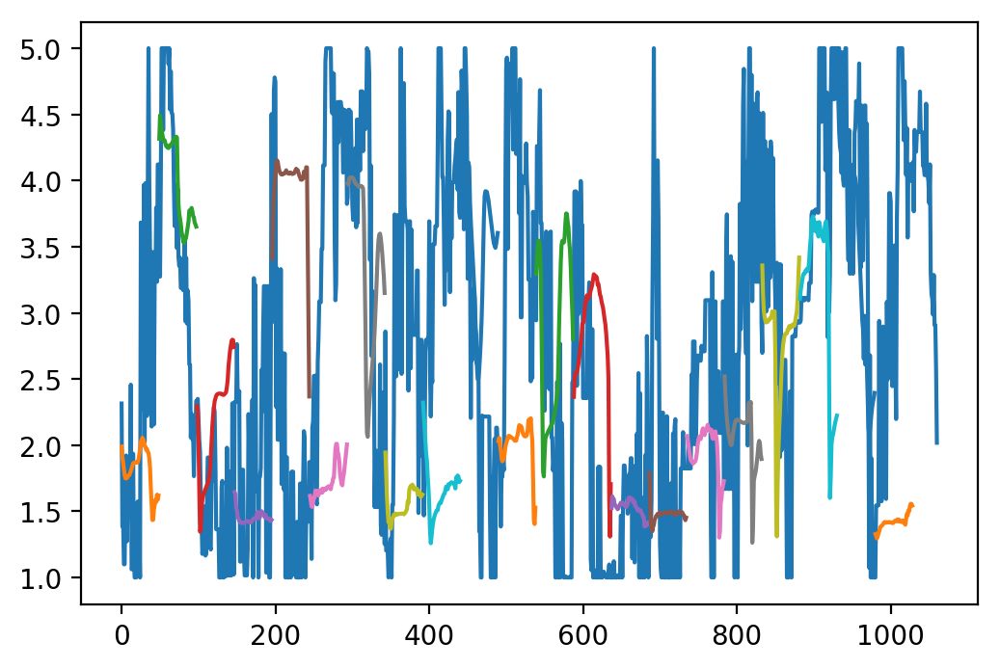

USING DATA(27/40): [..\data\IndicatorsAdded\MedVolume\BTC_STRAT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 756 batches per epoch
Epoch 1/1
756/756 [==============================] - 272s 359ms/step - loss: 0.2974
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:04:31.618570


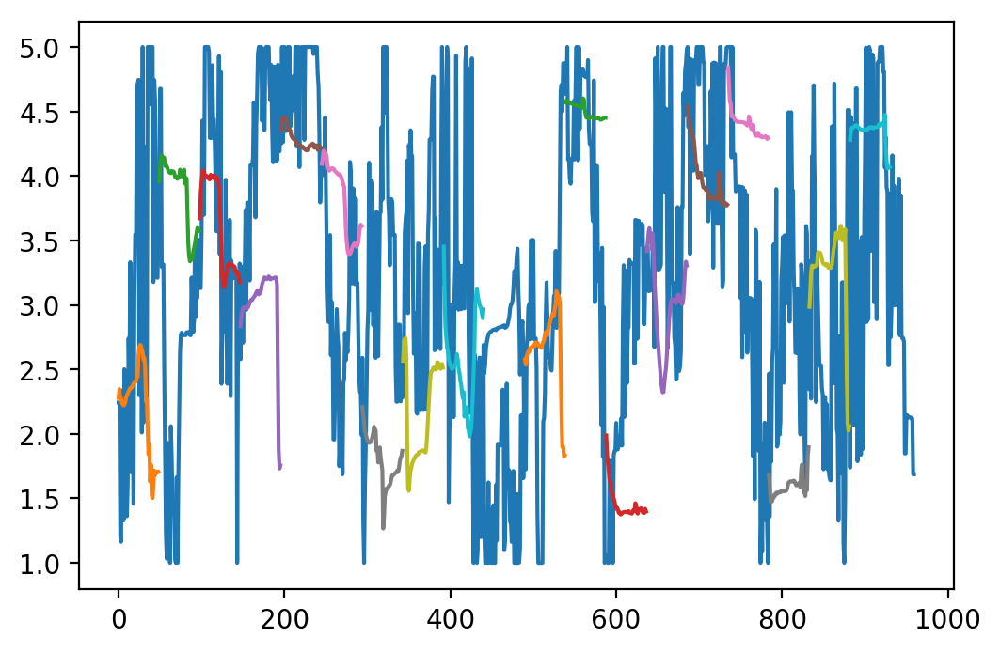

USING DATA(28/40): [..\data\IndicatorsAdded\MedVolume\BTC_STEEM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 569 batches per epoch
Epoch 1/1
569/569 [==============================] - 204s 358ms/step - loss: 0.3475
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:03:23.744533


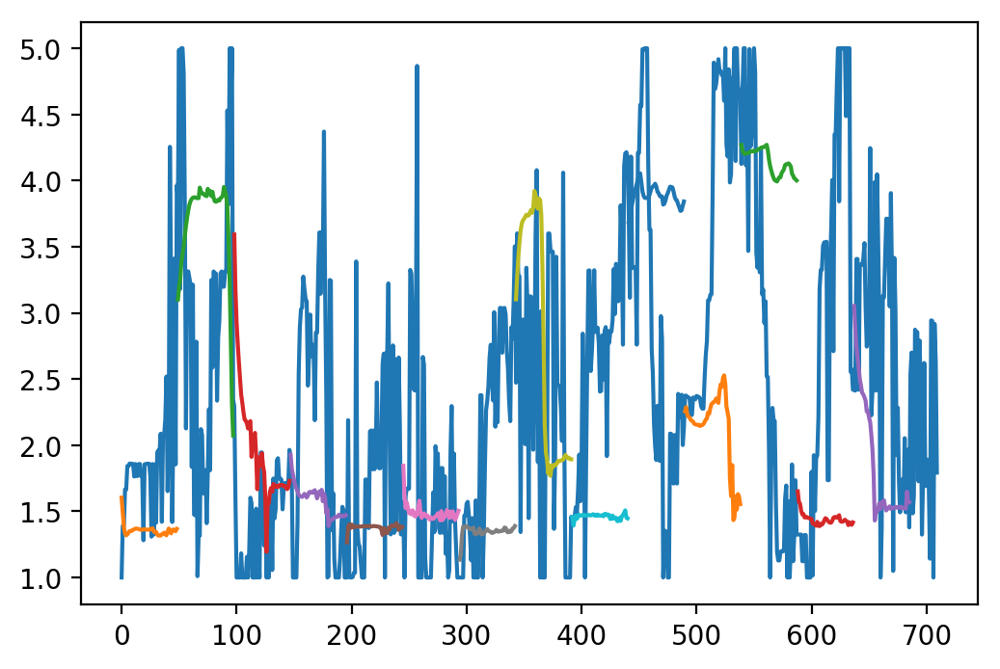

USING DATA(29/40): [..\data\IndicatorsAdded\MedVolume\BTC_XEM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 636 batches per epoch
Epoch 1/1
636/636 [==============================] - 228s 359ms/step - loss: 0.3053
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:03:48.111038


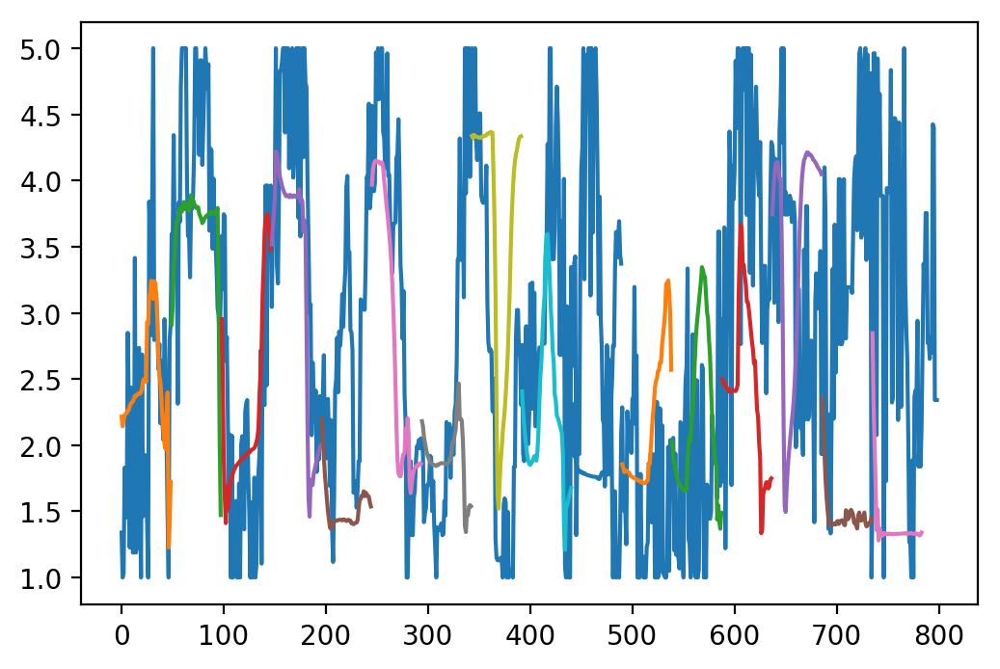

USING DATA(30/40): [..\data\IndicatorsAdded\MedVolume\BTC_DASH.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 650 batches per epoch
Epoch 1/1
650/650 [==============================] - 233s 358ms/step - loss: 0.4086
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:03:52.796229


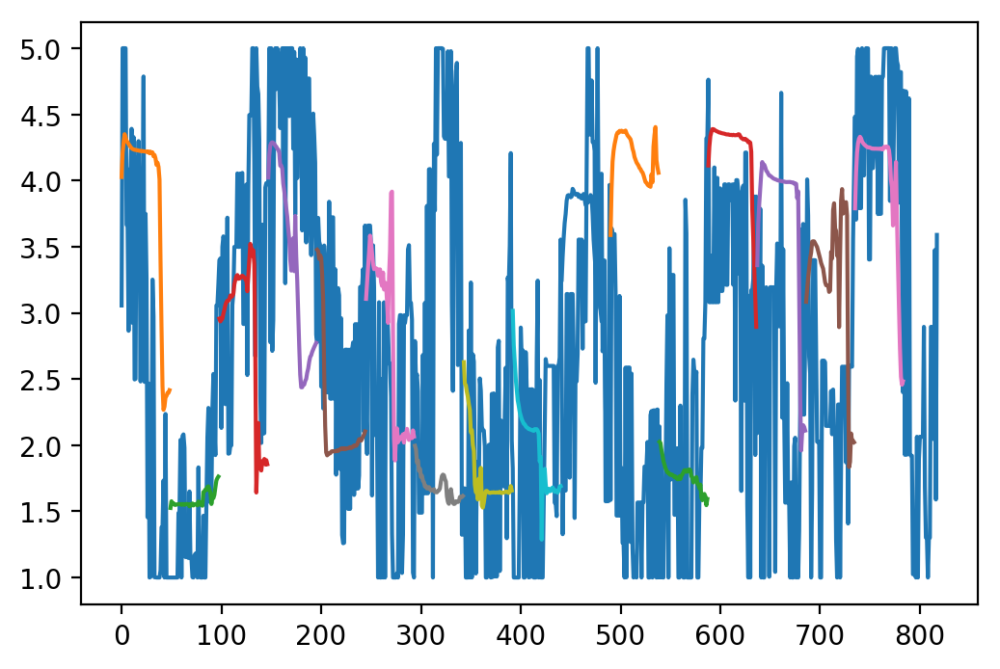

USING DATA(31/40): [..\data\IndicatorsAdded\MedVolume\BTC_BAY.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 347 batches per epoch
Epoch 1/1
347/347 [==============================] - 125s 359ms/step - loss: 0.3008
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:02:04.708986


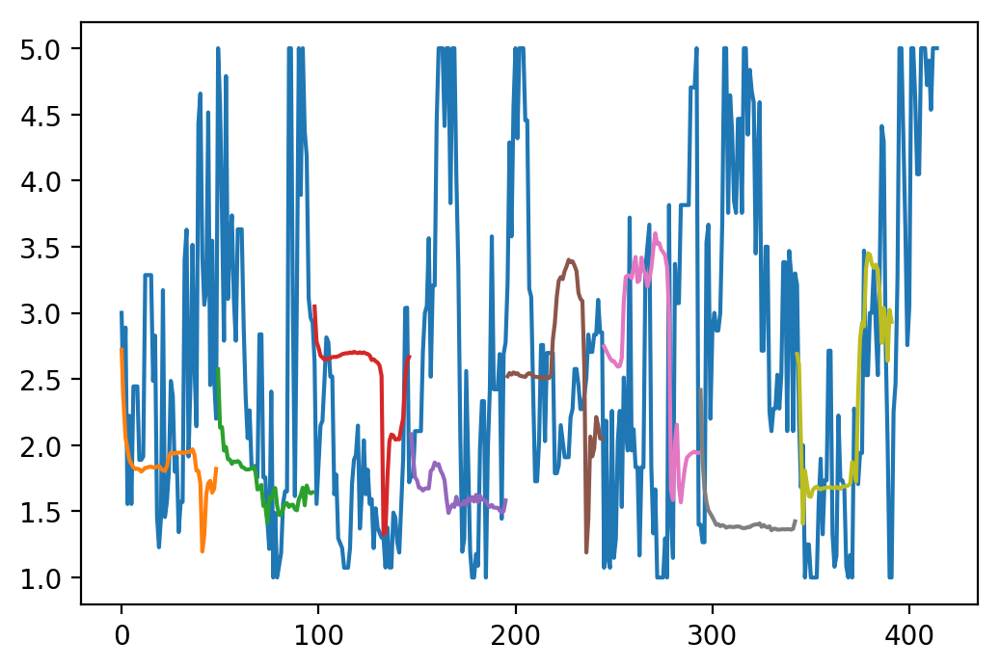

USING DATA(32/40): [..\data\IndicatorsAdded\MedVolume\BTC_QTUM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 570 batches per epoch
Epoch 1/1
570/570 [==============================] - 204s 358ms/step - loss: 0.3441
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:03:24.165379


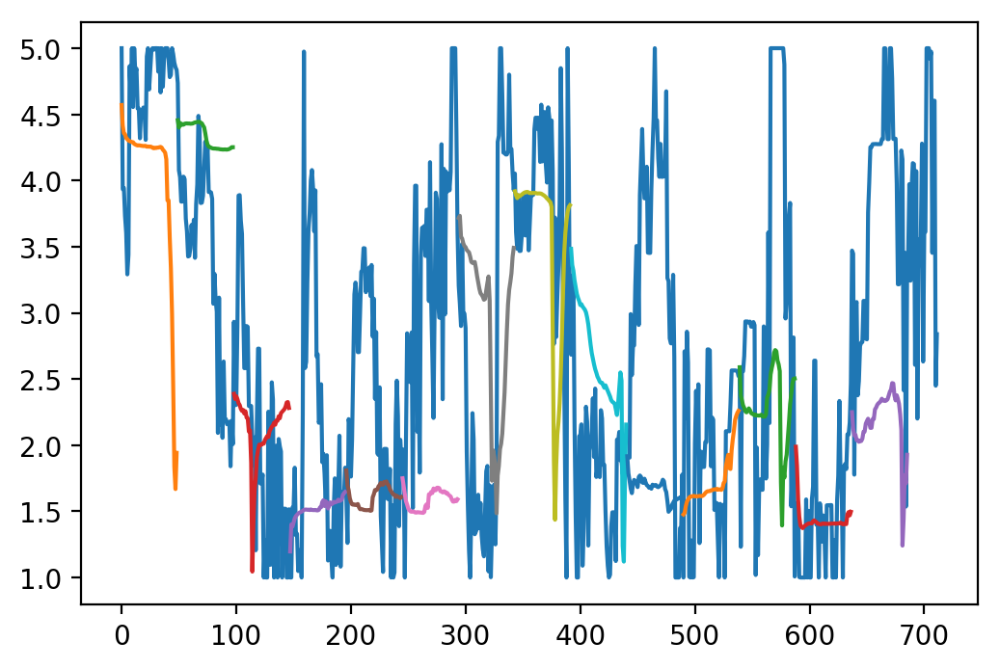

USING DATA(33/40): [..\data\IndicatorsAdded\MedVolume\BTC_SNT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 537 batches per epoch
Epoch 1/1
537/537 [==============================] - 193s 360ms/step - loss: 0.3371
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:03:13.151483


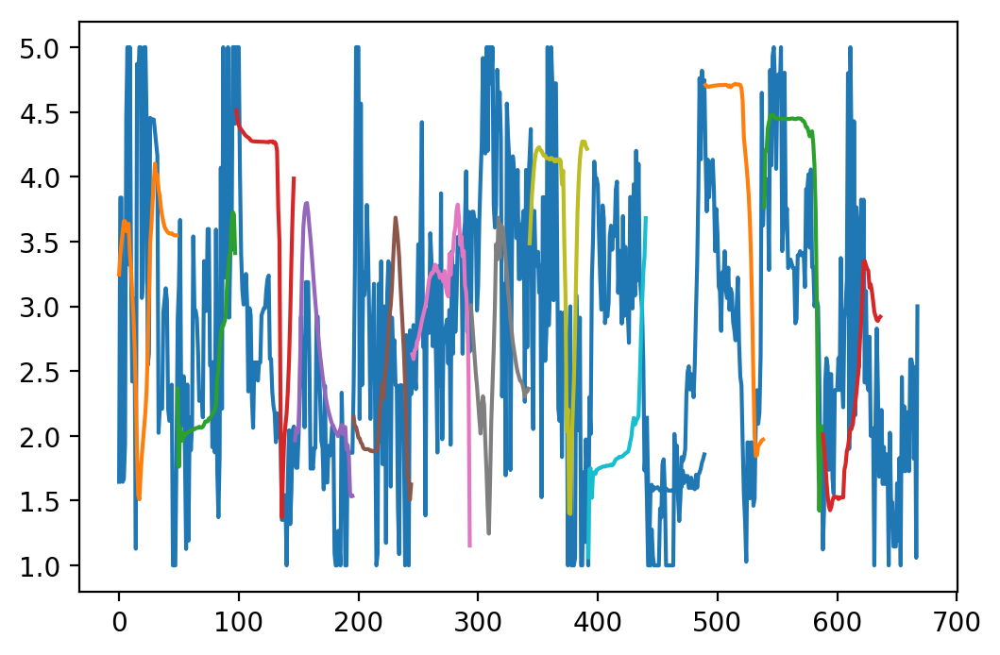

USING DATA(34/40): [..\data\IndicatorsAdded\MedVolume\BTC_SYS.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 336 batches per epoch
Epoch 1/1
336/336 [==============================] - 121s 359ms/step - loss: 0.2921
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:02:00.631398


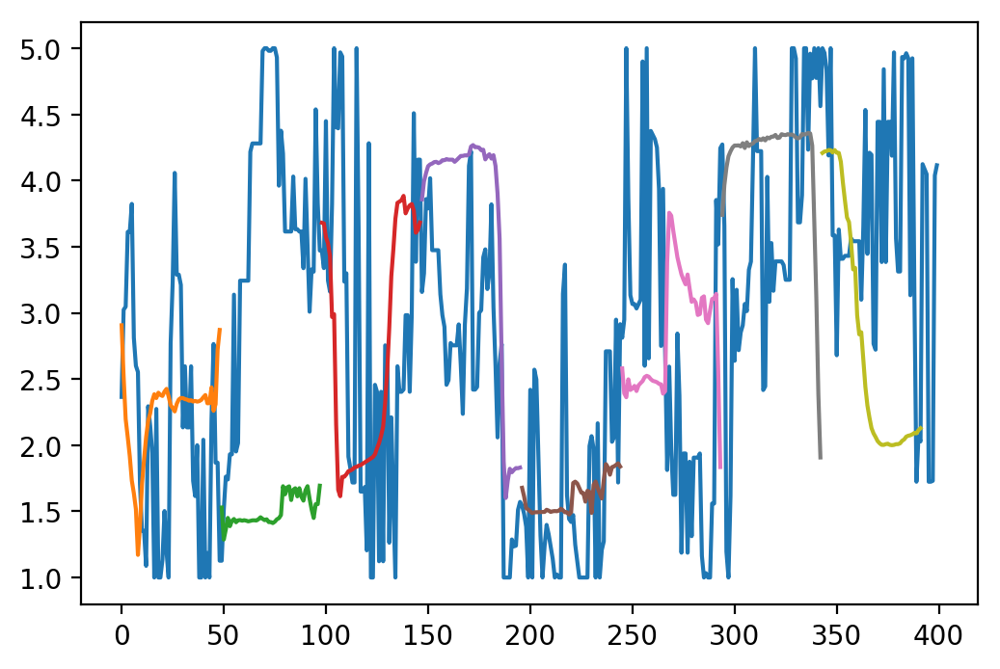

USING DATA(35/40): [..\data\IndicatorsAdded\MedVolume\BTC_ZCL.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 581 batches per epoch
Epoch 1/1
581/581 [==============================] - 209s 359ms/step - loss: 0.2975
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:03:28.770971


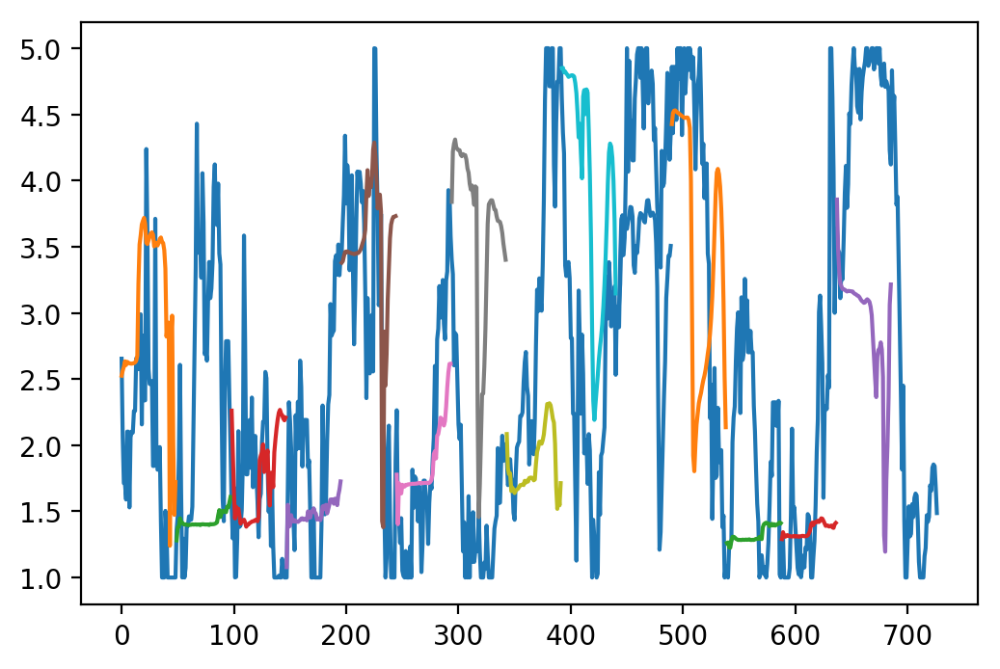

USING DATA(36/40): [..\data\IndicatorsAdded\VHighVolume\BTC_ADA.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 432 batches per epoch
Epoch 1/1
432/432 [==============================] - 155s 358ms/step - loss: 0.2812
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:02:34.717958


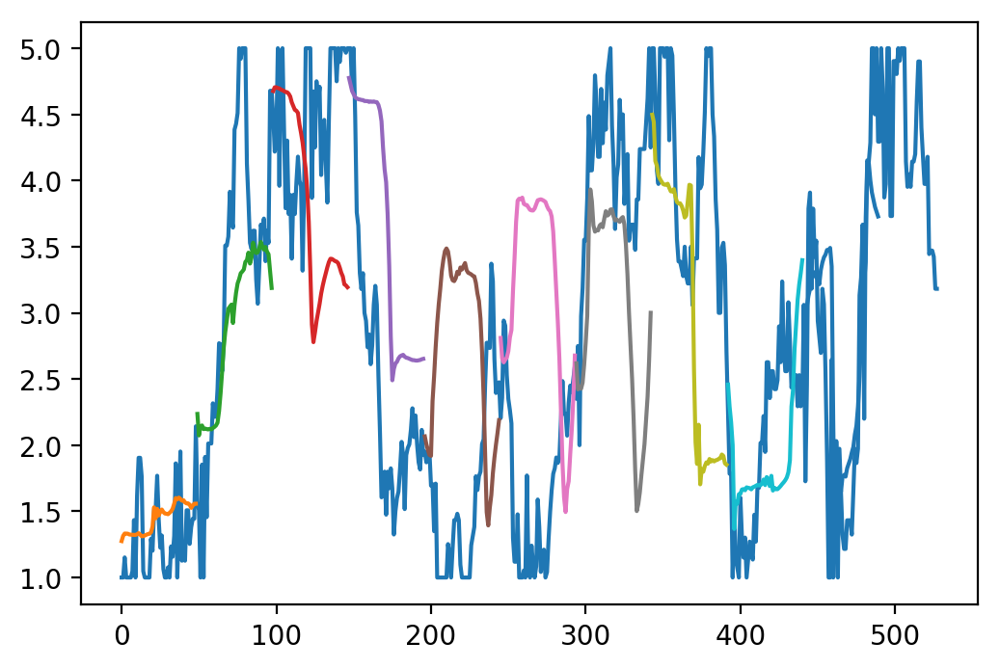

USING DATA(37/40): [..\data\IndicatorsAdded\MedVolume\BTC_FUN.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 391 batches per epoch
Epoch 1/1
391/391 [==============================] - 140s 359ms/step - loss: 0.3269
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:02:20.486205


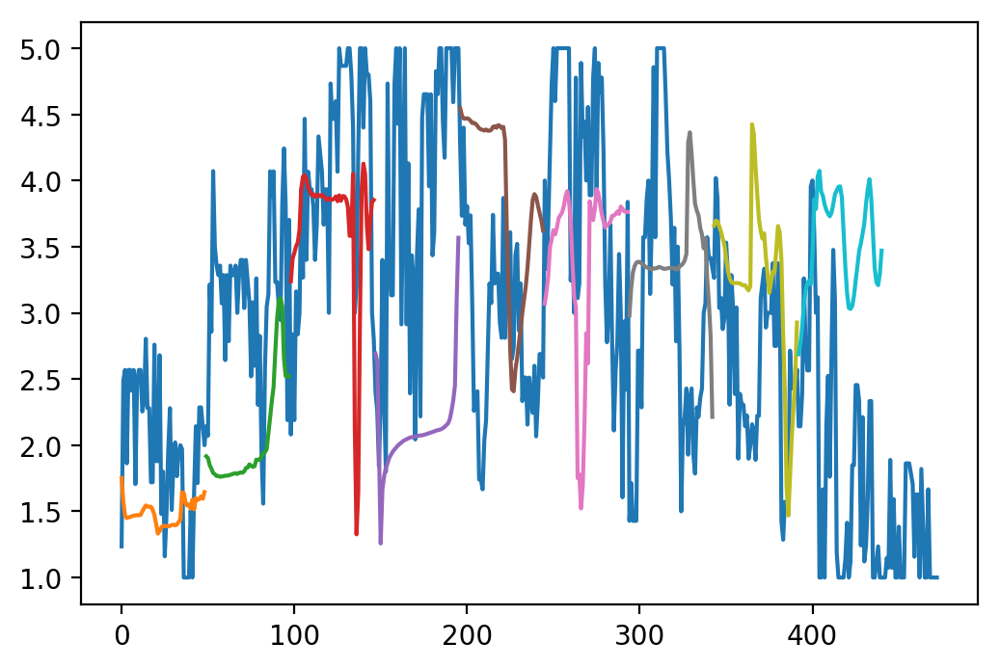

USING DATA(38/40): [..\data\IndicatorsAdded\MedVolume\BTC_OMG.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 697 batches per epoch
Epoch 1/1
697/697 [==============================] - 251s 360ms/step - loss: 0.3265
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:04:10.755399


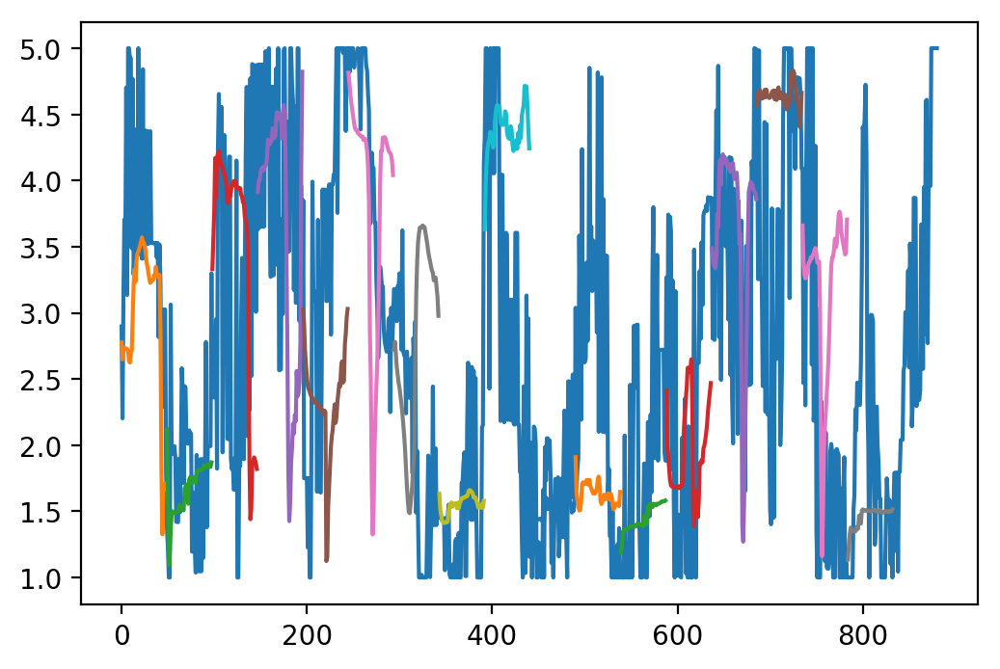

USING DATA(39/40): [..\data\IndicatorsAdded\MedVolume\BTC_PAY.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 505 batches per epoch
Epoch 1/1
505/505 [==============================] - 182s 360ms/step - loss: 0.3102
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:03:01.626206


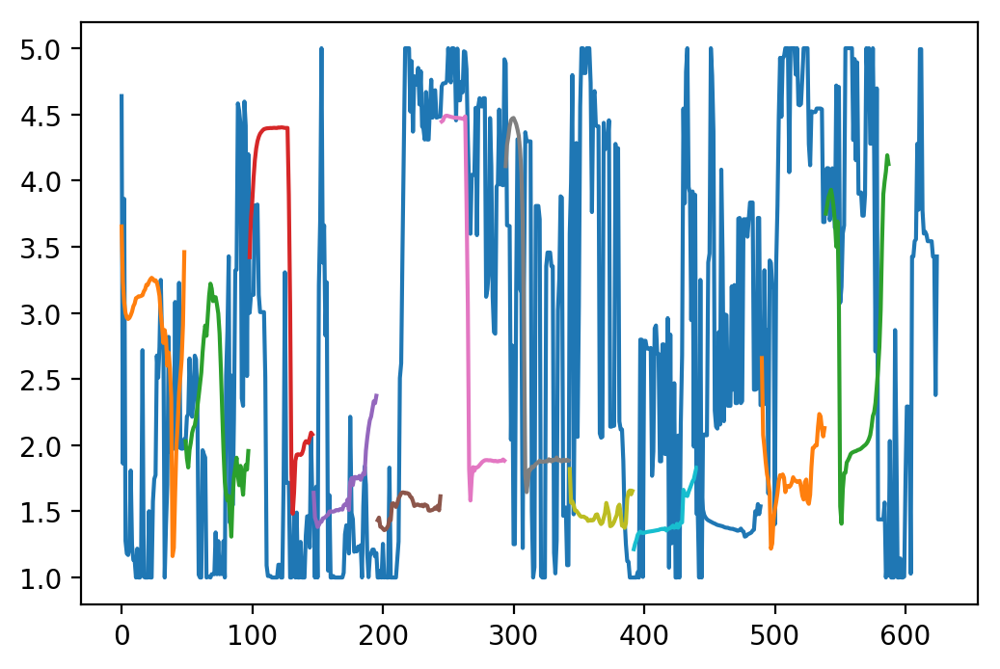

USING DATA(40/40): [..\data\IndicatorsAdded\MedVolume\BTC_MCO.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 434 batches per epoch
Epoch 1/1
434/434 [==============================] - 155s 358ms/step - loss: 0.2987
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_2018_10_16.h5
Time taken: 0:02:35.441601


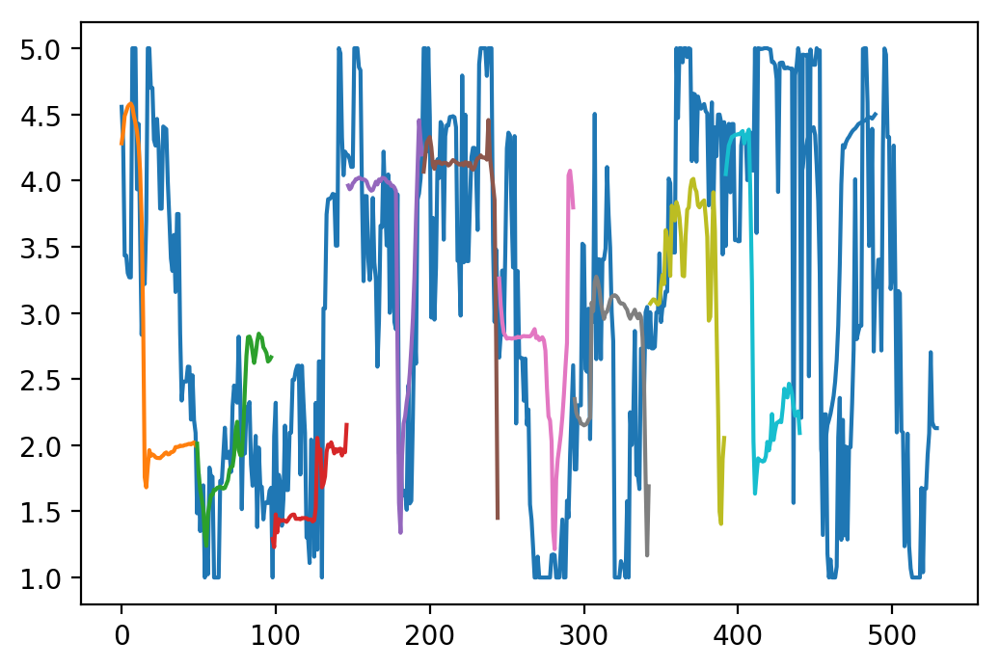

In [12]:
config['normalize'] = True
config['model_name'] = 'Model_MinMax1_5'
config['input_dim'] = 16
config['sequence_length'] = 50
TrainTestPlot(config, columns, 'MINMAX1_5')

### WAVE TRANSFORM APPLIED 
This splits each feature into mother and father wavelets, which doubles our feature-column length. Model parameters are adjusted to conform to this. 

[Model] Model Compiled
USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_LTC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 319s 385ms/step - loss: 0.8026
[Model] Training Completed. Model saved as saved_models\Model_StdWT_2018_10_14.h5
Time taken: 0:05:24.129142


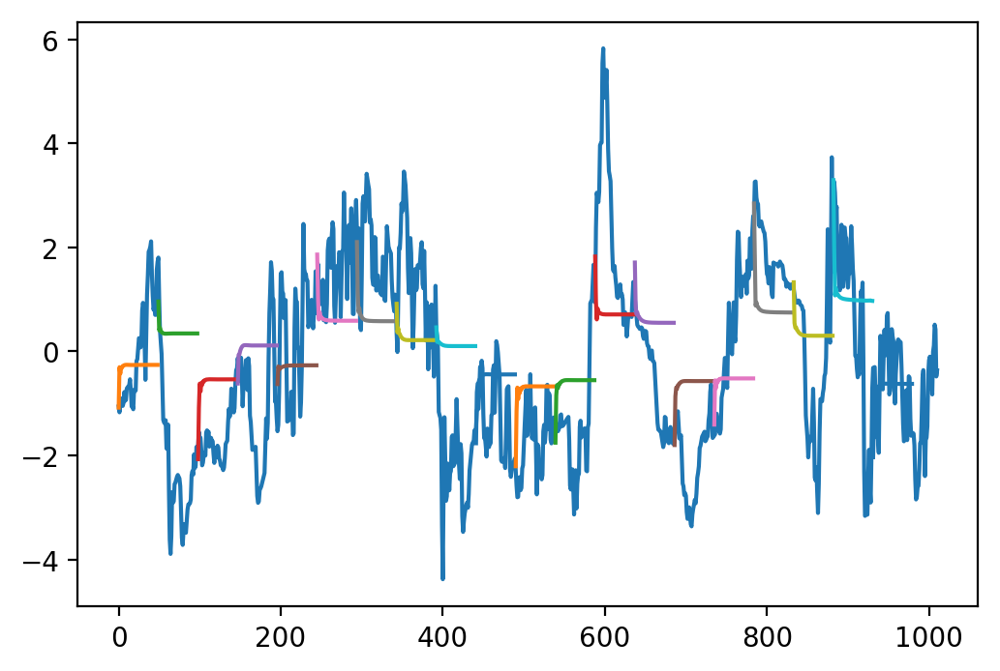

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_NEO.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 316s 380ms/step - loss: 0.4516
[Model] Training Completed. Model saved as saved_models\Model_StdWT_2018_10_14.h5
Time taken: 0:05:15.563759


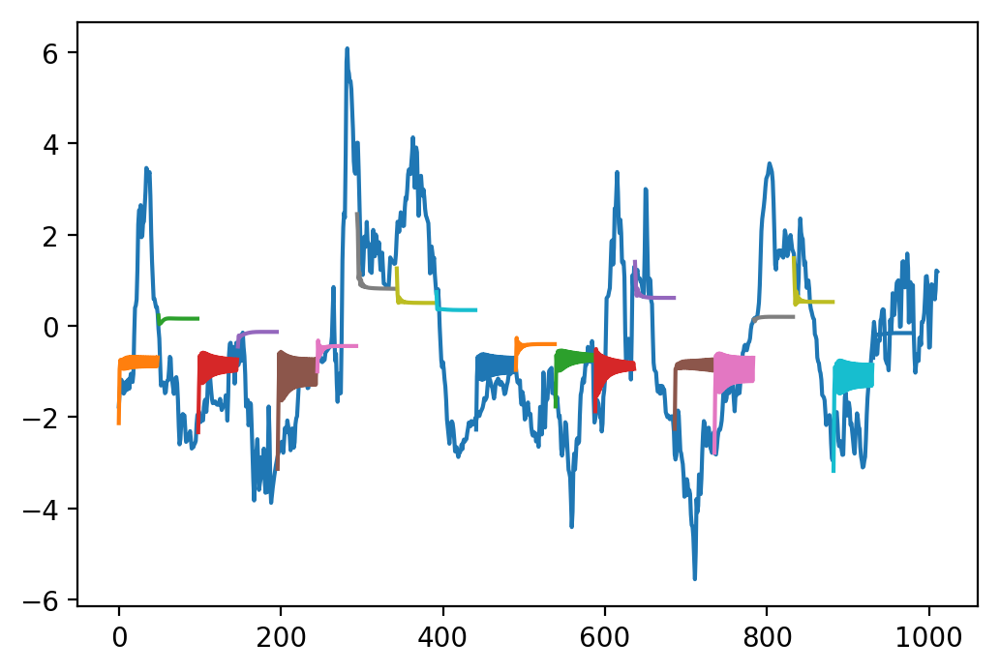

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_NXT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 329 batches per epoch
Epoch 1/1
329/329 [==============================] - 125s 379ms/step - loss: 0.4571
[Model] Training Completed. Model saved as saved_models\Model_StdWT_2018_10_14.h5
Time taken: 0:02:04.708811


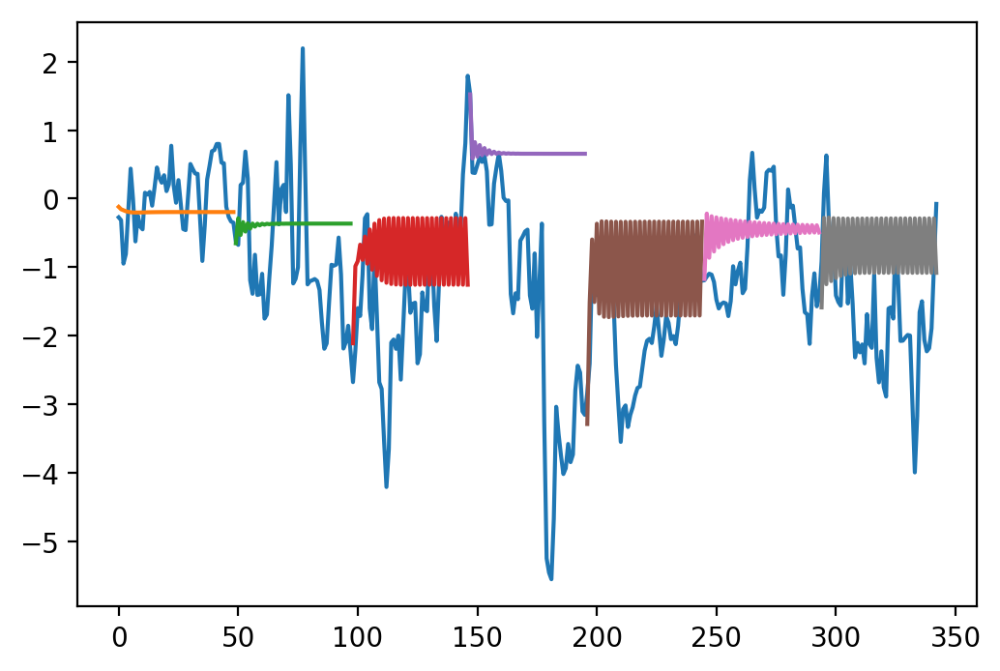

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_SC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 710 batches per epoch
Epoch 1/1
710/710 [==============================] - 277s 391ms/step - loss: 0.5008
[Model] Training Completed. Model saved as saved_models\Model_StdWT_2018_10_14.h5
Time taken: 0:04:37.422527


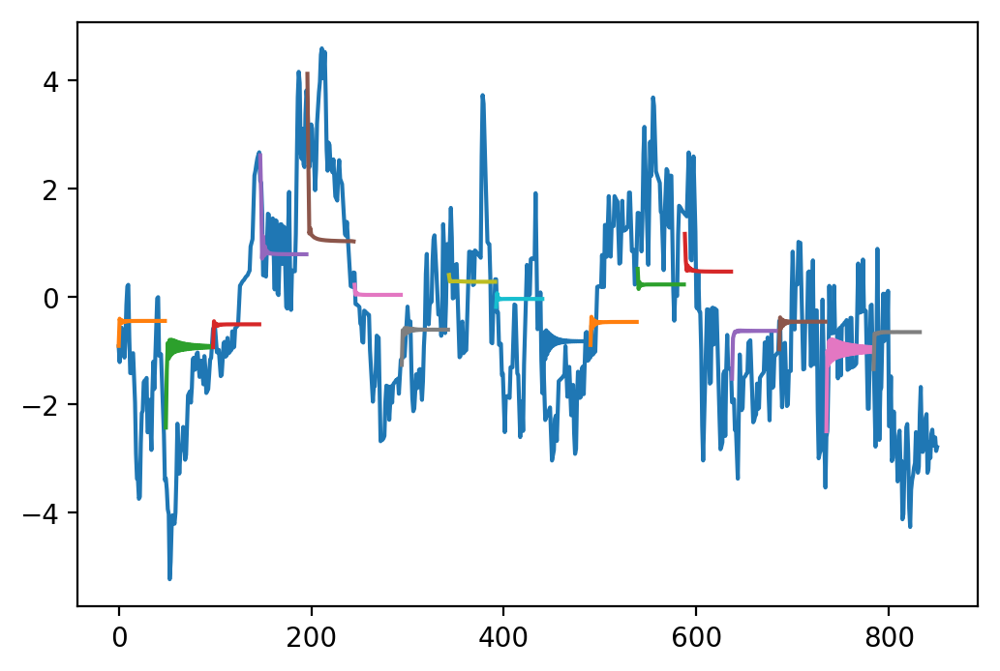

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_XLM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 328s 396ms/step - loss: 0.4256
[Model] Training Completed. Model saved as saved_models\Model_StdWT_2018_10_14.h5
Time taken: 0:05:28.417706


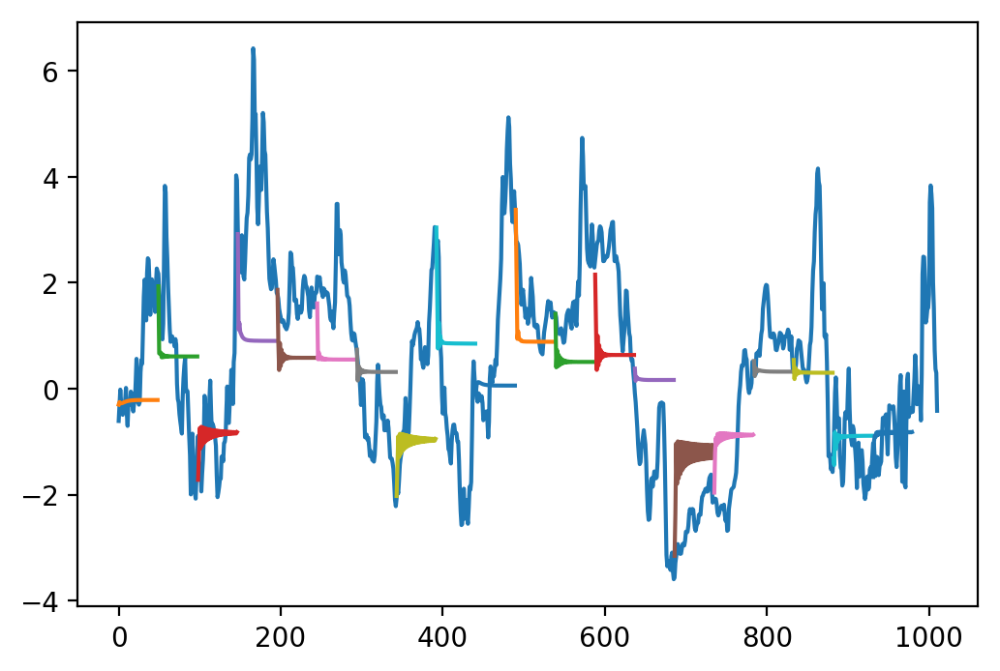

In [9]:
config['normalize'] = True
config['model_name'] = 'Model_StdWT'
config['input_dim'] = 32
config['sequence_length'] = 100
TrainTestPlot(config, columns, "STD_WT")

[Model] Model Compiled
USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_LTC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 322s 388ms/step - loss: 0.0657
[Model] Training Completed. Model saved as saved_models\Model_StdWT_2018_10_14.h5
Time taken: 0:05:27.615532


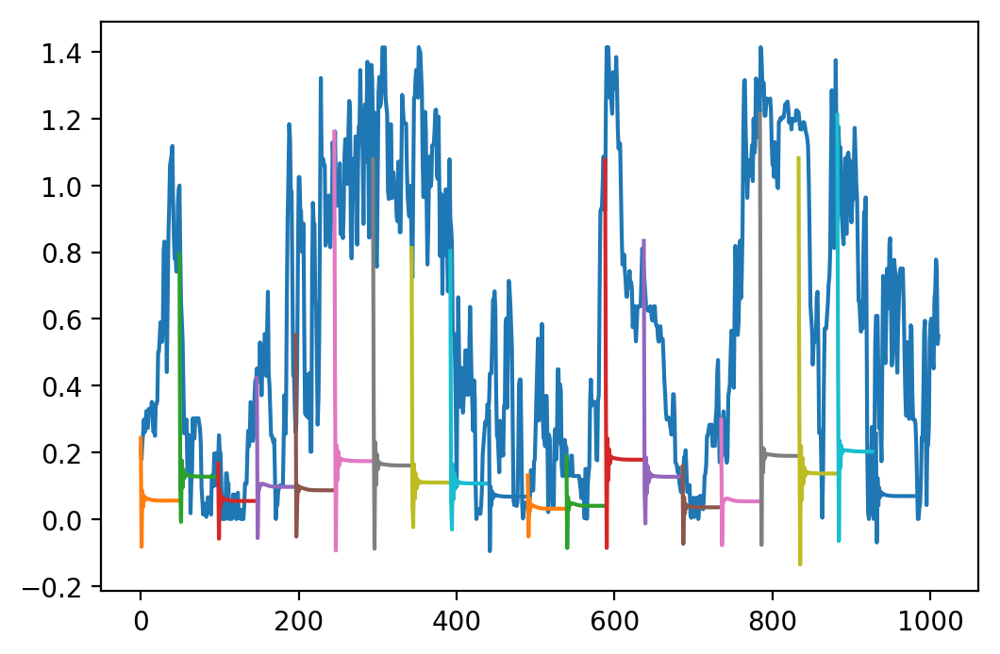

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_NEO.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 330s 398ms/step - loss: 0.0279
[Model] Training Completed. Model saved as saved_models\Model_StdWT_2018_10_15.h5
Time taken: 0:05:29.975080


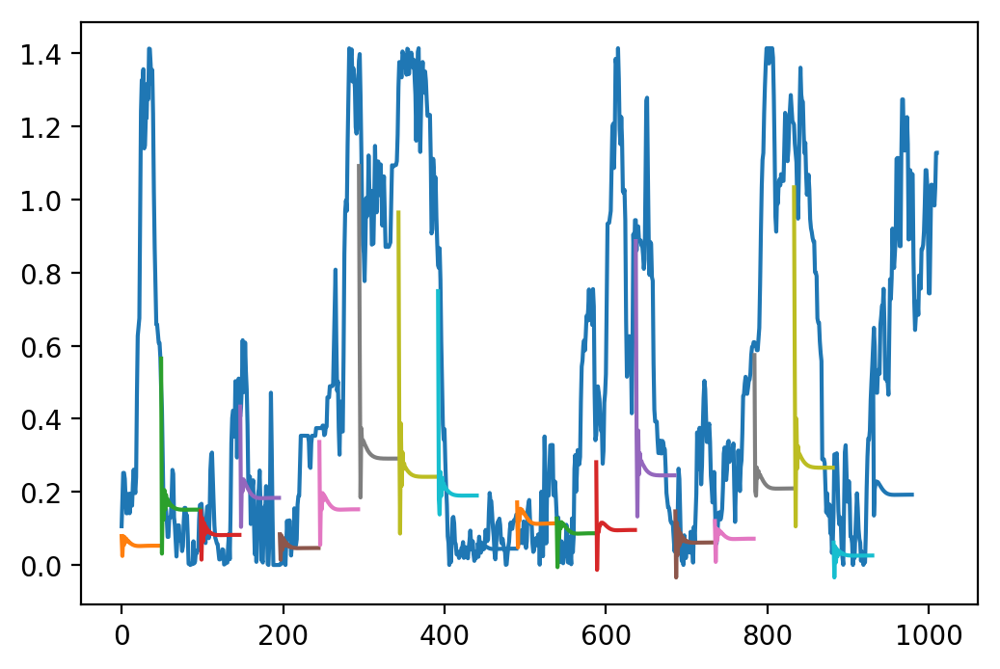

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_NXT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 329 batches per epoch
Epoch 1/1
329/329 [==============================] - 122s 371ms/step - loss: 0.0270
[Model] Training Completed. Model saved as saved_models\Model_StdWT_2018_10_15.h5
Time taken: 0:02:02.201689


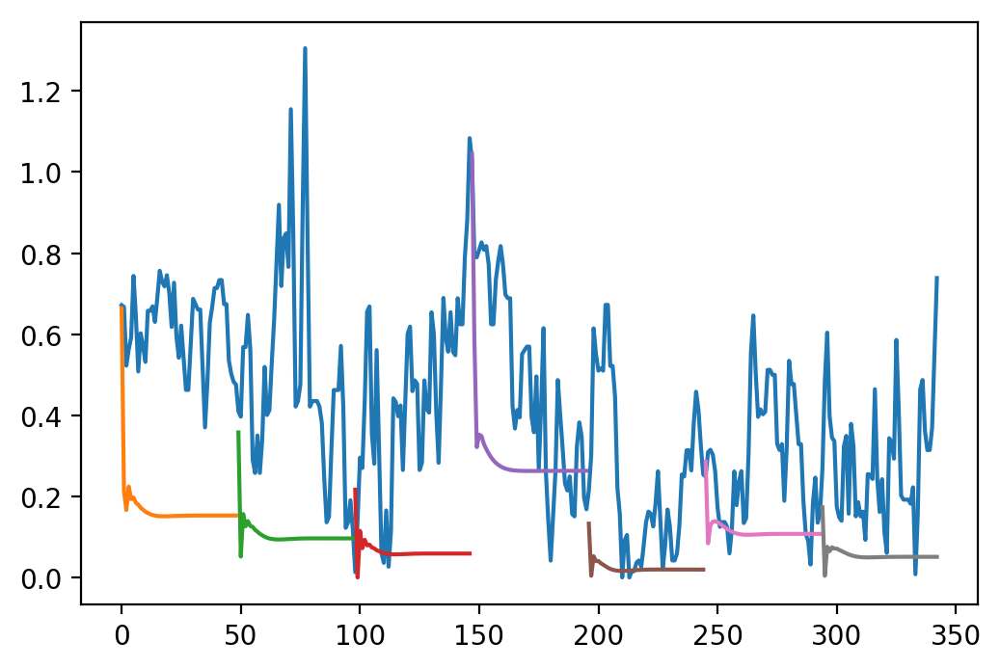

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_SC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 710 batches per epoch
Epoch 1/1
710/710 [==============================] - 261s 368ms/step - loss: 0.0287
[Model] Training Completed. Model saved as saved_models\Model_StdWT_2018_10_15.h5
Time taken: 0:04:21.392705


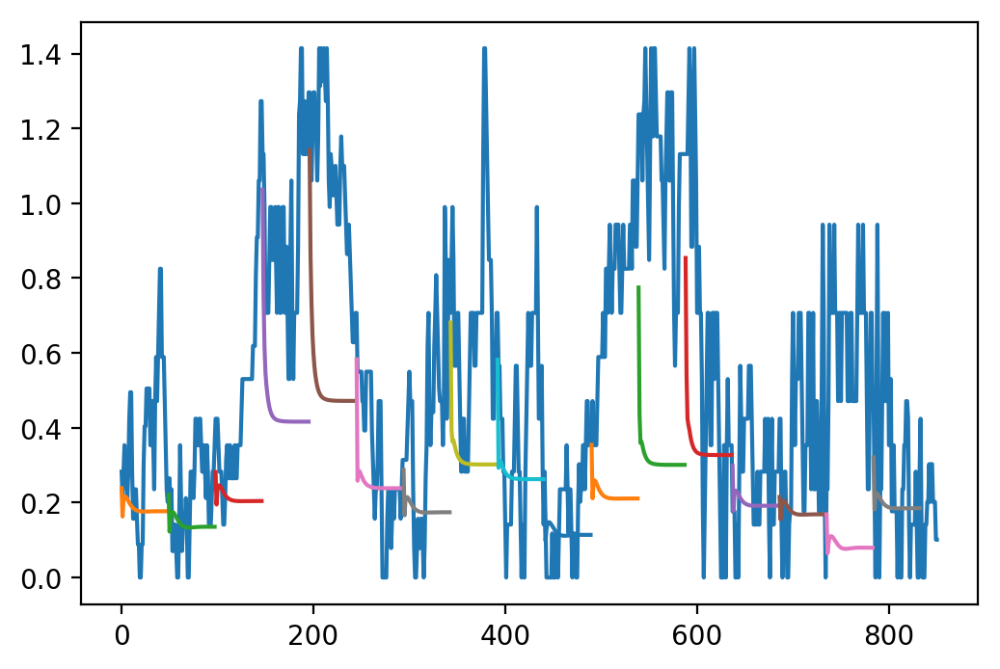

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_XLM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 342s 412ms/step - loss: 0.0232
[Model] Training Completed. Model saved as saved_models\Model_StdWT_2018_10_15.h5
Time taken: 0:05:41.800227


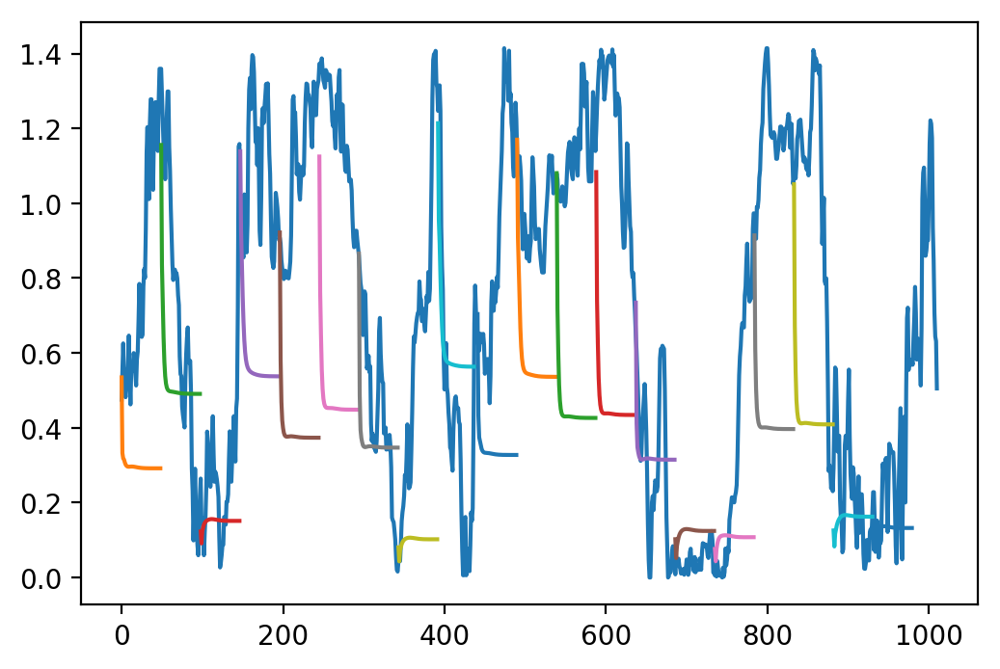

In [10]:
config['normalize'] = True
config['model_name'] = 'Model_MinMax1_WT'
config['input_dim'] = 32
config['sequence_length'] = 100
TrainTestPlot(config, columns, "MINMAX1_WT")

[Model] Model Compiled
USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_LTC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 327s 394ms/step - loss: 0.6085
[Model] Training Completed. Model saved as saved_models\Model_MinMax3_WT_2018_10_15.h5
Time taken: 0:05:33.533132


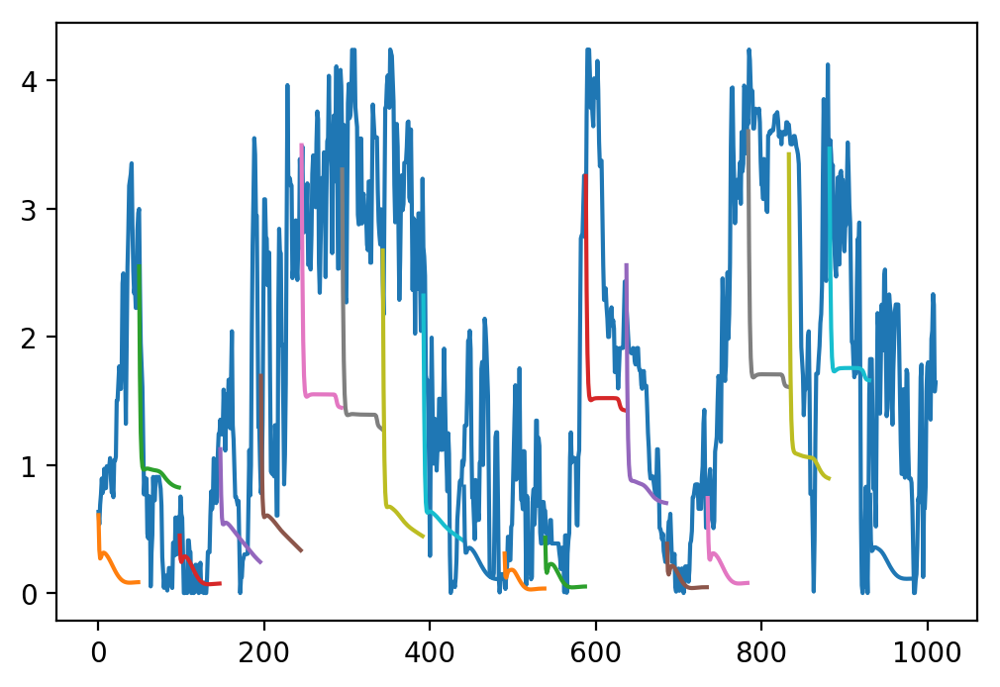

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_NEO.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 319s 384ms/step - loss: 0.2423
[Model] Training Completed. Model saved as saved_models\Model_MinMax3_WT_2018_10_15.h5
Time taken: 0:05:18.620260


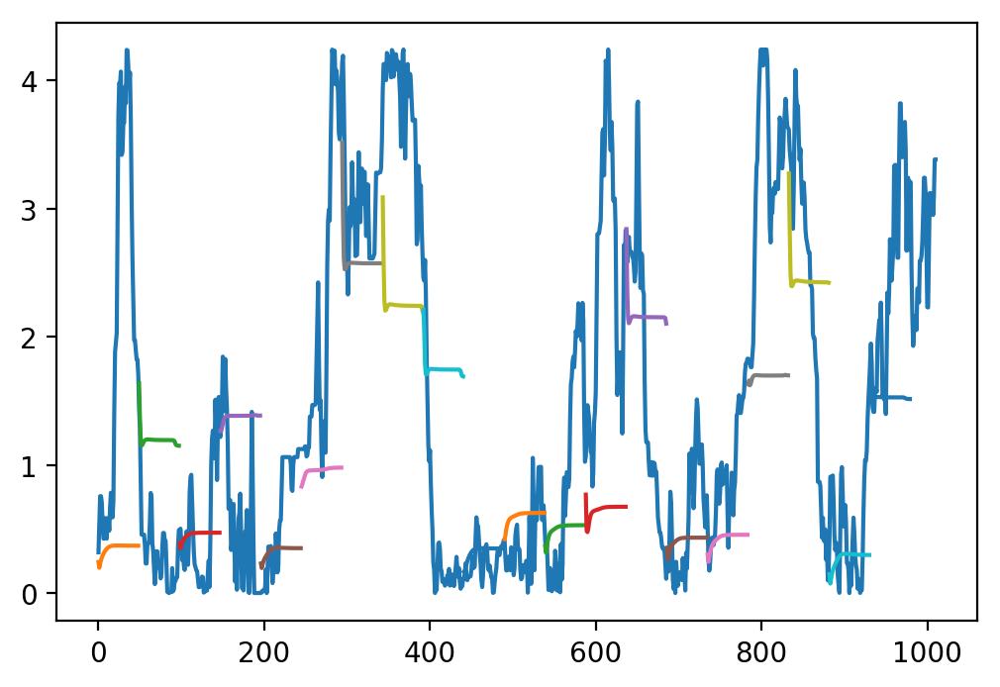

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_NXT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 329 batches per epoch
Epoch 1/1
329/329 [==============================] - 132s 401ms/step - loss: 0.2351
[Model] Training Completed. Model saved as saved_models\Model_MinMax3_WT_2018_10_15.h5
Time taken: 0:02:11.837707


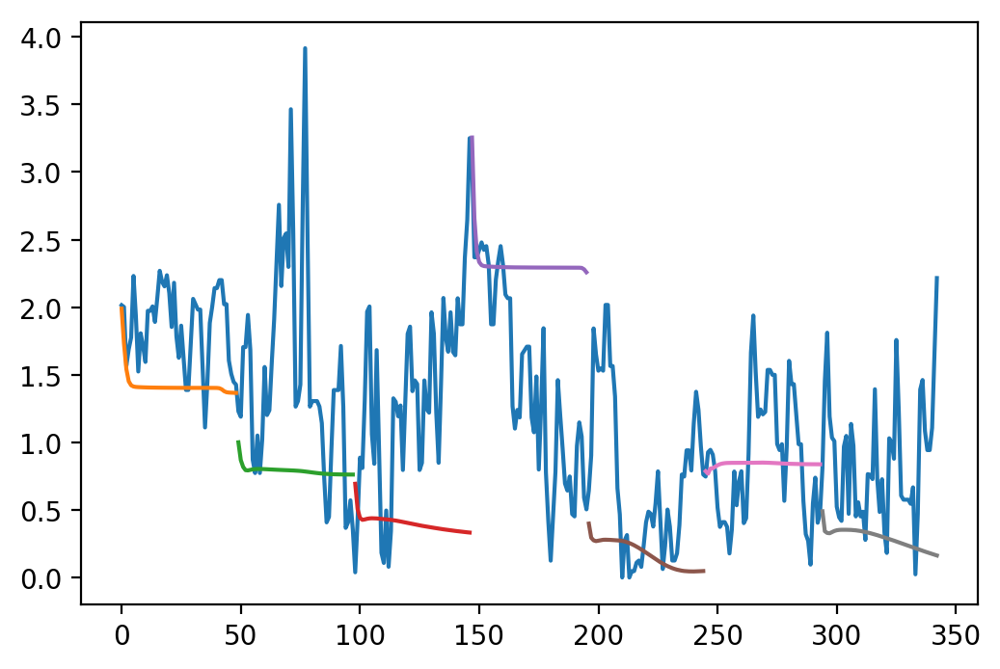

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_SC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 710 batches per epoch
Epoch 1/1
710/710 [==============================] - 272s 384ms/step - loss: 0.2561
[Model] Training Completed. Model saved as saved_models\Model_MinMax3_WT_2018_10_15.h5
Time taken: 0:04:32.531530


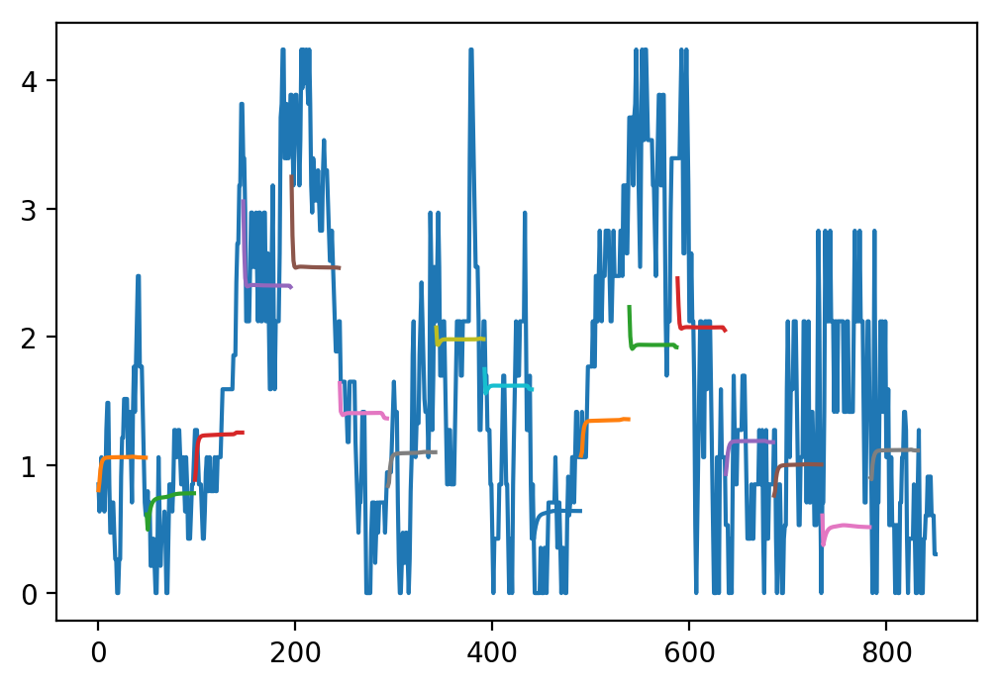

USING DATA: [..\data\IndicatorsAdded\HighVolume\BTC_XLM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 318s 383ms/step - loss: 0.2137
[Model] Training Completed. Model saved as saved_models\Model_MinMax3_WT_2018_10_15.h5
Time taken: 0:05:18.040399


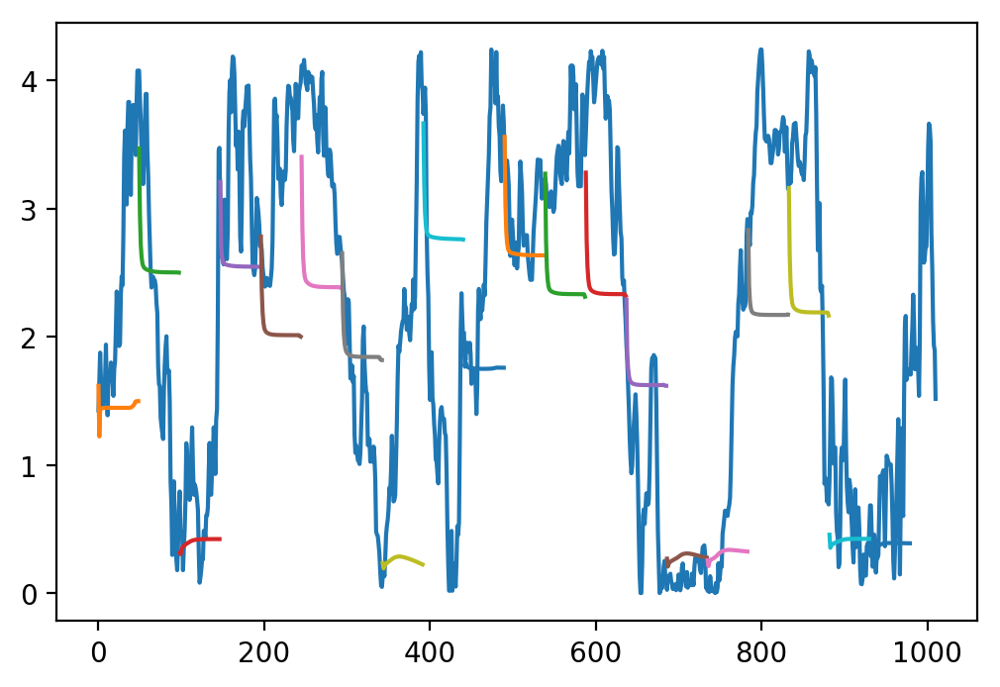

In [17]:
config['normalize'] = True
config['model_name'] = 'Model_MinMax3_WT'
config['input_dim'] = 32
config['sequence_length'] = 100
TrainTestPlot(config, columns, "MINMAX3_WT")

[Model] Model Compiled
USING DATA(1/40): [..\data\IndicatorsAdded\HighVolume\BTC_NEO.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 311s 374ms/step - loss: 1.3006
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:05:16.329016


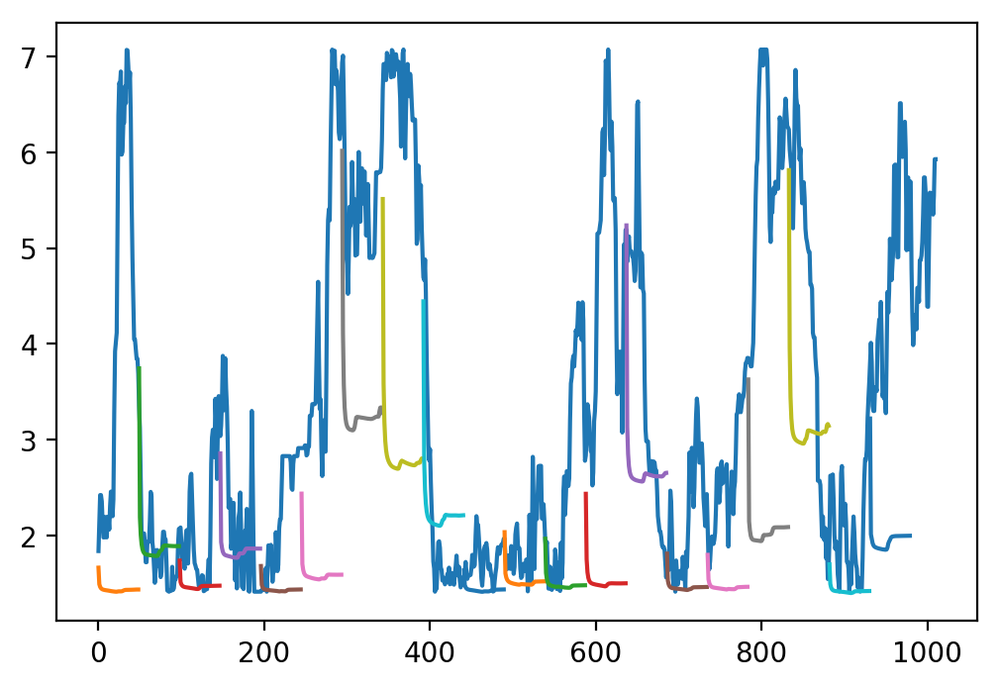

USING DATA(2/40): [..\data\IndicatorsAdded\HighVolume\BTC_NXT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 329 batches per epoch
Epoch 1/1
329/329 [==============================] - 129s 393ms/step - loss: 0.4962
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:02:09.241484


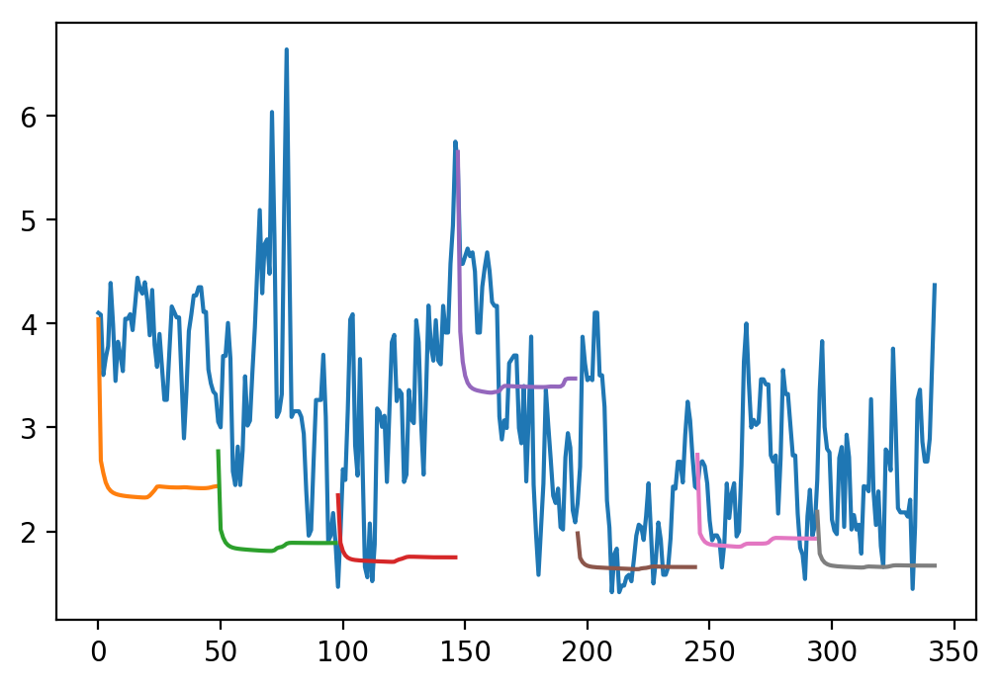

USING DATA(3/40): [..\data\IndicatorsAdded\HighVolume\BTC_XLM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 313s 377ms/step - loss: 0.4746
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:05:12.723964


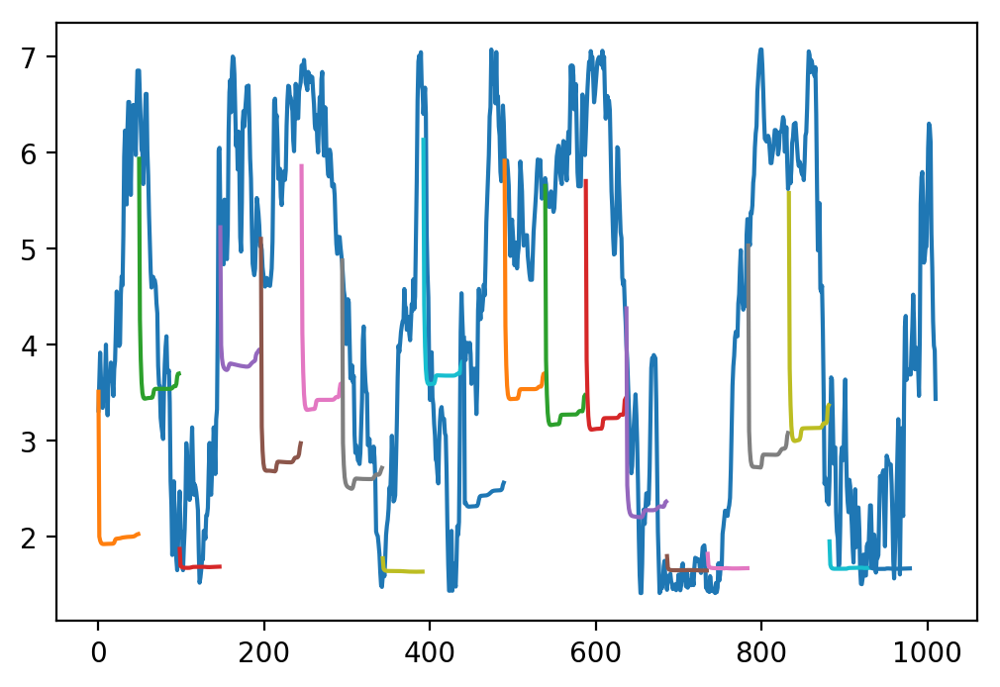

USING DATA(4/40): [..\data\IndicatorsAdded\MedVolume\BTC_FUN.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 389 batches per epoch
Epoch 1/1
389/389 [==============================] - 143s 368ms/step - loss: 0.4793
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:02:23.369414


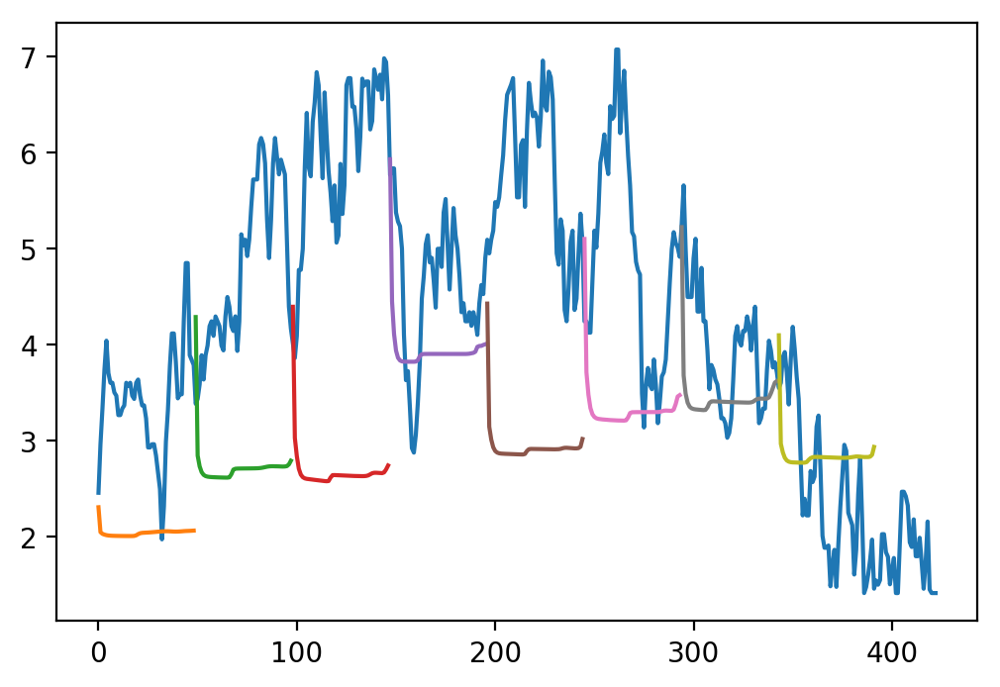

USING DATA(5/40): [..\data\IndicatorsAdded\VHighVolume\BTC_XRP.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 325s 392ms/step - loss: 0.4254
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:05:25.274702


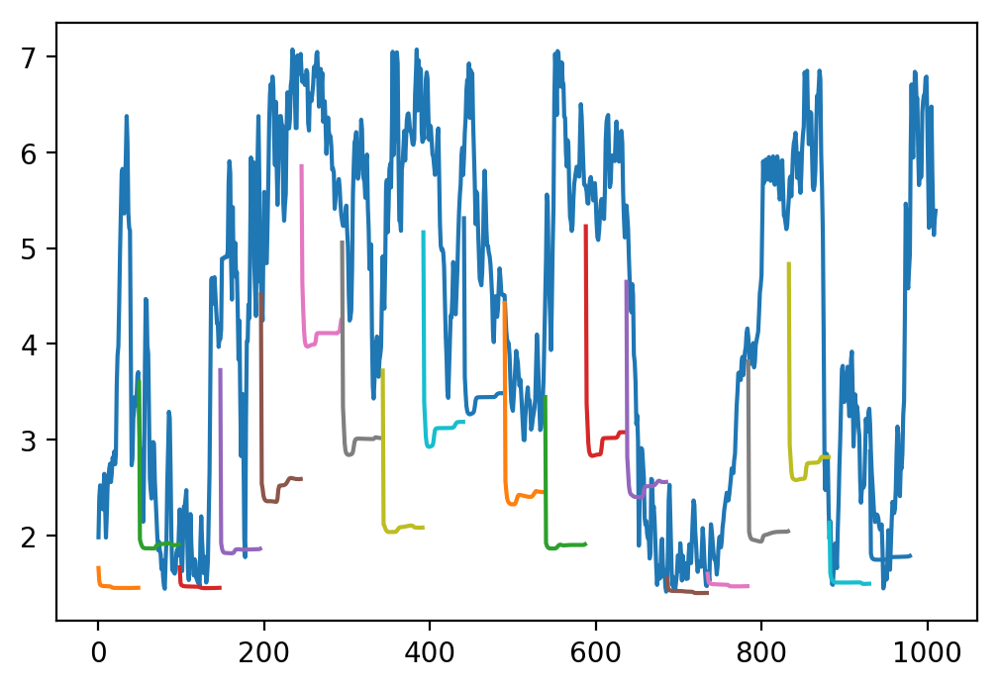

USING DATA(6/40): [..\data\IndicatorsAdded\MedVolume\BTC_XEM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 634 batches per epoch
Epoch 1/1
634/634 [==============================] - 260s 411ms/step - loss: 0.4451
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:04:20.465143


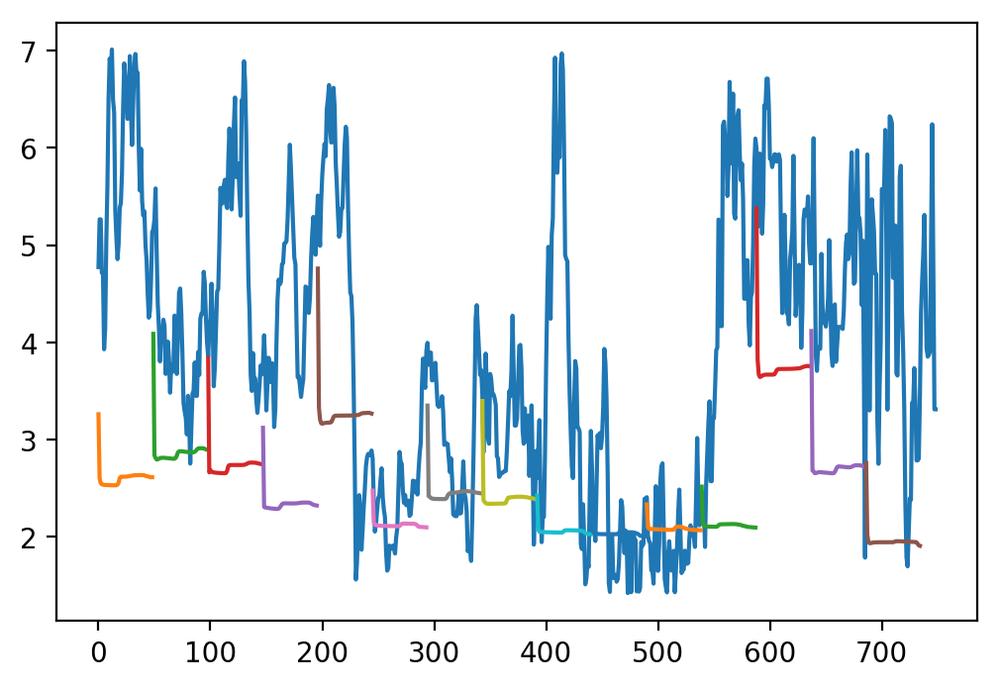

USING DATA(7/40): [..\data\IndicatorsAdded\MedVolume\BTC_VTC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 320 batches per epoch
Epoch 1/1
320/320 [==============================] - 121s 379ms/step - loss: 0.4253
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:02:01.284212


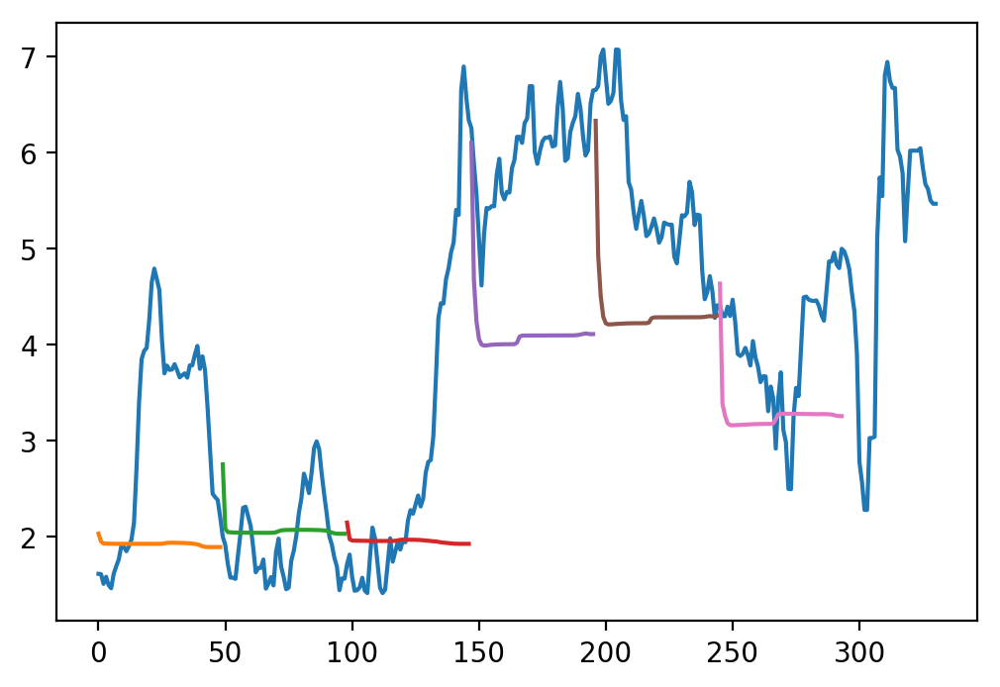

USING DATA(8/40): [..\data\IndicatorsAdded\MedVolume\BTC_DASH.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 648 batches per epoch
Epoch 1/1
648/648 [==============================] - 254s 391ms/step - loss: 0.5078
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:04:13.656234


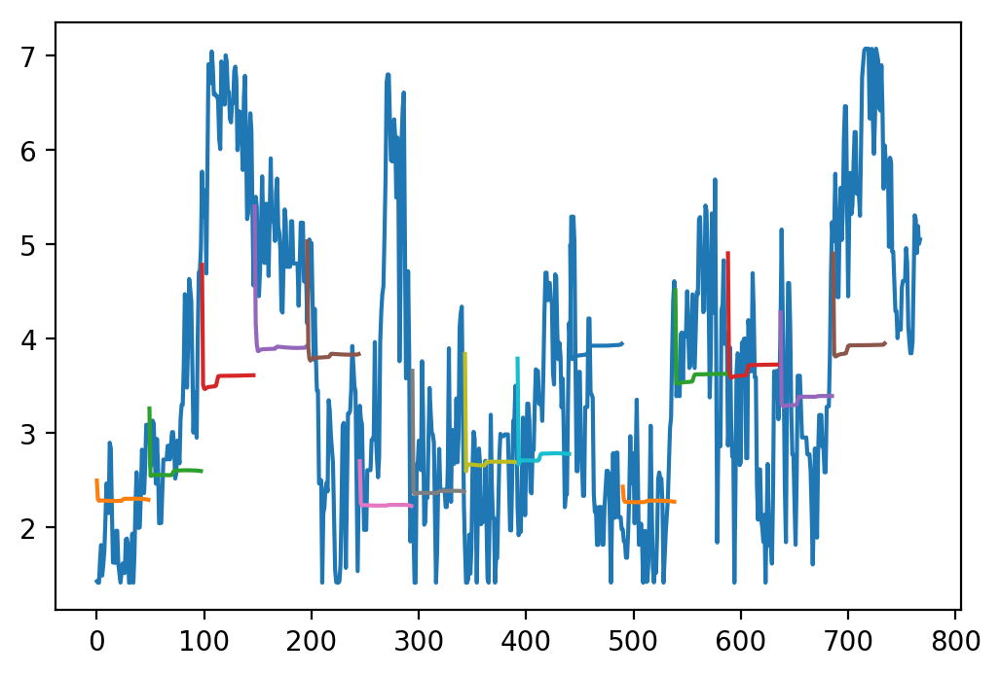

USING DATA(9/40): [..\data\IndicatorsAdded\VHighVolume\BTC_BCC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 318s 383ms/step - loss: 0.4424
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:05:17.865059


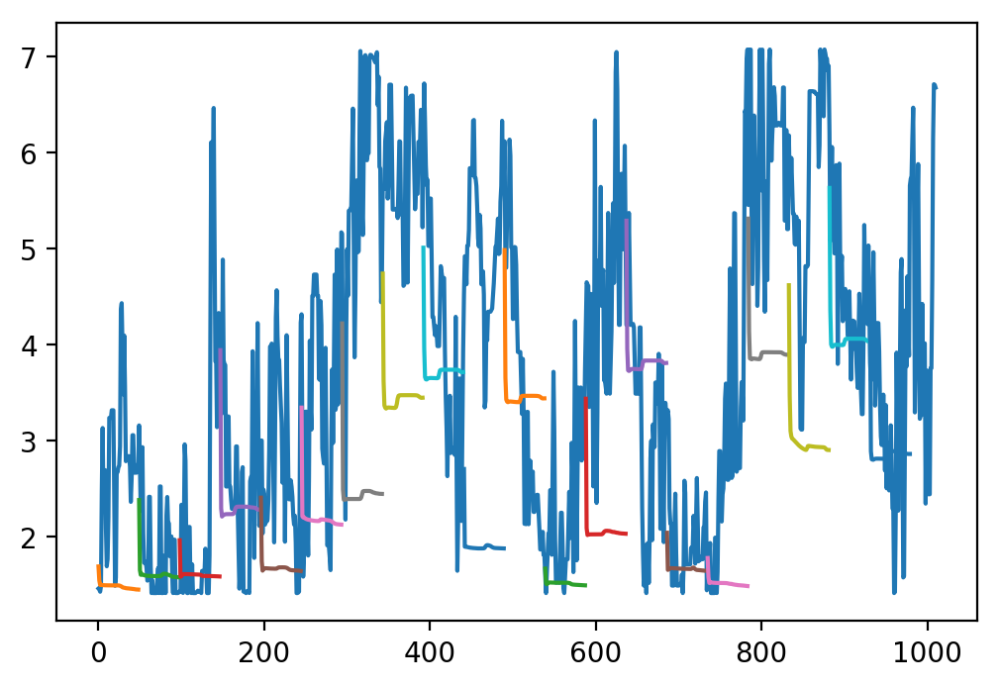

USING DATA(10/40): [..\data\IndicatorsAdded\MedVolume\BTC_RCN.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 476 batches per epoch
Epoch 1/1
476/476 [==============================] - 185s 389ms/step - loss: 0.4145
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:03:05.319028


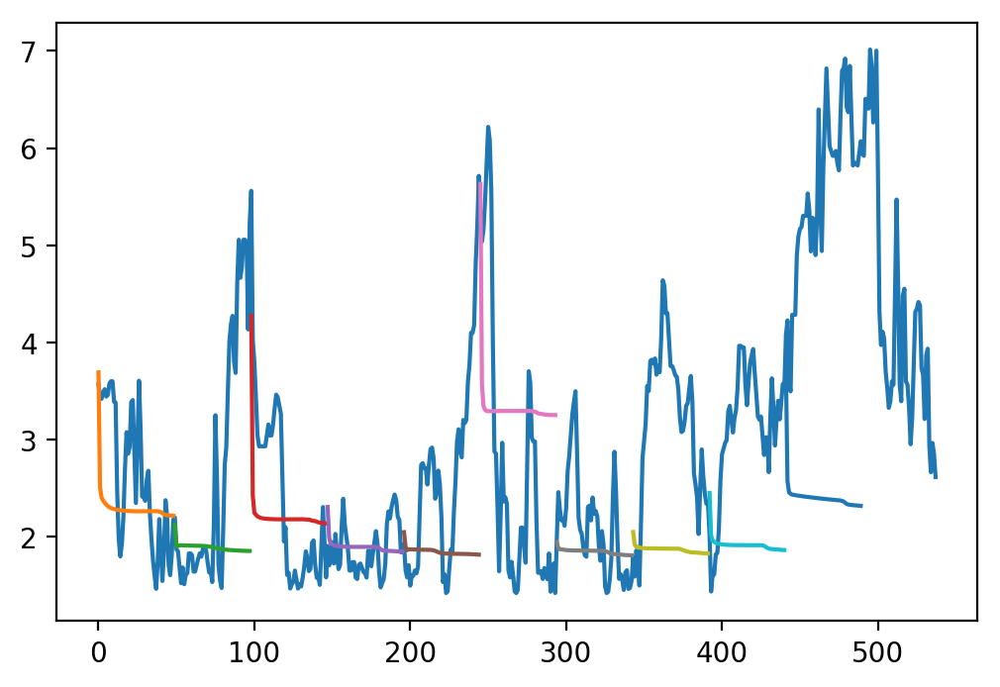

USING DATA(11/40): [..\data\IndicatorsAdded\MedVolume\BTC_EMC2.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 492 batches per epoch
Epoch 1/1
492/492 [==============================] - 194s 394ms/step - loss: 0.3840
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:03:13.676077


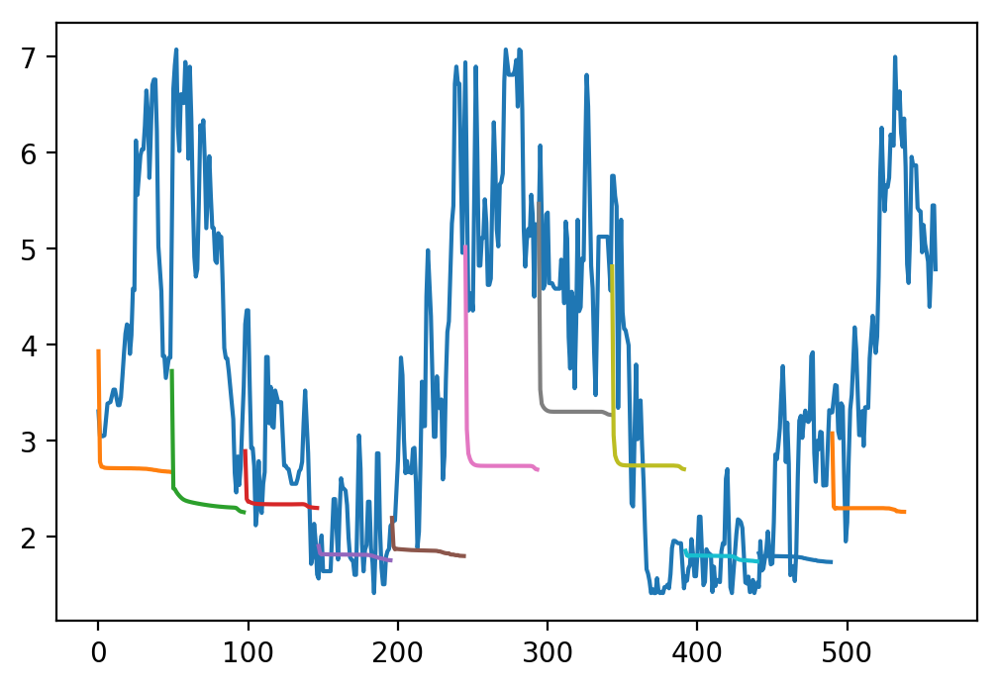

USING DATA(12/40): [..\data\IndicatorsAdded\MedVolume\BTC_RISE.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 314 batches per epoch
Epoch 1/1
314/314 [==============================] - 121s 387ms/step - loss: 0.4518
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:02:01.564748


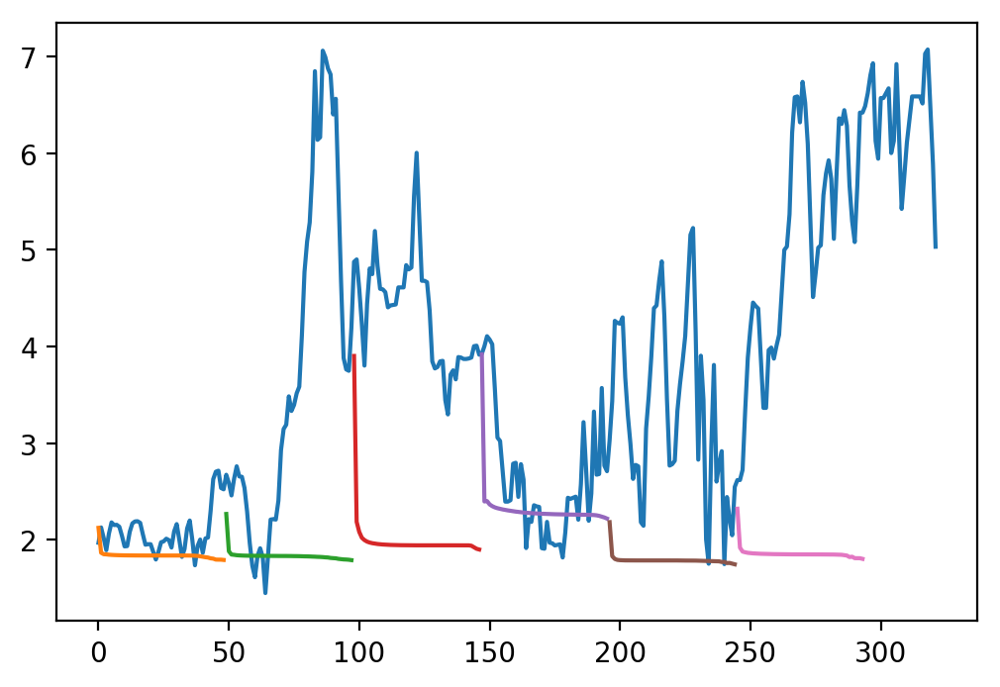

USING DATA(13/40): [..\data\IndicatorsAdded\VHighVolume\BTC_ETH.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 830 batches per epoch
Epoch 1/1
830/830 [==============================] - 358s 432ms/step - loss: 0.4457
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:05:58.430183


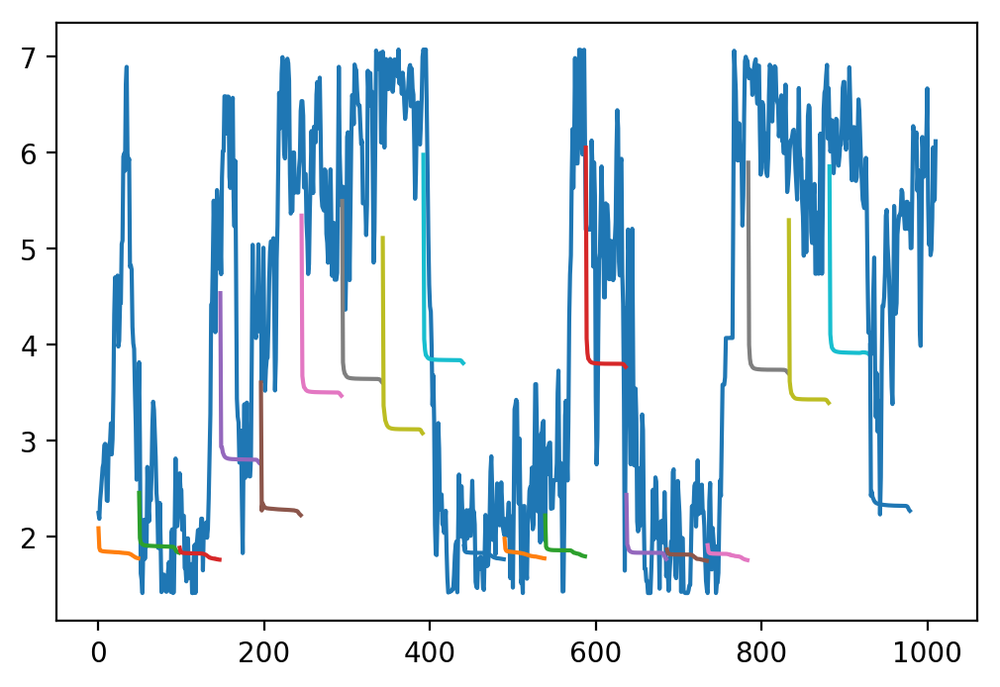

USING DATA(14/40): [..\data\IndicatorsAdded\MedVolume\BTC_QTUM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 568 batches per epoch
Epoch 1/1
568/568 [==============================] - 227s 399ms/step - loss: 0.4508
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:03:46.837925


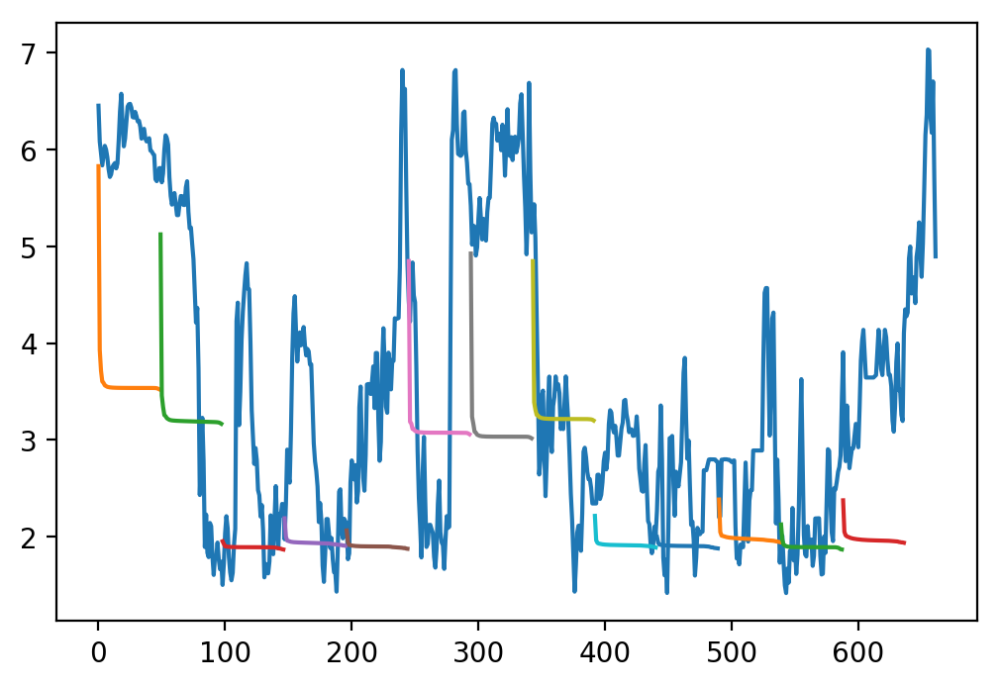

USING DATA(15/40): [..\data\IndicatorsAdded\VHighVolume\BTC_ADA.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 431 batches per epoch
Epoch 1/1
431/431 [==============================] - 173s 400ms/step - loss: 0.4183
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:02:52.609866


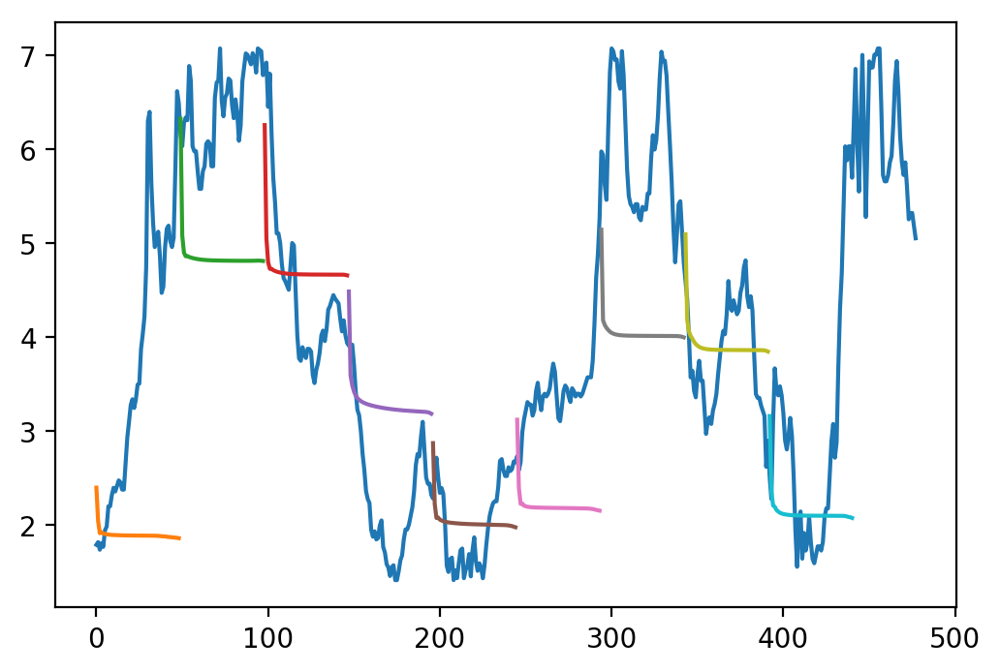

USING DATA(16/40): [..\data\IndicatorsAdded\MedVolume\BTC_BTG.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 781 batches per epoch
Epoch 1/1
781/781 [==============================] - 303s 388ms/step - loss: 0.4625
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:05:03.160297


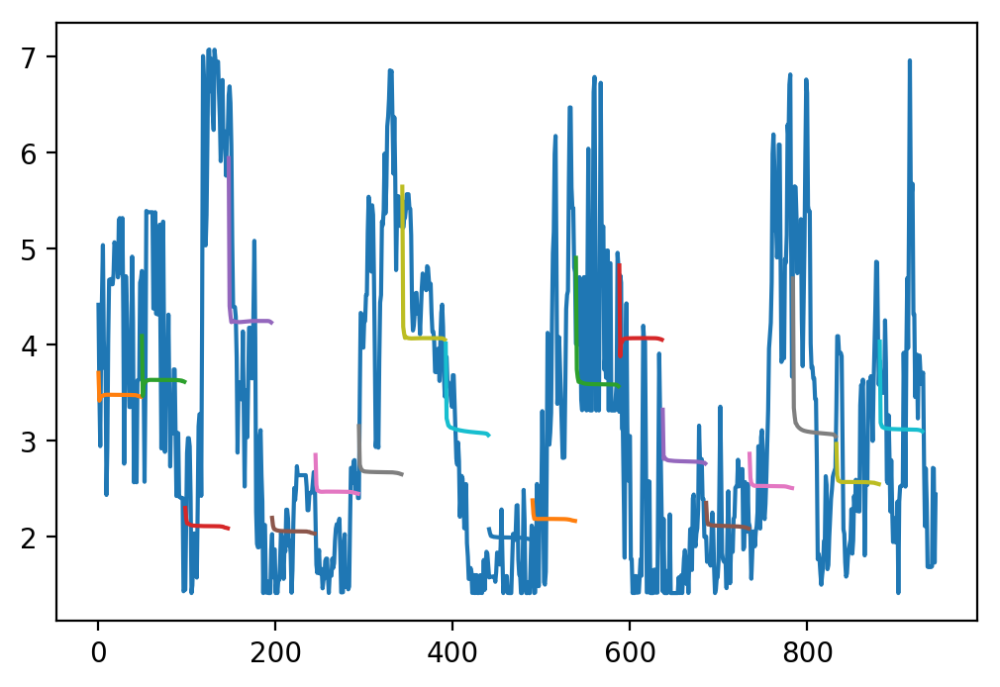

USING DATA(17/40): [..\data\IndicatorsAdded\MedVolume\BTC_SNT.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 535 batches per epoch
Epoch 1/1
535/535 [==============================] - 206s 386ms/step - loss: 0.4380
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:03:26.359679


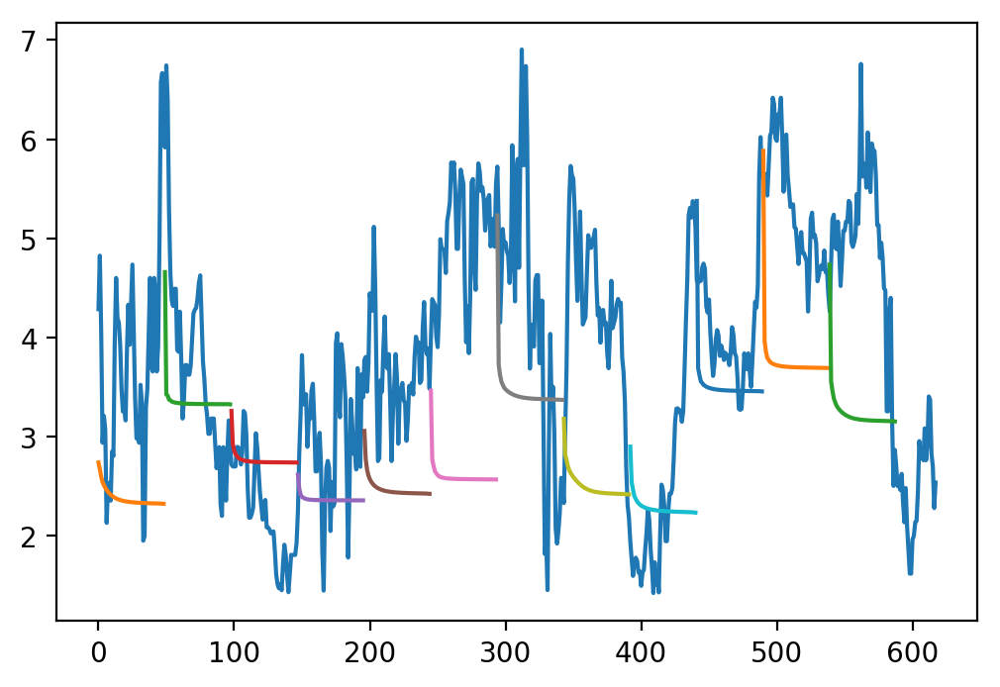

USING DATA(18/40): [..\data\IndicatorsAdded\MedVolume\BTC_PAY.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 504 batches per epoch
Epoch 1/1
504/504 [==============================] - 194s 384ms/step - loss: 0.4050
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:03:13.678942


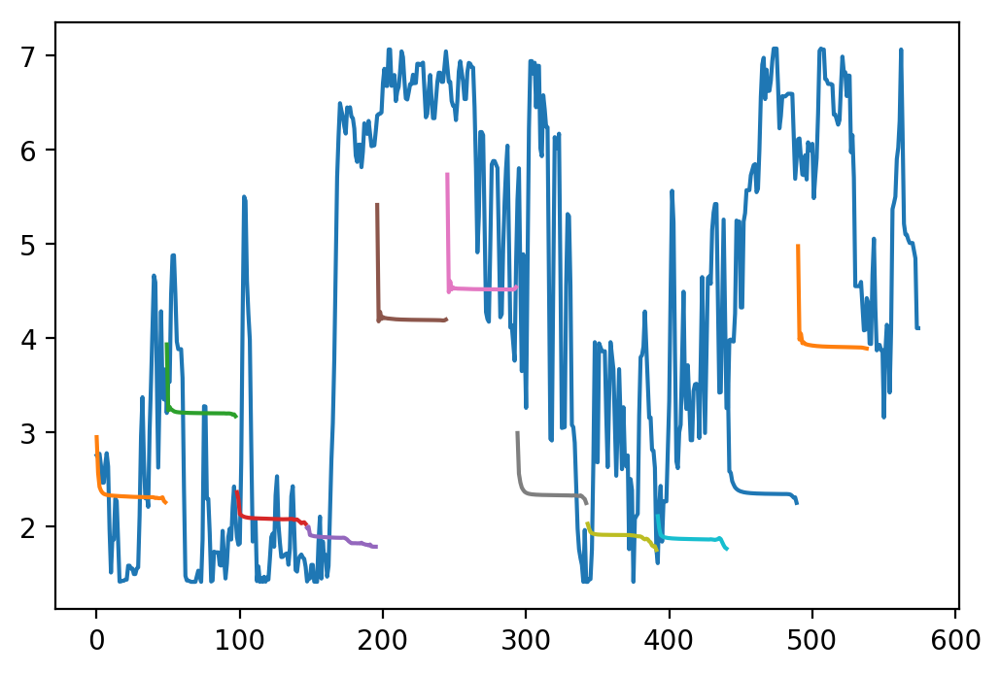

USING DATA(19/40): [..\data\IndicatorsAdded\MedVolume\BTC_STEEM.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 567 batches per epoch
Epoch 1/1
567/567 [==============================] - 217s 382ms/step - loss: 0.4371
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:03:36.919953


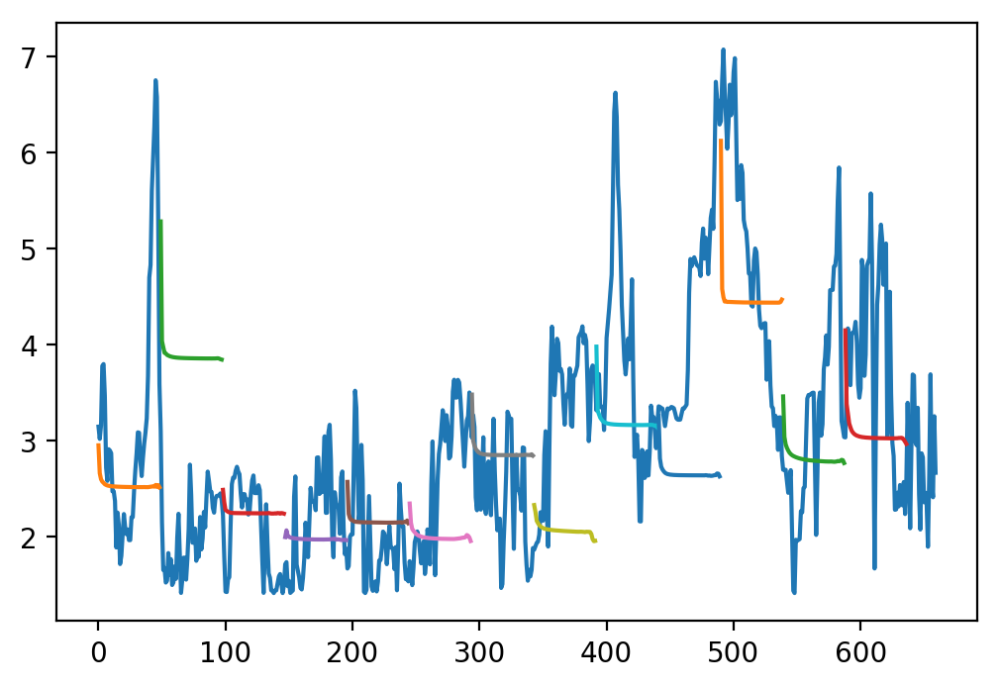

USING DATA(20/40): [..\data\IndicatorsAdded\MedVolume\BTC_LSK.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 806 batches per epoch
Epoch 1/1
806/806 [==============================] - 312s 388ms/step - loss: 0.4119
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:05:12.522817


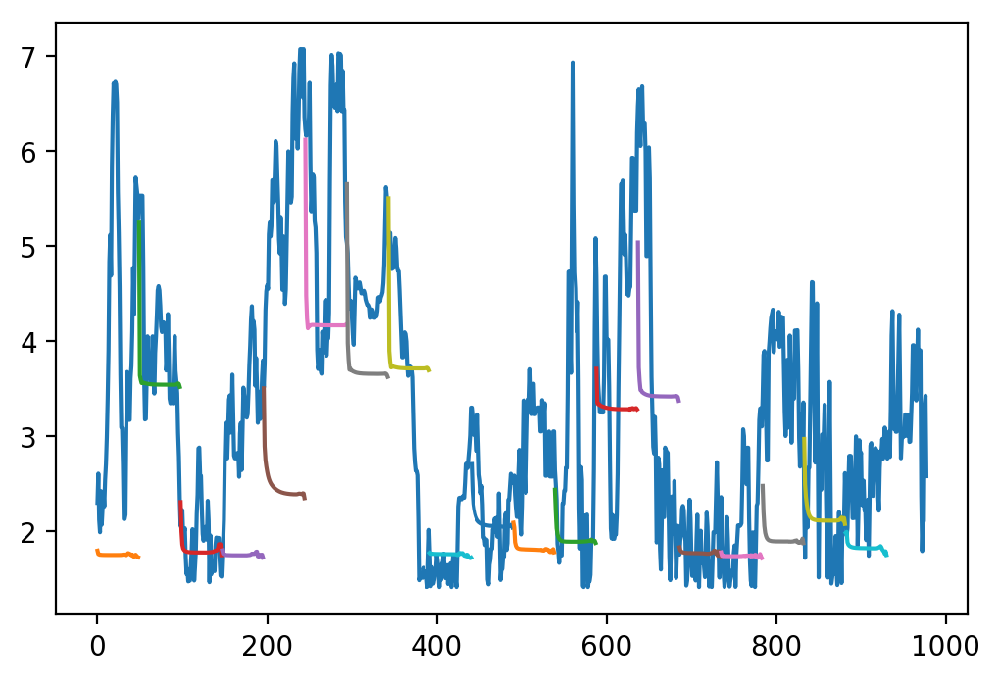

USING DATA(21/40): [..\data\IndicatorsAdded\HighVolume\BTC_SC.csv]
[Model] Training Started
[Model] 1 epochs, 32 batch size, 710 batches per epoch
Epoch 1/1
710/710 [==============================] - 273s 385ms/step - loss: 0.4389
[Model] Training Completed. Model saved as saved_models\Model_MinMax1_5_WT_2018_10_16.h5
Time taken: 0:04:33.440365


KeyboardInterrupt: 

In [17]:
config['normalize'] = True
config['model_name'] = 'Model_MinMax1_5_WT'
config['input_dim'] = 32
config['sequence_length'] = 100
TrainTestPlot(config, columns, "MINMAX1_5_WT")